# Neural Variational Dropout Process (Demo Code)

This notebook shows how to train and sample from a Neural Process for a simple class of 1D functions. The functions are defined by f(x|a=sin) = sin(x - b * pi), f(x|a=cos) = sin(x - b * pi), and f(x|a=tan) = 10 * tan(x - b * pi), where a and c are randomly sampled.

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import torch
from torch import nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
import math
from datasets import *
from math import pi
from random import randint
from torch.utils.data import DataLoader
import random
from matplotlib import rcParams
from torch.distributions.normal import Normal 

%matplotlib inline
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

seed = 3
torch.manual_seed(seed) # 0
torch.cuda.manual_seed(seed) 
random.seed(seed)
np.random.seed(seed)

## Visualize Dataset and data

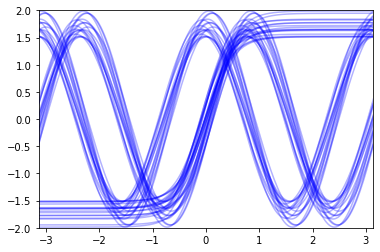

In [14]:
# Create dataset
dataset = TrigonometryData( amplitude_range=(1.5, 2), shift_range=(-.1, .1), num_samples=1000, num_points=200)
# Visualize data samples
for i in range(50):
    x, y = dataset[i] 
    plt.plot(x.numpy(), y.numpy(), c='b', alpha=0.3)
    plt.xlim(-pi, pi)
    plt.ylim(-2, 2)

(torch.Size([16, 200, 1]), torch.Size([16, 200, 1]))

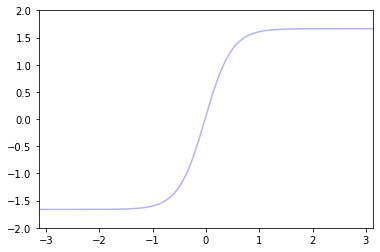

In [15]:
batch_size = 16 # 32

data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)
x,y = iter(data_loader).next()
jth = 7
plt.plot(x[jth].squeeze().numpy(), y[jth].squeeze().numpy(), c='b', alpha=0.3)
plt.xlim(-pi, pi)
plt.ylim(-2, 2)
x.size(), y.size()

## Loading Bayesian Neural Process Model

In [16]:
from models import *

class argclass:
    pass
args = argclass()

args.x_dim = 1
args.x_dim = 1
args.y_dim = 1
args.r_dim = 12 
args.h_dim = 12 
args.epochs = 1000

args.log_interval = 5
args.print_interval = 5

args.alpha = -2.0
#args.div_type = 'Bernoulli'
args.max_num_context = 97
args.num_total_points = 99 

model = LatentModel(args).cuda()
optimizer = torch.optim.Adam(model.parameters(), weight_decay=0.0001, lr=5e-4)

g_iter = 0
losses = []
iters = []

## Training Neural Process Model with variational prior

====> Epoch: 1 Average loss: 0.1593
====> Epoch: 2 Average loss: 0.1187
====> Epoch: 3 Average loss: 0.1109
====> Epoch: 4 Average loss: 0.1094
Train Epoch:5, Batch_idx:62, Loss:1.7715


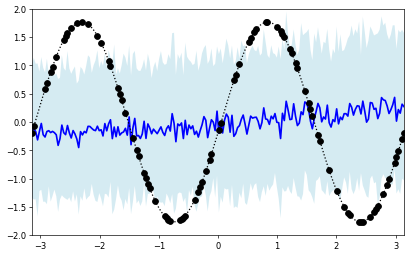

<Figure size 1100x550 with 0 Axes>

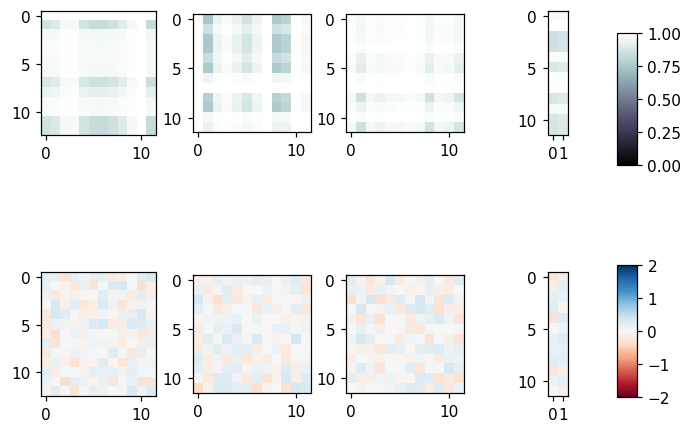

====> Epoch: 5 Average loss: 0.1089
====> Epoch: 6 Average loss: 0.1080
====> Epoch: 7 Average loss: 0.1076
====> Epoch: 8 Average loss: 0.1071
====> Epoch: 9 Average loss: 0.1062
Train Epoch:10, Batch_idx:62, Loss:1.5335


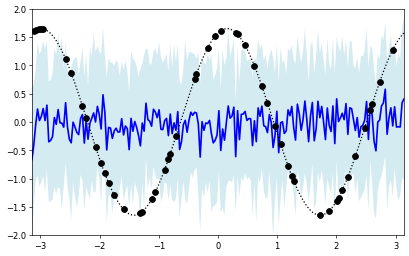

<Figure size 1100x550 with 0 Axes>

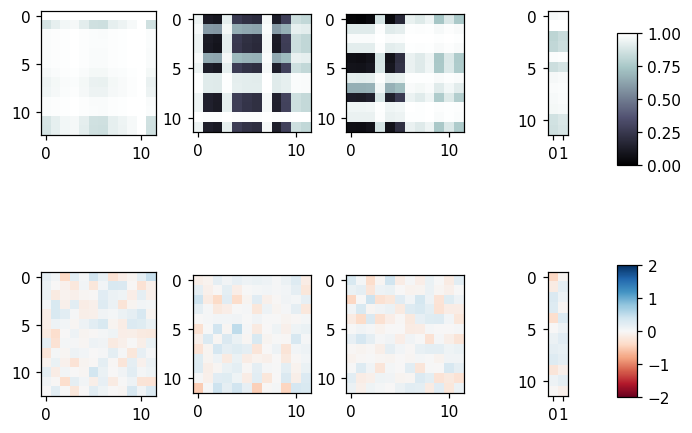

====> Epoch: 10 Average loss: 0.1026
====> Epoch: 11 Average loss: 0.0955
====> Epoch: 12 Average loss: 0.0881
====> Epoch: 13 Average loss: 0.0852
====> Epoch: 14 Average loss: 0.0824
Train Epoch:15, Batch_idx:62, Loss:1.0663


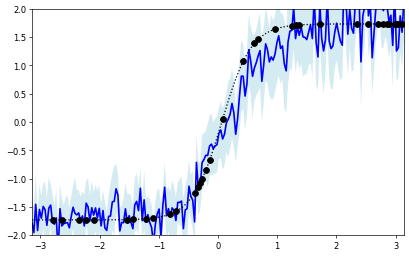

<Figure size 1100x550 with 0 Axes>

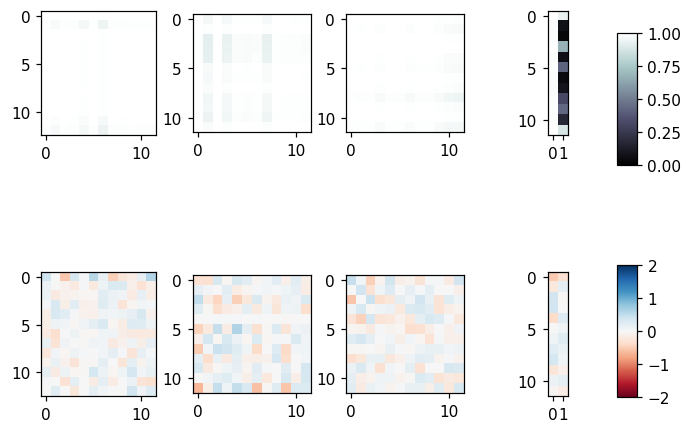

====> Epoch: 15 Average loss: 0.0792
====> Epoch: 16 Average loss: 0.0759
====> Epoch: 17 Average loss: 0.0720
====> Epoch: 18 Average loss: 0.0673
====> Epoch: 19 Average loss: 0.0633
Train Epoch:20, Batch_idx:62, Loss:1.2970


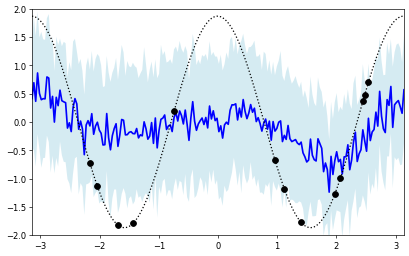

<Figure size 1100x550 with 0 Axes>

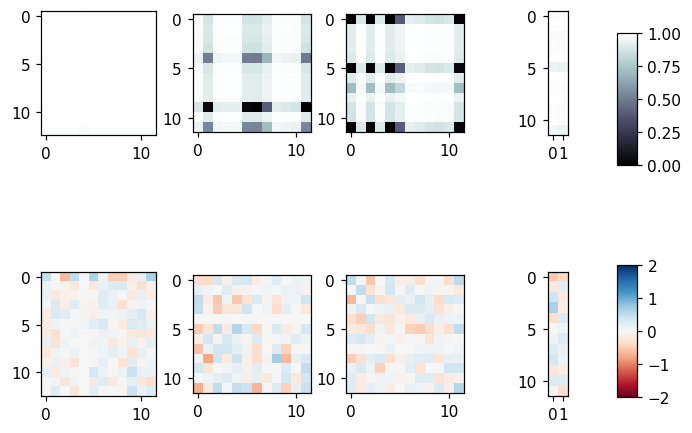

====> Epoch: 20 Average loss: 0.0600
====> Epoch: 21 Average loss: 0.0574
====> Epoch: 22 Average loss: 0.0584
====> Epoch: 23 Average loss: 0.0529
====> Epoch: 24 Average loss: 0.0490
Train Epoch:25, Batch_idx:62, Loss:0.4029


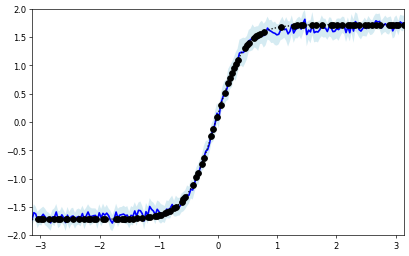

<Figure size 1100x550 with 0 Axes>

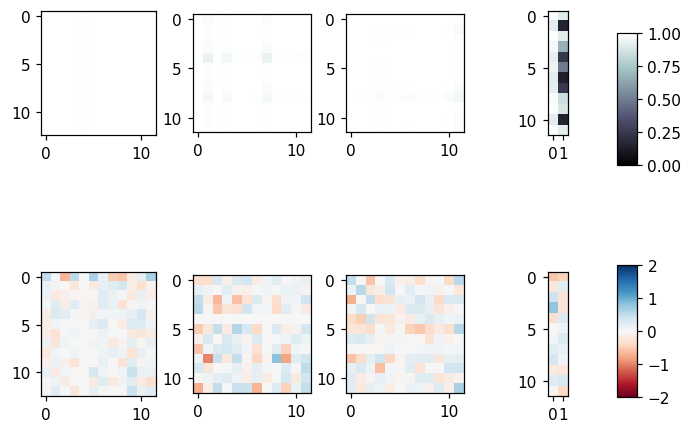

====> Epoch: 25 Average loss: 0.0486
====> Epoch: 26 Average loss: 0.0478
====> Epoch: 27 Average loss: 0.0424
====> Epoch: 28 Average loss: 0.0788
====> Epoch: 29 Average loss: 0.0740
Train Epoch:30, Batch_idx:62, Loss:0.4598


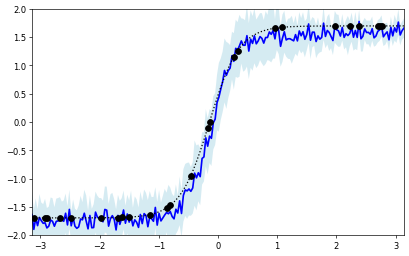

<Figure size 1100x550 with 0 Axes>

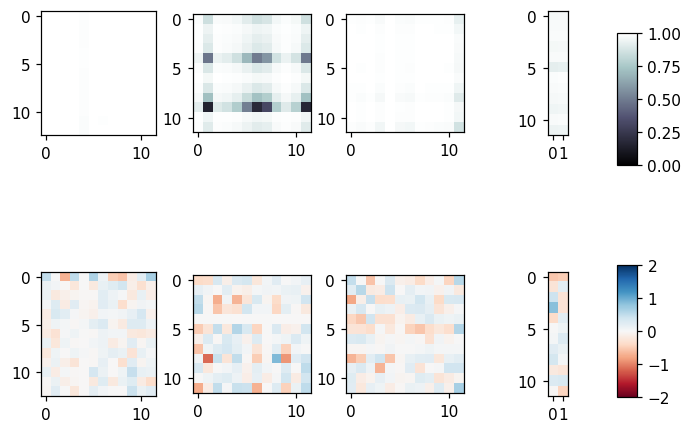

====> Epoch: 30 Average loss: 0.0672
====> Epoch: 31 Average loss: 0.0496
====> Epoch: 32 Average loss: 0.0422
====> Epoch: 33 Average loss: 0.0426
====> Epoch: 34 Average loss: 0.0395
Train Epoch:35, Batch_idx:62, Loss:1.6224


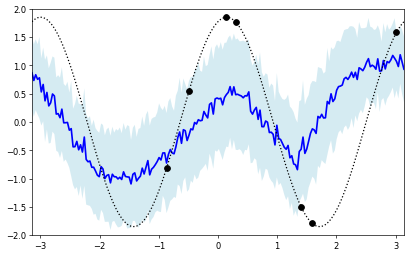

<Figure size 1100x550 with 0 Axes>

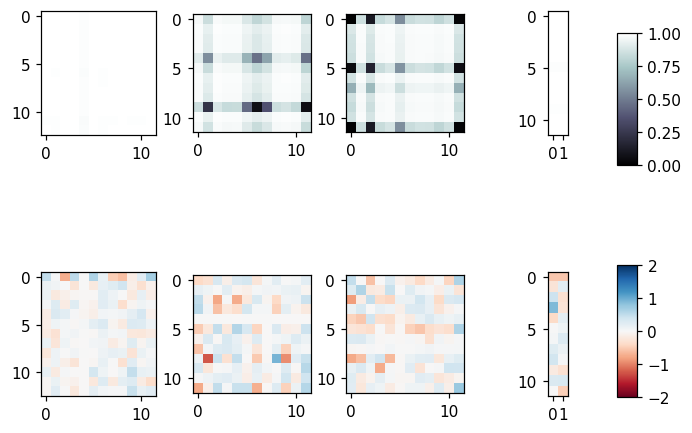

====> Epoch: 35 Average loss: 0.0426
====> Epoch: 36 Average loss: 0.0368
====> Epoch: 37 Average loss: 0.0394
====> Epoch: 38 Average loss: 0.0364
====> Epoch: 39 Average loss: 0.0378
Train Epoch:40, Batch_idx:62, Loss:0.3474


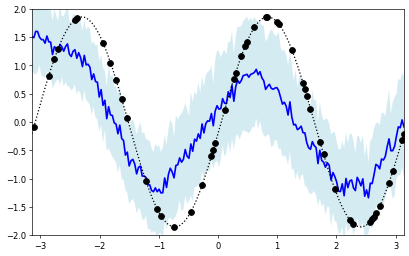

<Figure size 1100x550 with 0 Axes>

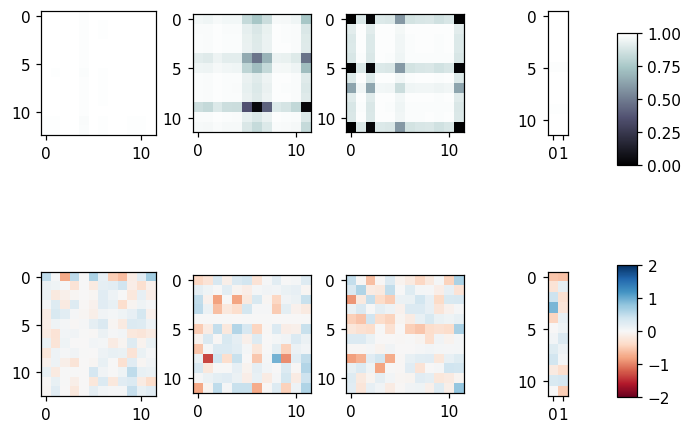

====> Epoch: 40 Average loss: 0.0350
====> Epoch: 41 Average loss: 0.0352
====> Epoch: 42 Average loss: 0.1068
====> Epoch: 43 Average loss: 0.0615
====> Epoch: 44 Average loss: 0.0552
Train Epoch:45, Batch_idx:62, Loss:0.6757


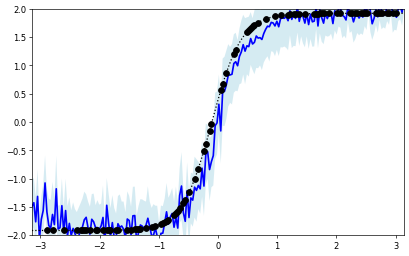

<Figure size 1100x550 with 0 Axes>

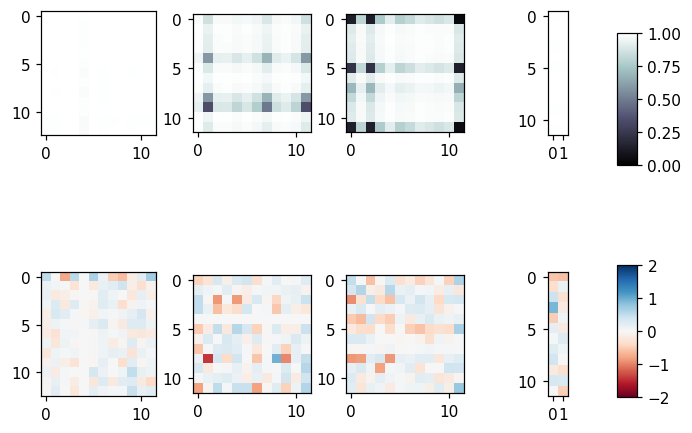

====> Epoch: 45 Average loss: 0.0510
====> Epoch: 46 Average loss: 0.0469
====> Epoch: 47 Average loss: 0.0498
====> Epoch: 48 Average loss: 0.0469
====> Epoch: 49 Average loss: 0.0405
Train Epoch:50, Batch_idx:62, Loss:0.5794


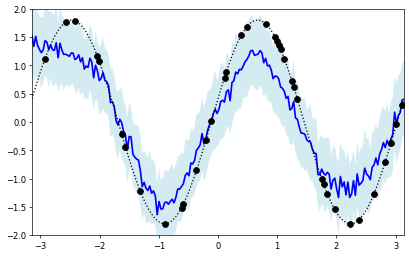

<Figure size 1100x550 with 0 Axes>

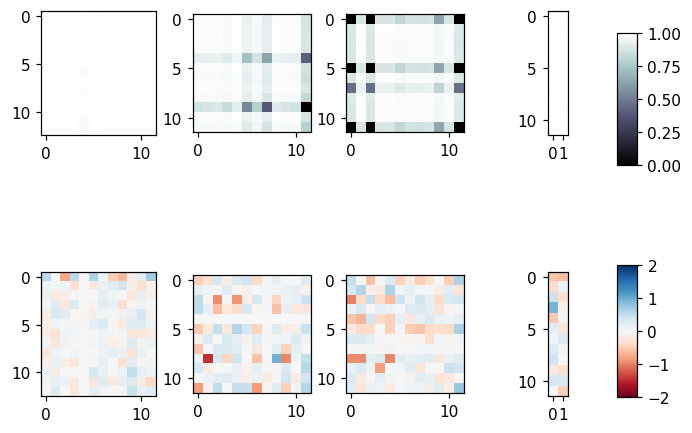

====> Epoch: 50 Average loss: 0.0488
====> Epoch: 51 Average loss: 0.0446
====> Epoch: 52 Average loss: 0.0422
====> Epoch: 53 Average loss: 0.0414
====> Epoch: 54 Average loss: 0.0406
Train Epoch:55, Batch_idx:62, Loss:0.3769


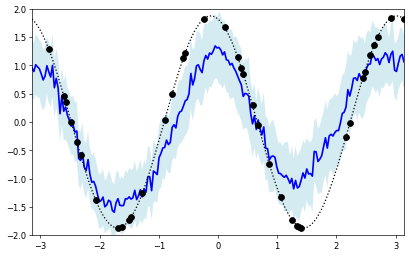

<Figure size 1100x550 with 0 Axes>

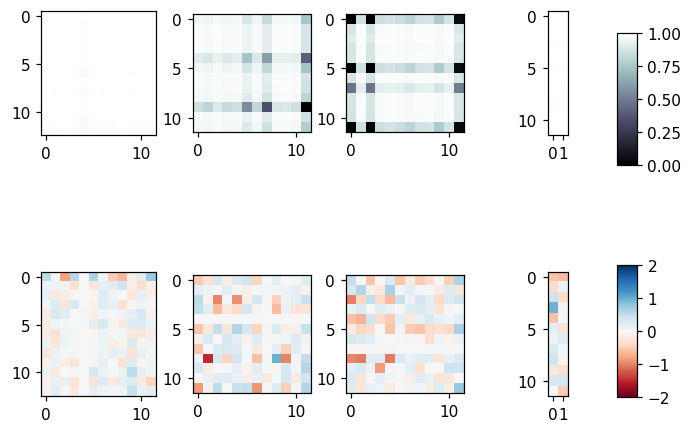

====> Epoch: 55 Average loss: 0.0419
====> Epoch: 56 Average loss: 0.0377
====> Epoch: 57 Average loss: 0.0331
====> Epoch: 58 Average loss: 0.0397
====> Epoch: 59 Average loss: 0.0279
Train Epoch:60, Batch_idx:62, Loss:1.7196


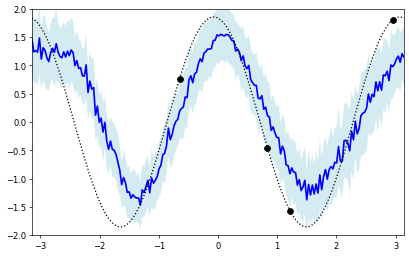

<Figure size 1100x550 with 0 Axes>

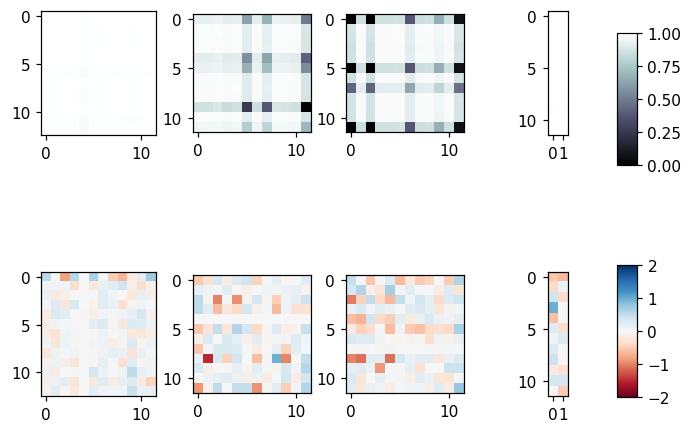

====> Epoch: 60 Average loss: 0.0386
====> Epoch: 61 Average loss: 0.0317
====> Epoch: 62 Average loss: 0.0295
====> Epoch: 63 Average loss: 0.0383
====> Epoch: 64 Average loss: 0.0312
Train Epoch:65, Batch_idx:62, Loss:0.4646


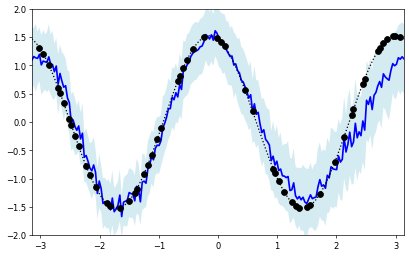

<Figure size 1100x550 with 0 Axes>

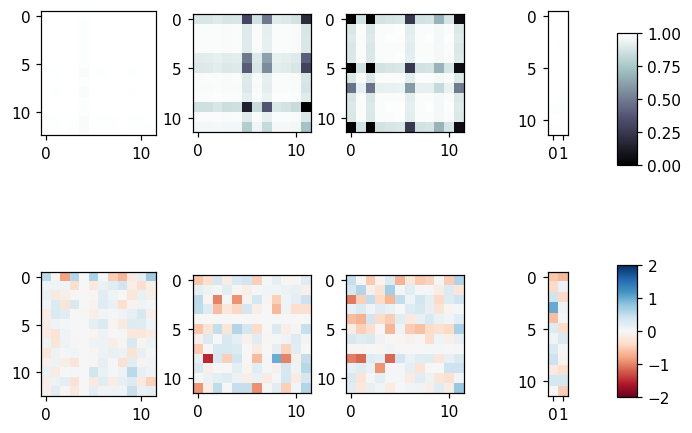

====> Epoch: 65 Average loss: 0.0367
====> Epoch: 66 Average loss: 0.0247
====> Epoch: 67 Average loss: 0.0303
====> Epoch: 68 Average loss: 0.0357
====> Epoch: 69 Average loss: 0.0304
Train Epoch:70, Batch_idx:62, Loss:0.2482


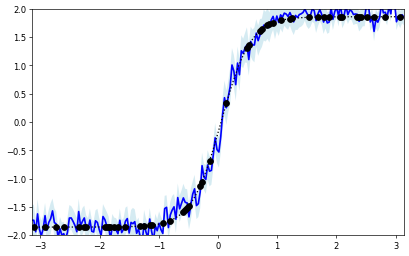

<Figure size 1100x550 with 0 Axes>

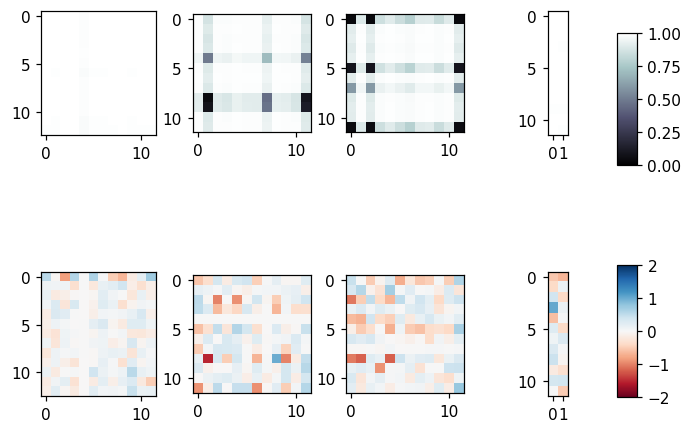

====> Epoch: 70 Average loss: 0.0263
====> Epoch: 71 Average loss: 0.0292
====> Epoch: 72 Average loss: 0.0211
====> Epoch: 73 Average loss: 0.0261
====> Epoch: 74 Average loss: 0.0294
Train Epoch:75, Batch_idx:62, Loss:0.2154


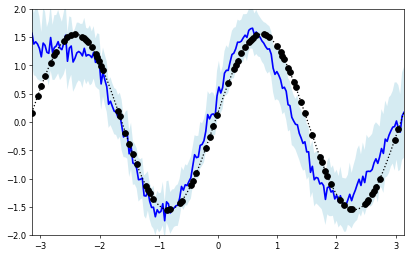

<Figure size 1100x550 with 0 Axes>

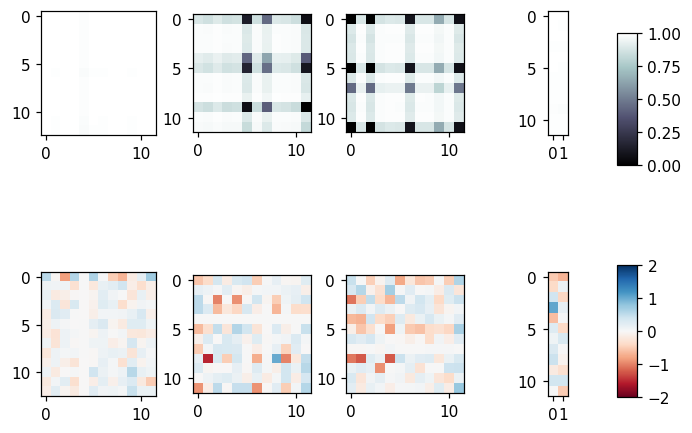

====> Epoch: 75 Average loss: 0.0196
====> Epoch: 76 Average loss: 0.0301
====> Epoch: 77 Average loss: 0.0296
====> Epoch: 78 Average loss: 0.0261
====> Epoch: 79 Average loss: 0.0189
Train Epoch:80, Batch_idx:62, Loss:-0.0191


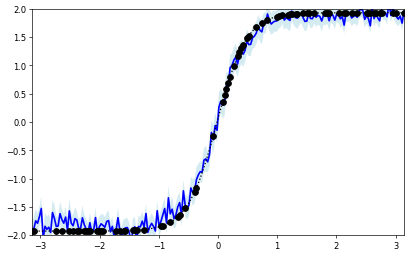

<Figure size 1100x550 with 0 Axes>

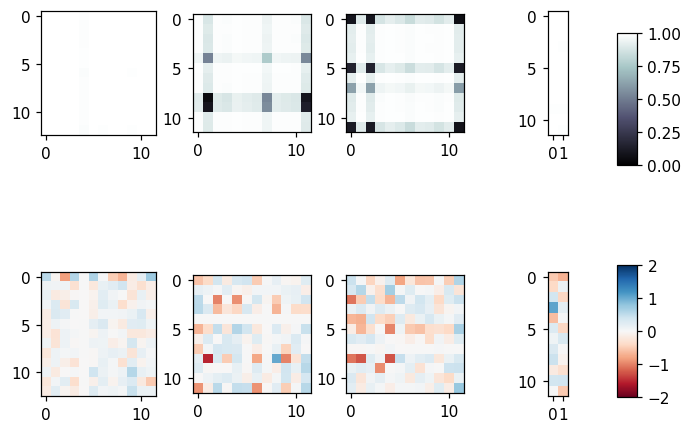

====> Epoch: 80 Average loss: 0.0182
====> Epoch: 81 Average loss: 0.0177
====> Epoch: 82 Average loss: 0.0204
====> Epoch: 83 Average loss: 0.0366
====> Epoch: 84 Average loss: 0.0267
Train Epoch:85, Batch_idx:62, Loss:0.3066


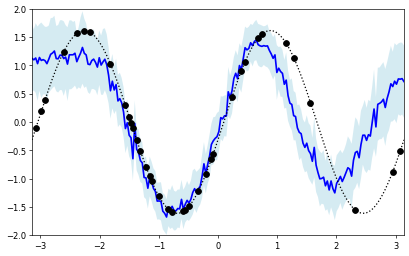

<Figure size 1100x550 with 0 Axes>

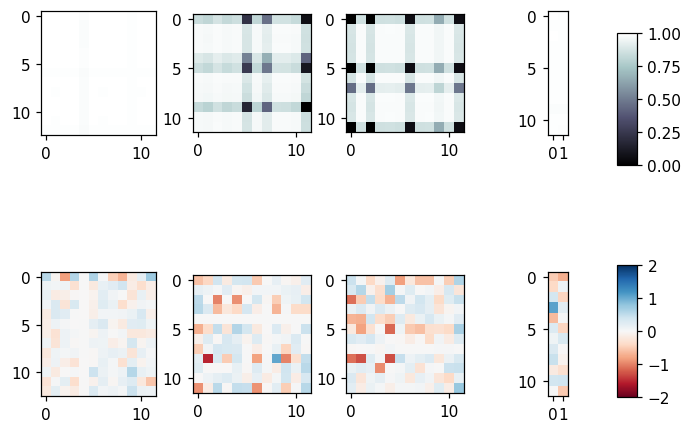

====> Epoch: 85 Average loss: 0.0150
====> Epoch: 86 Average loss: 0.0202
====> Epoch: 87 Average loss: 0.0197
====> Epoch: 88 Average loss: 0.0143
====> Epoch: 89 Average loss: 0.0170
Train Epoch:90, Batch_idx:62, Loss:-0.0829


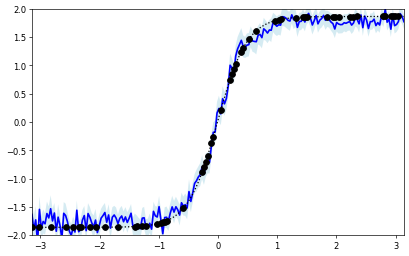

<Figure size 1100x550 with 0 Axes>

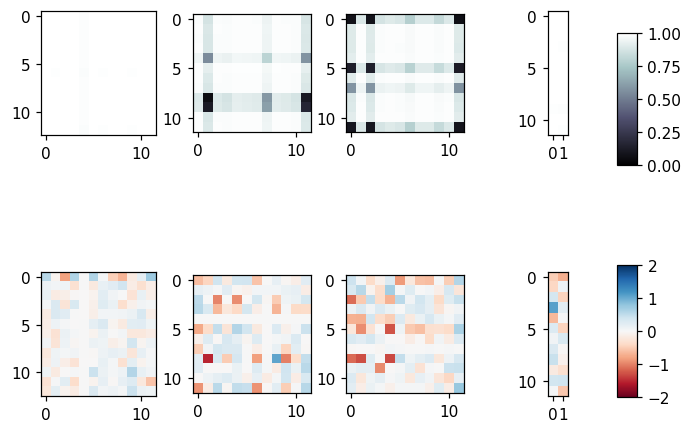

====> Epoch: 90 Average loss: 0.0147
====> Epoch: 91 Average loss: 0.0128
====> Epoch: 92 Average loss: 0.0132
====> Epoch: 93 Average loss: 0.0112
====> Epoch: 94 Average loss: 0.0144
Train Epoch:95, Batch_idx:62, Loss:-0.1605


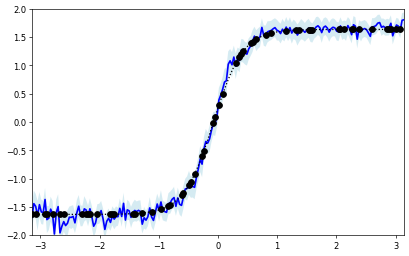

<Figure size 1100x550 with 0 Axes>

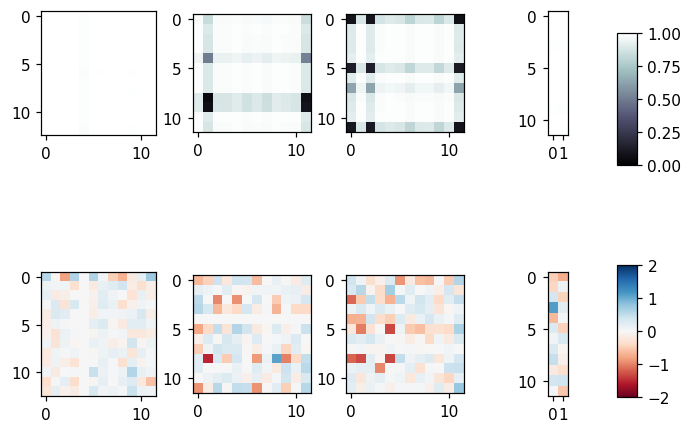

====> Epoch: 95 Average loss: 0.0121
====> Epoch: 96 Average loss: 0.0264
====> Epoch: 97 Average loss: 0.0097
====> Epoch: 98 Average loss: 0.0049
====> Epoch: 99 Average loss: 0.0040
Train Epoch:100, Batch_idx:62, Loss:-0.0841


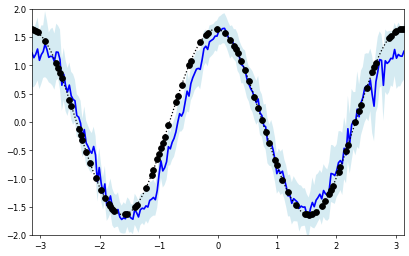

<Figure size 1100x550 with 0 Axes>

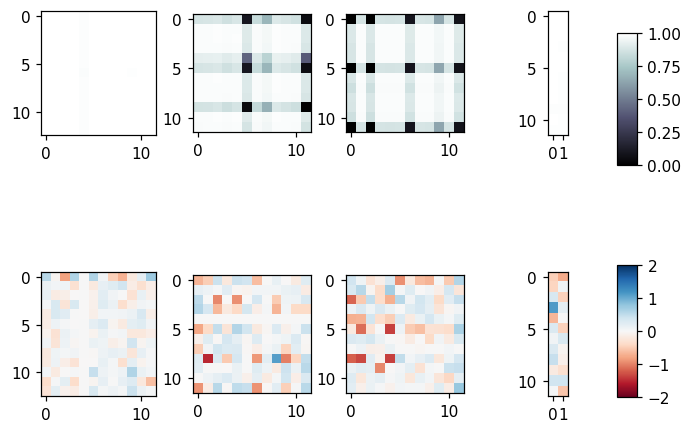

====> Epoch: 100 Average loss: 0.0072
====> Epoch: 101 Average loss: 0.0091
====> Epoch: 102 Average loss: 0.0070
====> Epoch: 103 Average loss: 0.0101
====> Epoch: 104 Average loss: 0.0130
Train Epoch:105, Batch_idx:62, Loss:0.0812


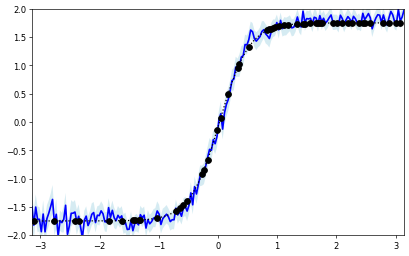

<Figure size 1100x550 with 0 Axes>

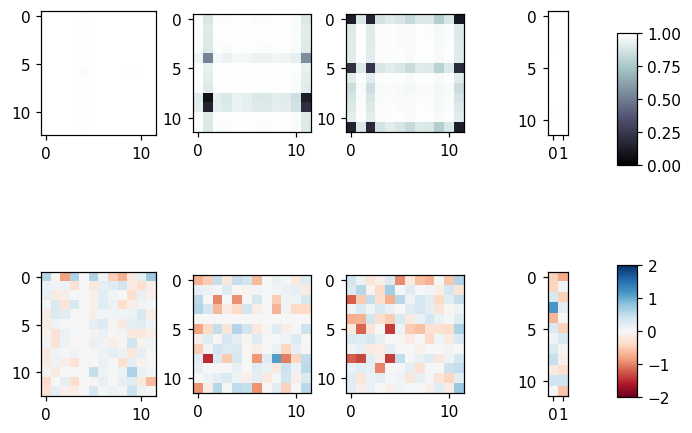

====> Epoch: 105 Average loss: 0.0068
====> Epoch: 106 Average loss: 0.0145
====> Epoch: 107 Average loss: 0.0094
====> Epoch: 108 Average loss: 0.0098
====> Epoch: 109 Average loss: 0.0062
Train Epoch:110, Batch_idx:62, Loss:-0.2520


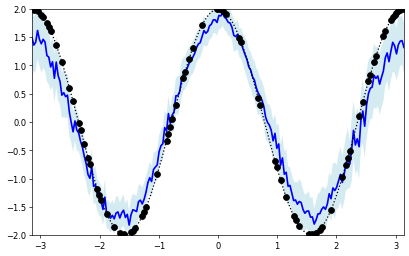

<Figure size 1100x550 with 0 Axes>

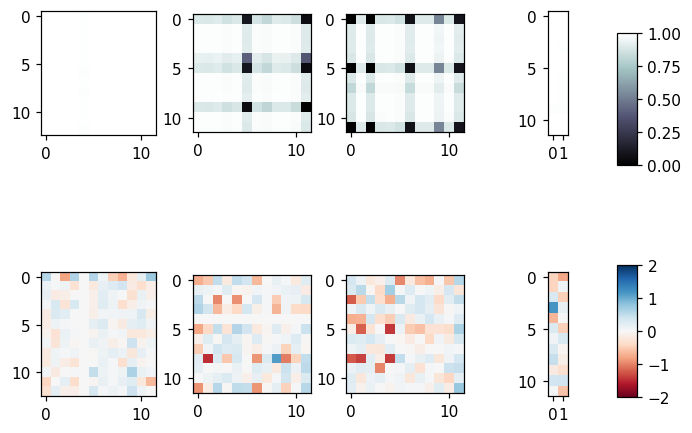

====> Epoch: 110 Average loss: 0.0057
====> Epoch: 111 Average loss: 0.0031
====> Epoch: 112 Average loss: 0.0072
====> Epoch: 113 Average loss: 0.0020
====> Epoch: 114 Average loss: 0.0018
Train Epoch:115, Batch_idx:62, Loss:0.0236


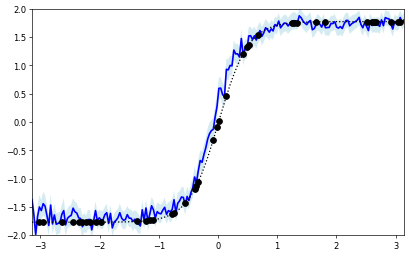

<Figure size 1100x550 with 0 Axes>

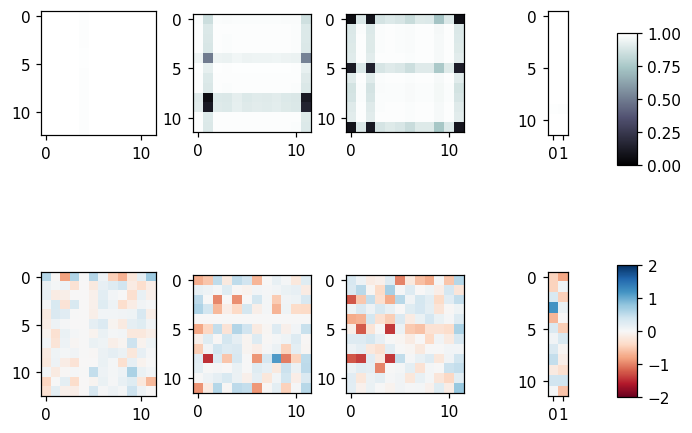

====> Epoch: 115 Average loss: 0.0061
====> Epoch: 116 Average loss: 0.0058
====> Epoch: 117 Average loss: 0.0165
====> Epoch: 118 Average loss: -0.0009
====> Epoch: 119 Average loss: -0.0030
Train Epoch:120, Batch_idx:62, Loss:-0.1462


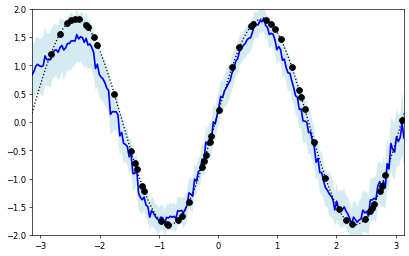

<Figure size 1100x550 with 0 Axes>

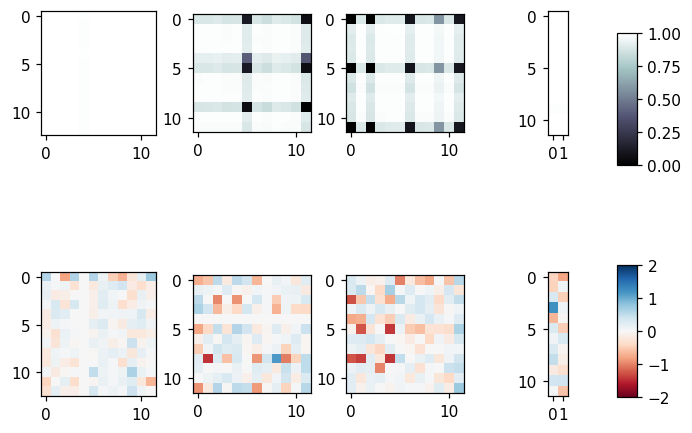

====> Epoch: 120 Average loss: 0.0043
====> Epoch: 121 Average loss: 0.0024
====> Epoch: 122 Average loss: 0.0031
====> Epoch: 123 Average loss: 0.0050
====> Epoch: 124 Average loss: 0.0169
Train Epoch:125, Batch_idx:62, Loss:-0.2049


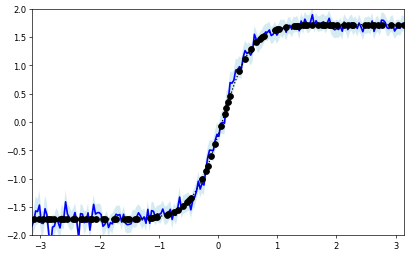

<Figure size 1100x550 with 0 Axes>

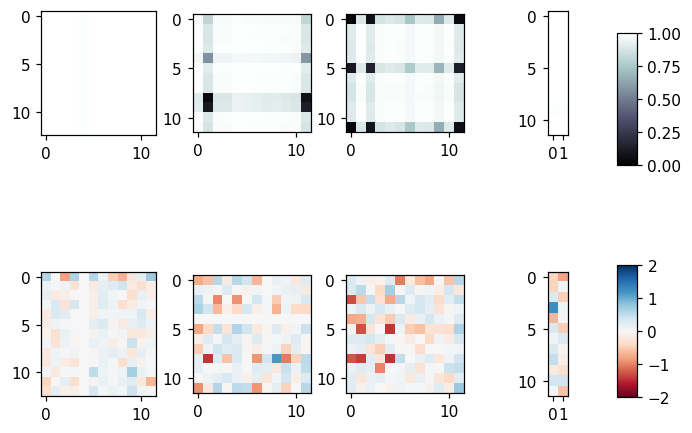

====> Epoch: 125 Average loss: 0.0002
====> Epoch: 126 Average loss: -0.0017
====> Epoch: 127 Average loss: 0.0016
====> Epoch: 128 Average loss: -0.0016
====> Epoch: 129 Average loss: 0.0002
Train Epoch:130, Batch_idx:62, Loss:-0.3121


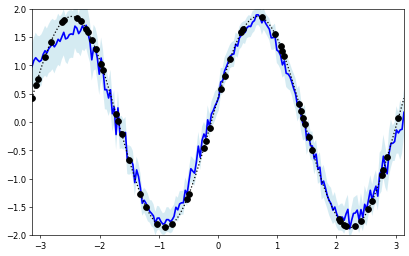

<Figure size 1100x550 with 0 Axes>

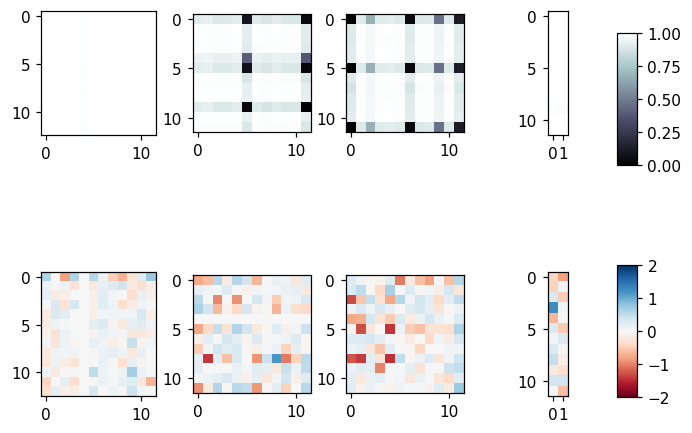

====> Epoch: 130 Average loss: -0.0062
====> Epoch: 131 Average loss: -0.0018
====> Epoch: 132 Average loss: 0.0051
====> Epoch: 133 Average loss: 0.0003
====> Epoch: 134 Average loss: -0.0029
Train Epoch:135, Batch_idx:62, Loss:-0.2436


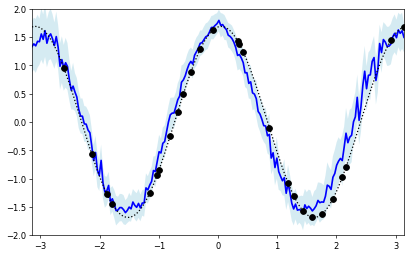

<Figure size 1100x550 with 0 Axes>

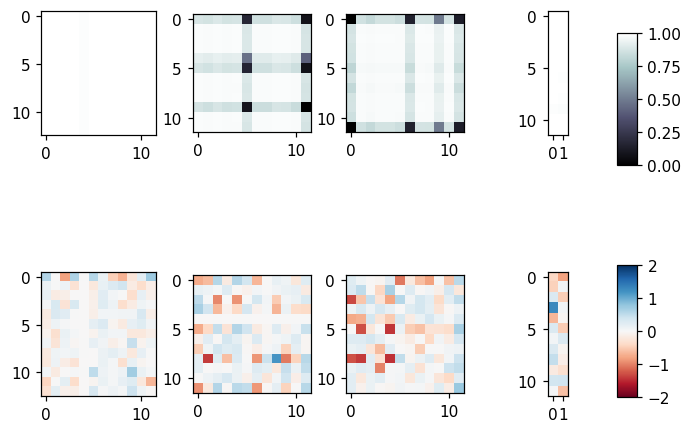

====> Epoch: 135 Average loss: -0.0071
====> Epoch: 136 Average loss: -0.0040
====> Epoch: 137 Average loss: -0.0044
====> Epoch: 138 Average loss: 0.0027
====> Epoch: 139 Average loss: -0.0021
Train Epoch:140, Batch_idx:62, Loss:-0.4529


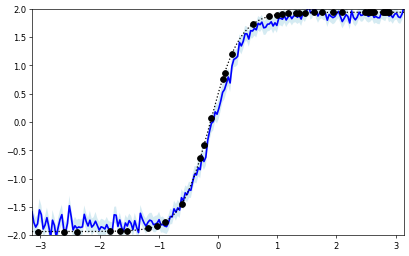

<Figure size 1100x550 with 0 Axes>

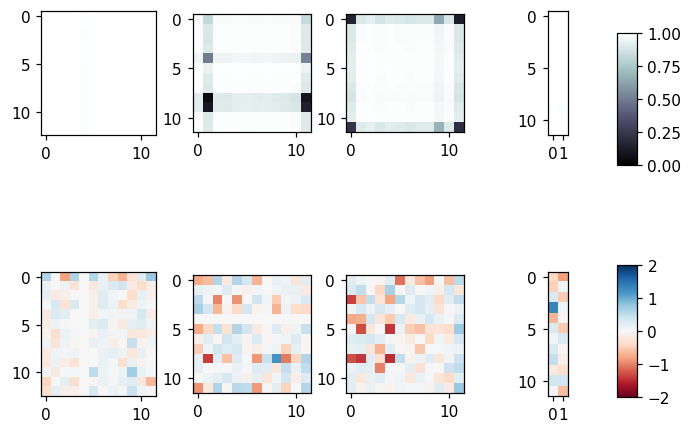

====> Epoch: 140 Average loss: -0.0051
====> Epoch: 141 Average loss: -0.0058
====> Epoch: 142 Average loss: 0.0012
====> Epoch: 143 Average loss: -0.0131
====> Epoch: 144 Average loss: -0.0105
Train Epoch:145, Batch_idx:62, Loss:-0.3996


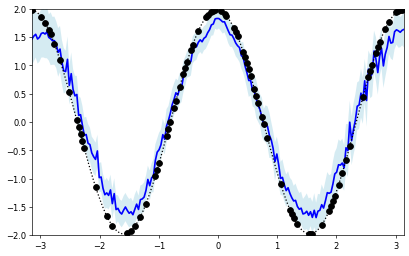

<Figure size 1100x550 with 0 Axes>

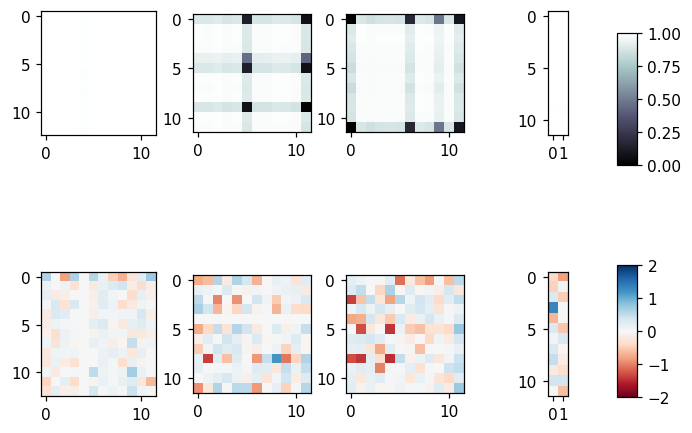

====> Epoch: 145 Average loss: -0.0032
====> Epoch: 146 Average loss: 0.0005
====> Epoch: 147 Average loss: 0.0081
====> Epoch: 148 Average loss: -0.0045
====> Epoch: 149 Average loss: -0.0016
Train Epoch:150, Batch_idx:62, Loss:0.3098


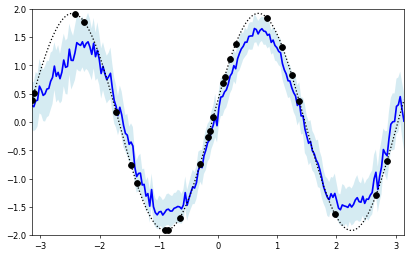

<Figure size 1100x550 with 0 Axes>

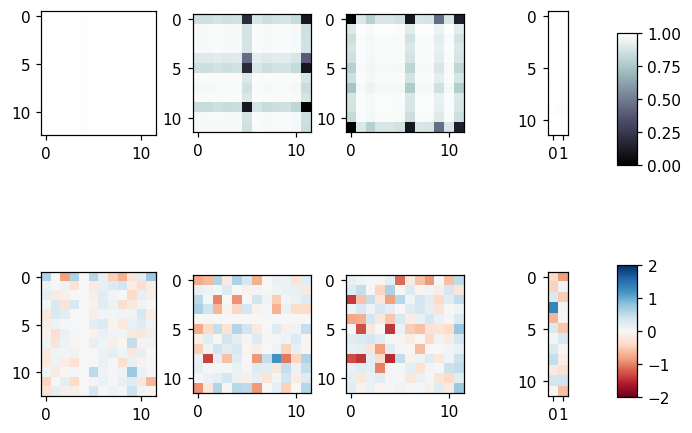

====> Epoch: 150 Average loss: 0.0034
====> Epoch: 151 Average loss: -0.0046
====> Epoch: 152 Average loss: -0.0073
====> Epoch: 153 Average loss: -0.0072
====> Epoch: 154 Average loss: 0.0109
Train Epoch:155, Batch_idx:62, Loss:-0.2673


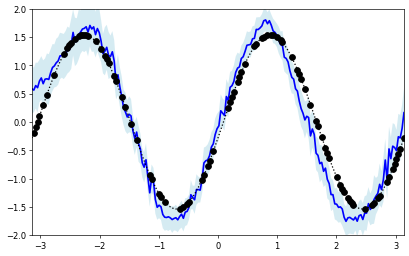

<Figure size 1100x550 with 0 Axes>

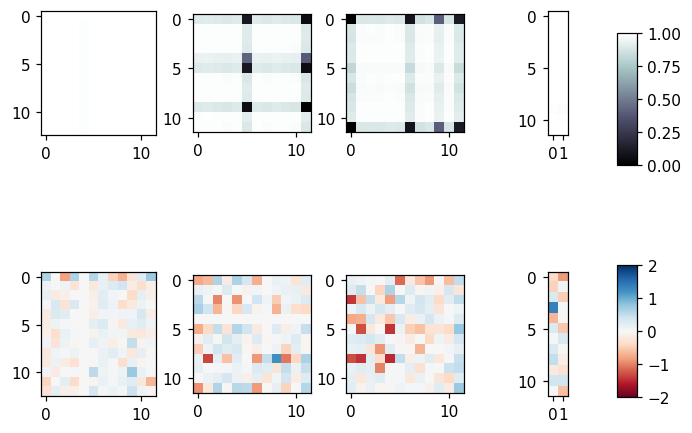

====> Epoch: 155 Average loss: -0.0033
====> Epoch: 156 Average loss: -0.0024
====> Epoch: 157 Average loss: -0.0095
====> Epoch: 158 Average loss: -0.0096
====> Epoch: 159 Average loss: -0.0104
Train Epoch:160, Batch_idx:62, Loss:-0.0703


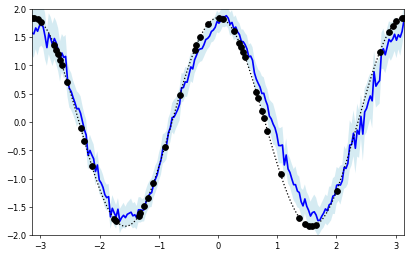

<Figure size 1100x550 with 0 Axes>

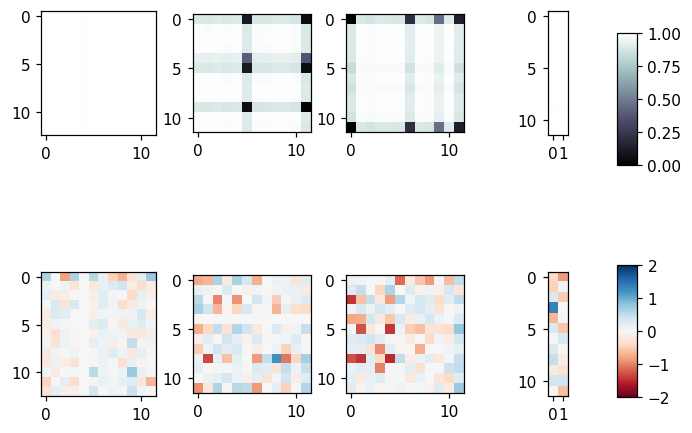

====> Epoch: 160 Average loss: -0.0083
====> Epoch: 161 Average loss: -0.0018
====> Epoch: 162 Average loss: -0.0046
====> Epoch: 163 Average loss: -0.0096
====> Epoch: 164 Average loss: -0.0027
Train Epoch:165, Batch_idx:62, Loss:0.0690


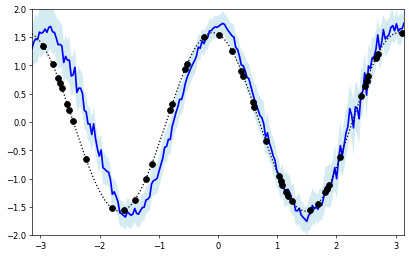

<Figure size 1100x550 with 0 Axes>

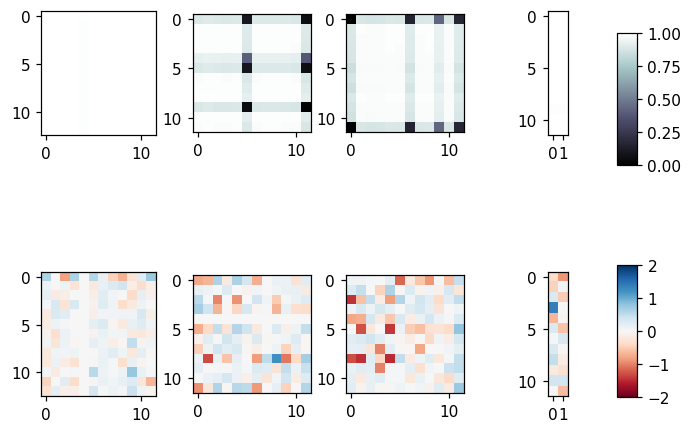

====> Epoch: 165 Average loss: -0.0089
====> Epoch: 166 Average loss: -0.0109
====> Epoch: 167 Average loss: -0.0046
====> Epoch: 168 Average loss: -0.0020
====> Epoch: 169 Average loss: -0.0122
Train Epoch:170, Batch_idx:62, Loss:0.5360


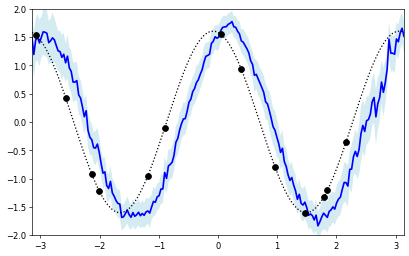

<Figure size 1100x550 with 0 Axes>

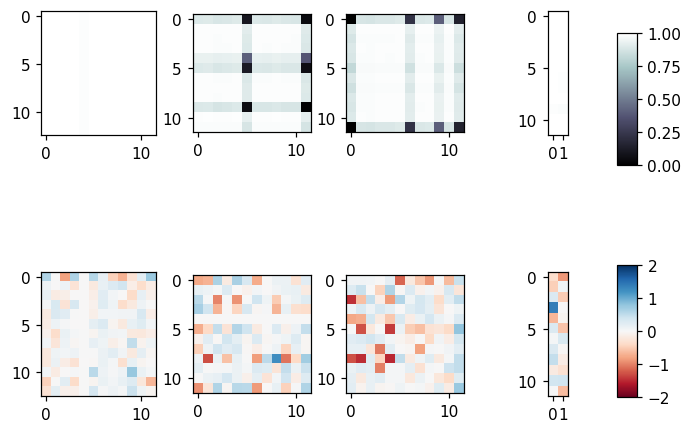

====> Epoch: 170 Average loss: -0.0053
====> Epoch: 171 Average loss: -0.0050
====> Epoch: 172 Average loss: -0.0048
====> Epoch: 173 Average loss: -0.0060
====> Epoch: 174 Average loss: -0.0064
Train Epoch:175, Batch_idx:62, Loss:-0.4139


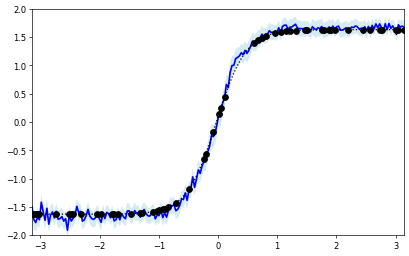

<Figure size 1100x550 with 0 Axes>

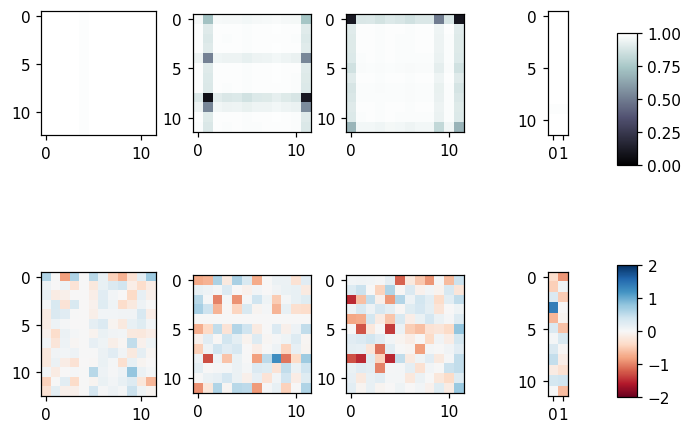

====> Epoch: 175 Average loss: -0.0039
====> Epoch: 176 Average loss: 0.0121
====> Epoch: 177 Average loss: -0.0042
====> Epoch: 178 Average loss: 0.0008
====> Epoch: 179 Average loss: -0.0115
Train Epoch:180, Batch_idx:62, Loss:-0.0470


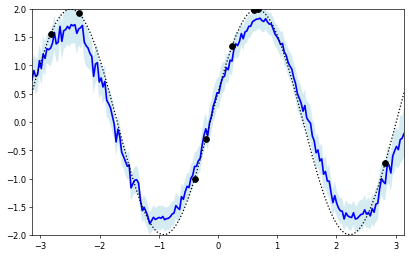

<Figure size 1100x550 with 0 Axes>

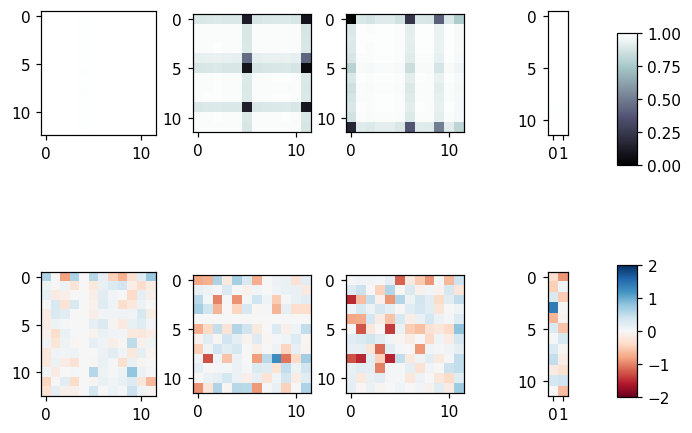

====> Epoch: 180 Average loss: -0.0095
====> Epoch: 181 Average loss: -0.0106
====> Epoch: 182 Average loss: -0.0086
====> Epoch: 183 Average loss: -0.0129
====> Epoch: 184 Average loss: -0.0042
Train Epoch:185, Batch_idx:62, Loss:-0.3281


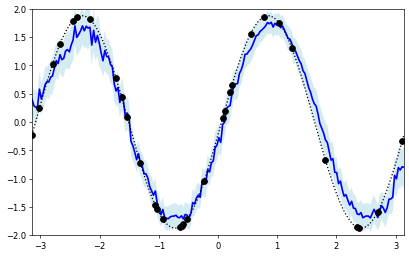

<Figure size 1100x550 with 0 Axes>

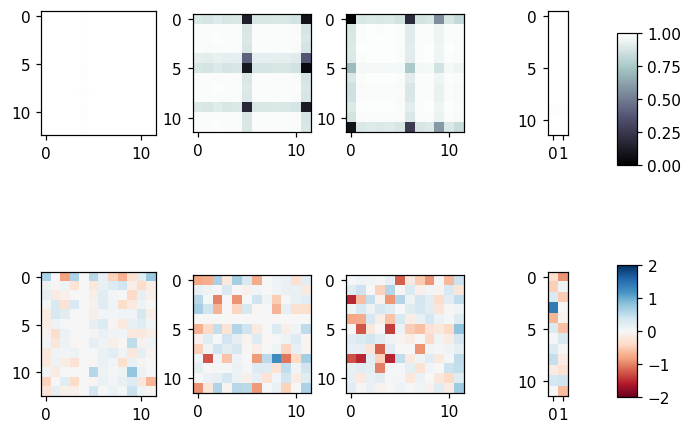

====> Epoch: 185 Average loss: -0.0086
====> Epoch: 186 Average loss: -0.0163
====> Epoch: 187 Average loss: -0.0118
====> Epoch: 188 Average loss: 0.0015
====> Epoch: 189 Average loss: -0.0153
Train Epoch:190, Batch_idx:62, Loss:-0.2828


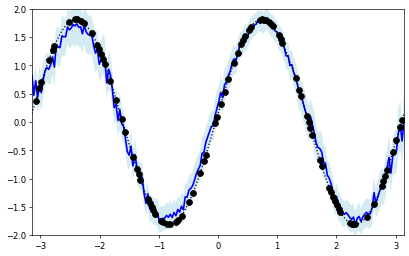

<Figure size 1100x550 with 0 Axes>

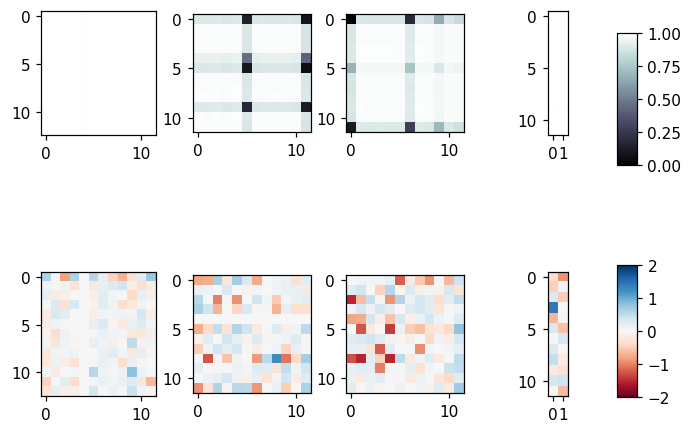

====> Epoch: 190 Average loss: -0.0073
====> Epoch: 191 Average loss: -0.0100
====> Epoch: 192 Average loss: -0.0047
====> Epoch: 193 Average loss: -0.0064
====> Epoch: 194 Average loss: -0.0076
Train Epoch:195, Batch_idx:62, Loss:-0.2256


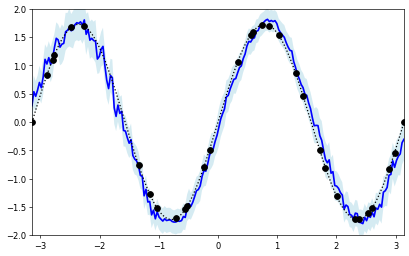

<Figure size 1100x550 with 0 Axes>

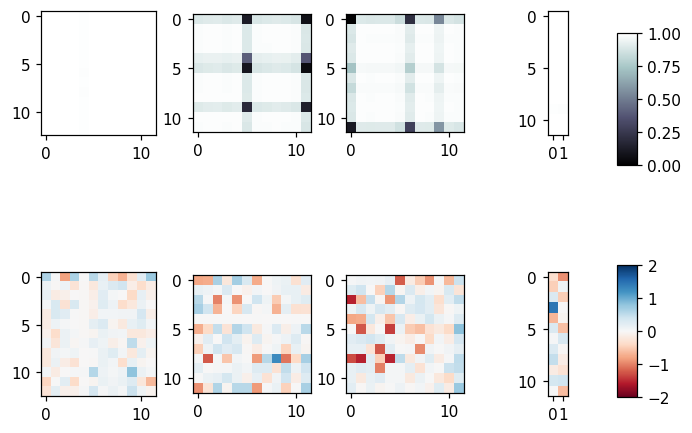

====> Epoch: 195 Average loss: -0.0099
====> Epoch: 196 Average loss: -0.0185
====> Epoch: 197 Average loss: -0.0129
====> Epoch: 198 Average loss: -0.0162
====> Epoch: 199 Average loss: -0.0112
Train Epoch:200, Batch_idx:62, Loss:-0.1885


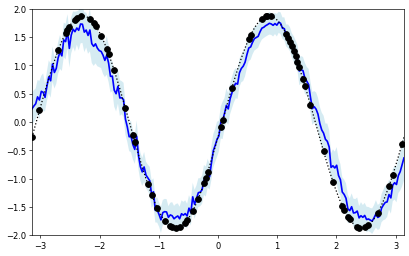

<Figure size 1100x550 with 0 Axes>

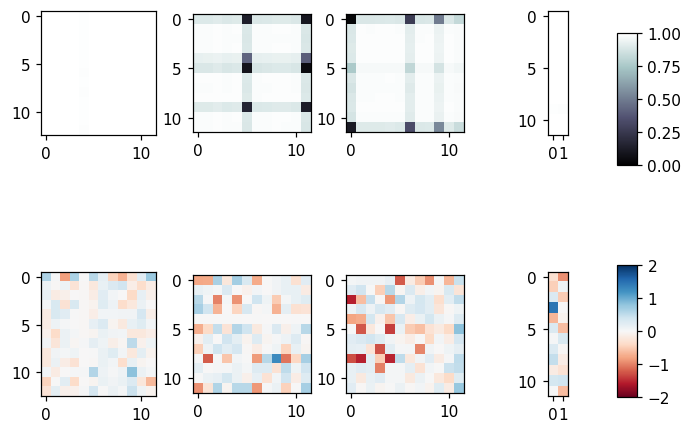

====> Epoch: 200 Average loss: -0.0107
====> Epoch: 201 Average loss: -0.0023
====> Epoch: 202 Average loss: -0.0160
====> Epoch: 203 Average loss: -0.0100
====> Epoch: 204 Average loss: -0.0111
Train Epoch:205, Batch_idx:62, Loss:-0.3094


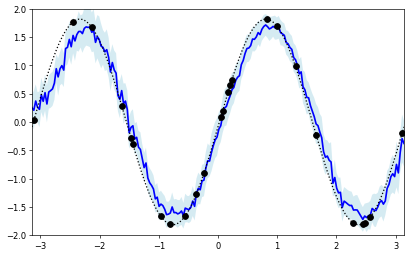

<Figure size 1100x550 with 0 Axes>

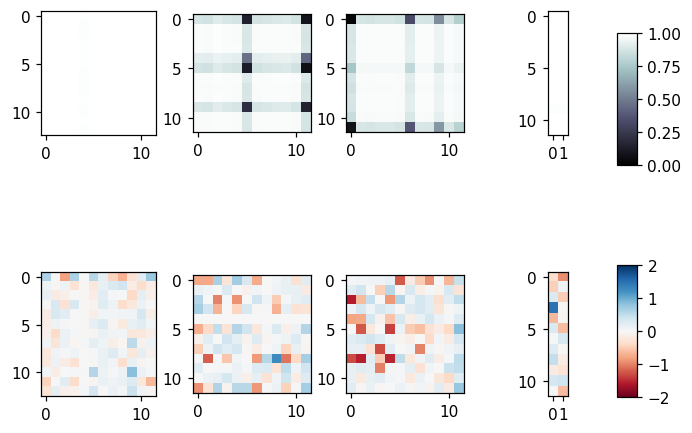

====> Epoch: 205 Average loss: -0.0107
====> Epoch: 206 Average loss: -0.0163
====> Epoch: 207 Average loss: -0.0079
====> Epoch: 208 Average loss: -0.0184
====> Epoch: 209 Average loss: 0.0023
Train Epoch:210, Batch_idx:62, Loss:-0.4175


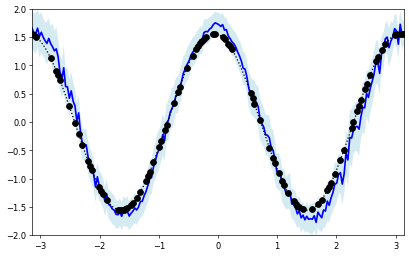

<Figure size 1100x550 with 0 Axes>

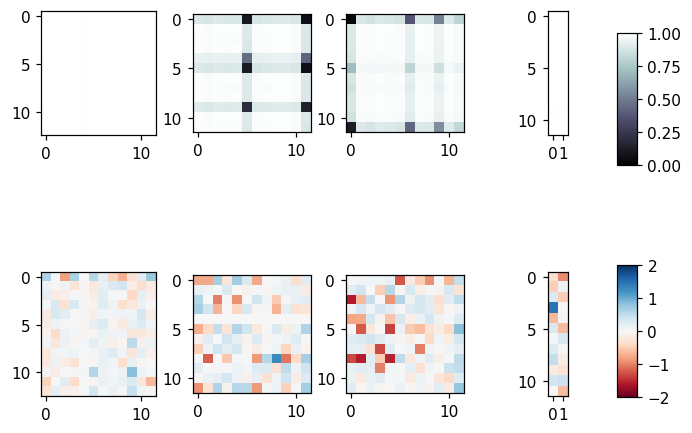

====> Epoch: 210 Average loss: -0.0106
====> Epoch: 211 Average loss: -0.0126
====> Epoch: 212 Average loss: -0.0182
====> Epoch: 213 Average loss: -0.0163
====> Epoch: 214 Average loss: 0.0095
Train Epoch:215, Batch_idx:62, Loss:-0.3797


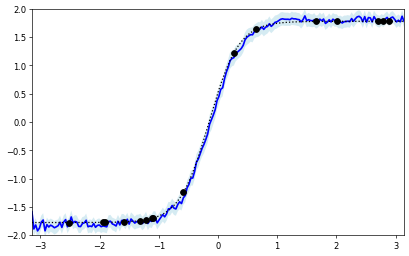

<Figure size 1100x550 with 0 Axes>

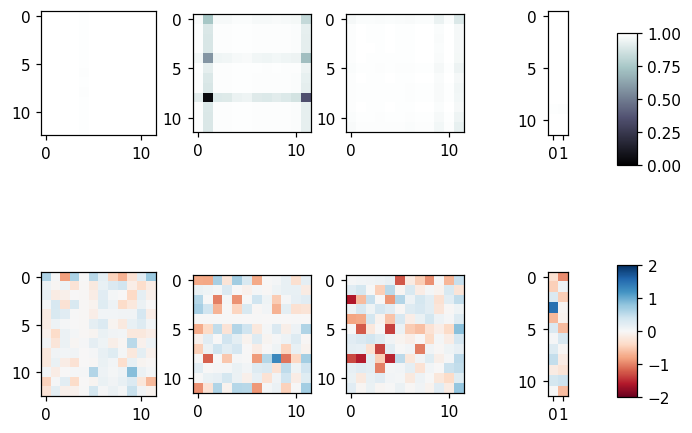

====> Epoch: 215 Average loss: -0.0108
====> Epoch: 216 Average loss: -0.0118
====> Epoch: 217 Average loss: -0.0106
====> Epoch: 218 Average loss: -0.0162
====> Epoch: 219 Average loss: 0.1093
Train Epoch:220, Batch_idx:62, Loss:0.1627


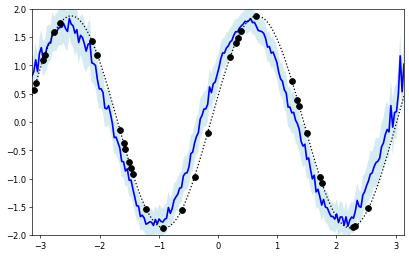

<Figure size 1100x550 with 0 Axes>

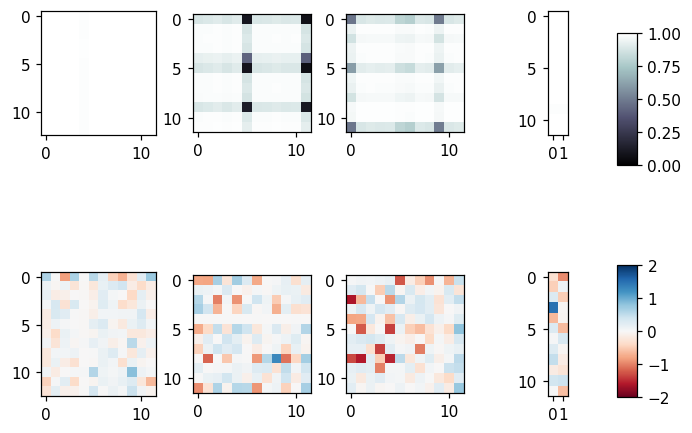

====> Epoch: 220 Average loss: -0.0029
====> Epoch: 221 Average loss: -0.0118
====> Epoch: 222 Average loss: -0.0125
====> Epoch: 223 Average loss: -0.0132
====> Epoch: 224 Average loss: -0.0154
Train Epoch:225, Batch_idx:62, Loss:0.4477


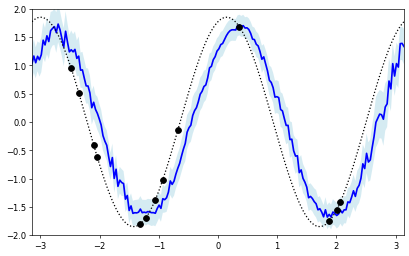

<Figure size 1100x550 with 0 Axes>

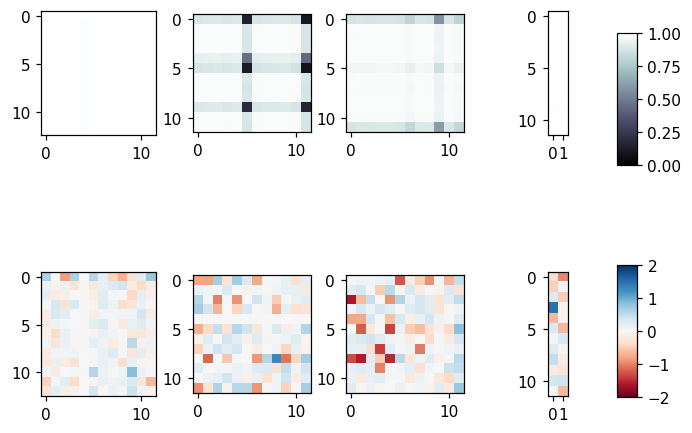

====> Epoch: 225 Average loss: -0.0132
====> Epoch: 226 Average loss: -0.0150
====> Epoch: 227 Average loss: -0.0101
====> Epoch: 228 Average loss: -0.0148
====> Epoch: 229 Average loss: -0.0169
Train Epoch:230, Batch_idx:62, Loss:-0.2267


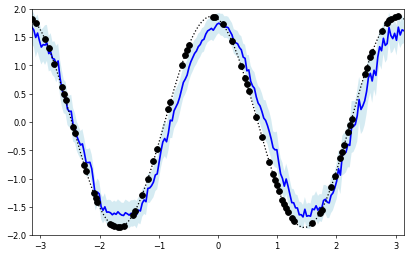

<Figure size 1100x550 with 0 Axes>

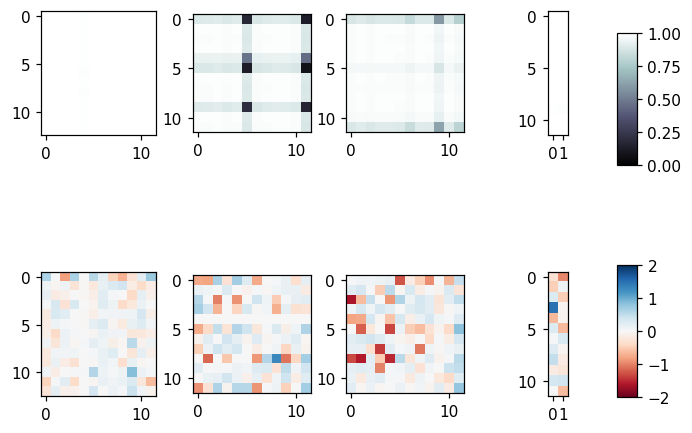

====> Epoch: 230 Average loss: -0.0112
====> Epoch: 231 Average loss: -0.0205
====> Epoch: 232 Average loss: -0.0021
====> Epoch: 233 Average loss: -0.0112
====> Epoch: 234 Average loss: -0.0047
Train Epoch:235, Batch_idx:62, Loss:-0.0889


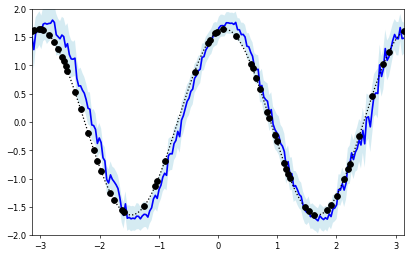

<Figure size 1100x550 with 0 Axes>

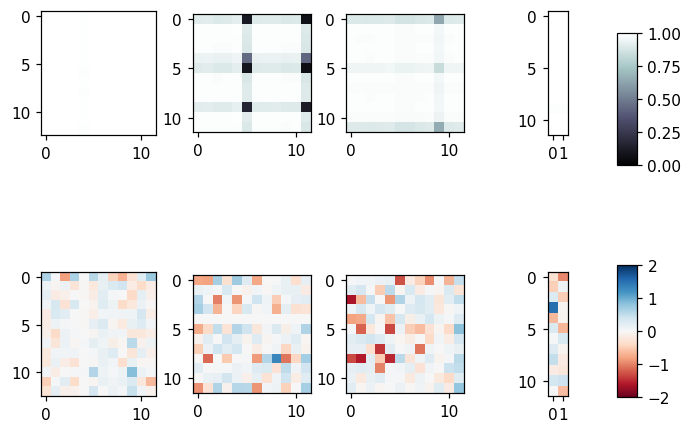

====> Epoch: 235 Average loss: -0.0153
====> Epoch: 236 Average loss: -0.0103
====> Epoch: 237 Average loss: -0.0182
====> Epoch: 238 Average loss: -0.0200
====> Epoch: 239 Average loss: -0.0092
Train Epoch:240, Batch_idx:62, Loss:-0.1998


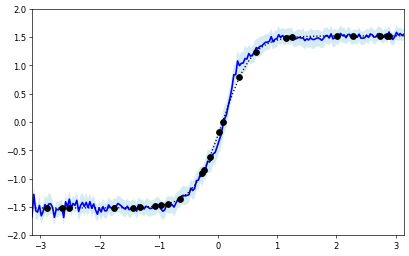

<Figure size 1100x550 with 0 Axes>

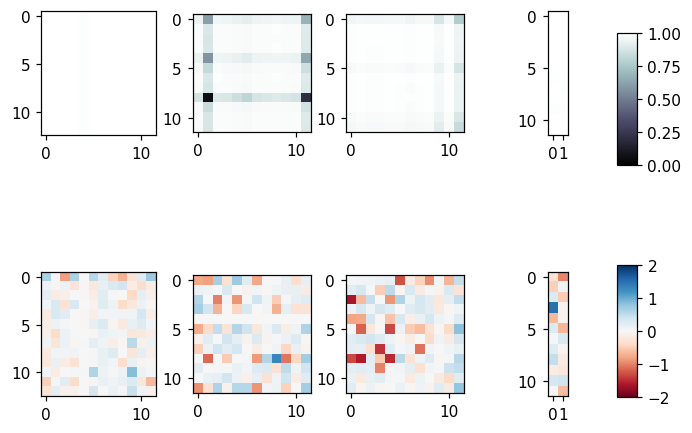

====> Epoch: 240 Average loss: -0.0206
====> Epoch: 241 Average loss: 0.0015
====> Epoch: 242 Average loss: -0.0080
====> Epoch: 243 Average loss: -0.0145
====> Epoch: 244 Average loss: -0.0169
Train Epoch:245, Batch_idx:62, Loss:-0.4671


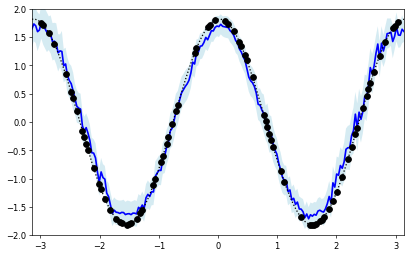

<Figure size 1100x550 with 0 Axes>

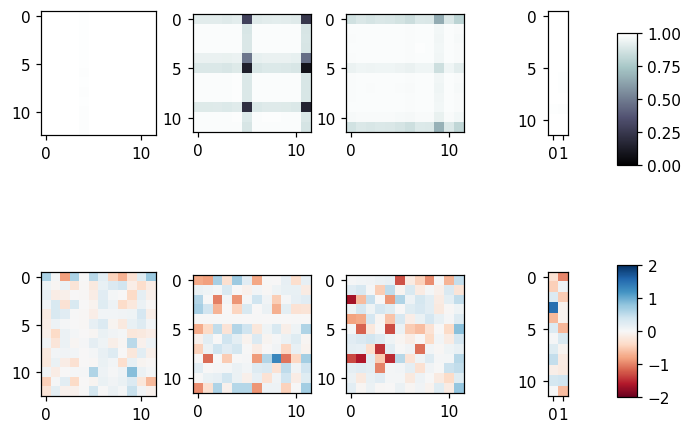

====> Epoch: 245 Average loss: -0.0154
====> Epoch: 246 Average loss: -0.0138
====> Epoch: 247 Average loss: -0.0183
====> Epoch: 248 Average loss: -0.0095
====> Epoch: 249 Average loss: -0.0185
Train Epoch:250, Batch_idx:62, Loss:-0.0531


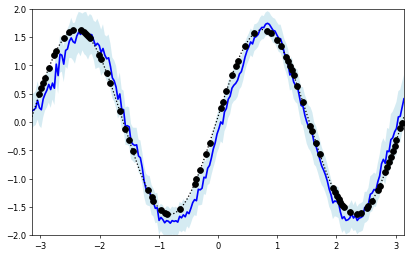

<Figure size 1100x550 with 0 Axes>

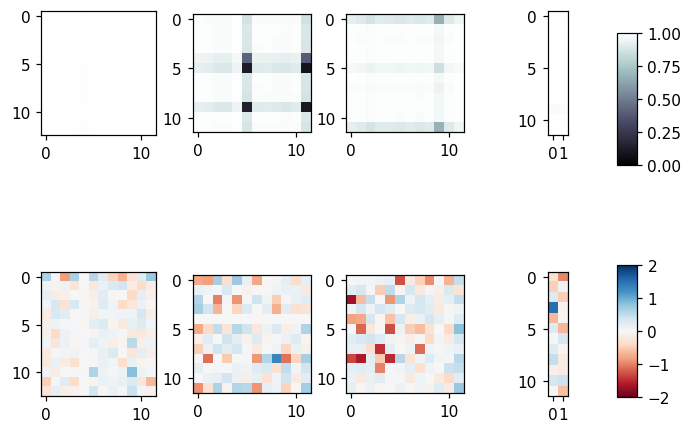

====> Epoch: 250 Average loss: 0.0421
====> Epoch: 251 Average loss: -0.0122
====> Epoch: 252 Average loss: -0.0141
====> Epoch: 253 Average loss: -0.0153
====> Epoch: 254 Average loss: -0.0112
Train Epoch:255, Batch_idx:62, Loss:0.4290


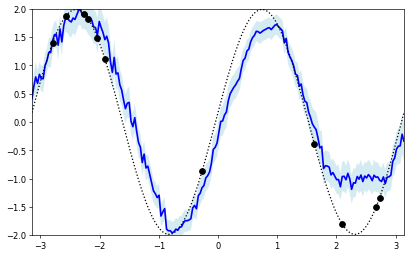

<Figure size 1100x550 with 0 Axes>

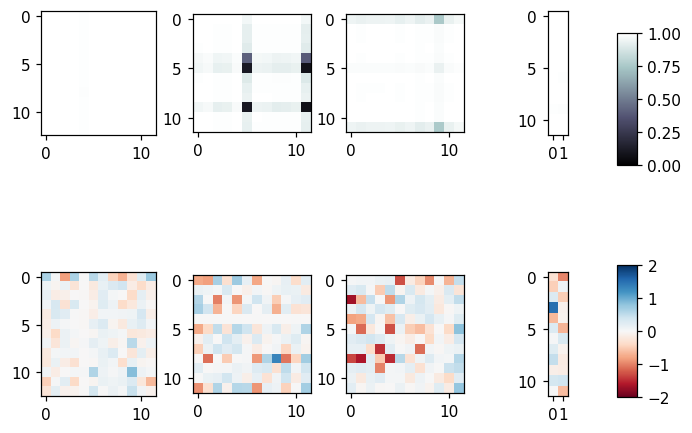

====> Epoch: 255 Average loss: -0.0130
====> Epoch: 256 Average loss: -0.0152
====> Epoch: 257 Average loss: -0.0104
====> Epoch: 258 Average loss: -0.0184
====> Epoch: 259 Average loss: -0.0167
Train Epoch:260, Batch_idx:62, Loss:-0.6685


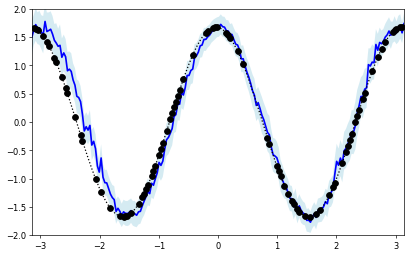

<Figure size 1100x550 with 0 Axes>

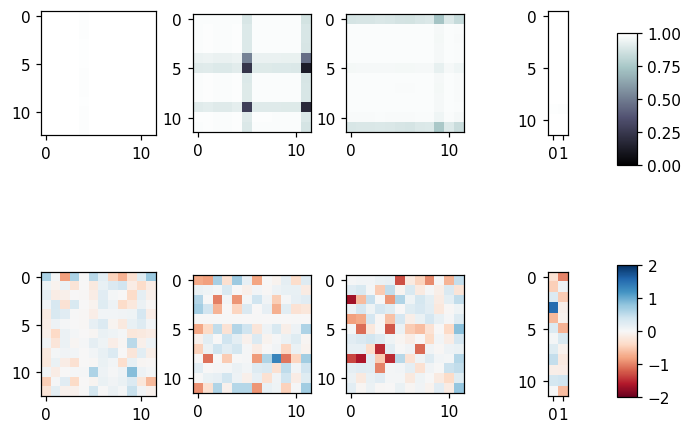

====> Epoch: 260 Average loss: -0.0195
====> Epoch: 261 Average loss: -0.0130
====> Epoch: 262 Average loss: -0.0229
====> Epoch: 263 Average loss: -0.0132
====> Epoch: 264 Average loss: -0.0131
Train Epoch:265, Batch_idx:62, Loss:-0.6074


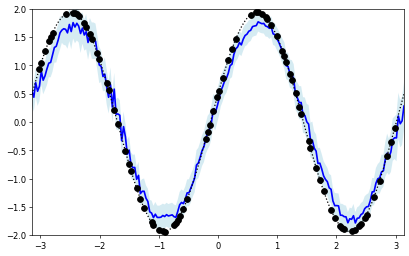

<Figure size 1100x550 with 0 Axes>

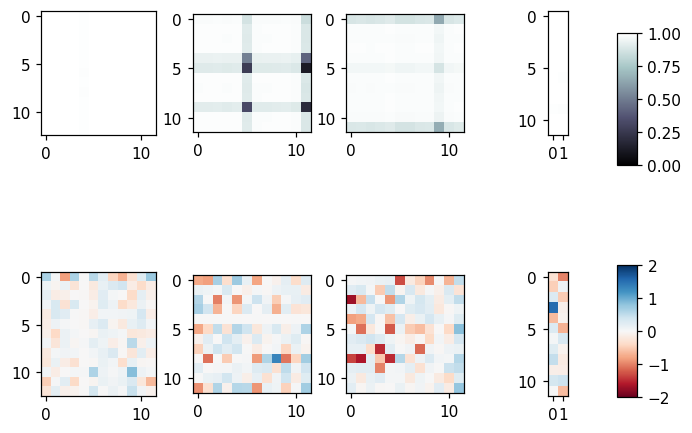

====> Epoch: 265 Average loss: -0.0167
====> Epoch: 266 Average loss: -0.0175
====> Epoch: 267 Average loss: -0.0227
====> Epoch: 268 Average loss: -0.0159
====> Epoch: 269 Average loss: -0.0189
Train Epoch:270, Batch_idx:62, Loss:0.0420


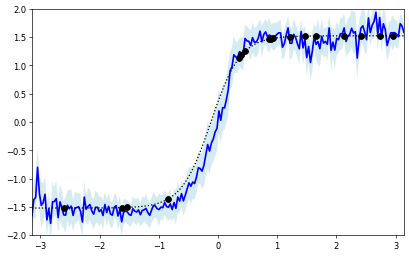

<Figure size 1100x550 with 0 Axes>

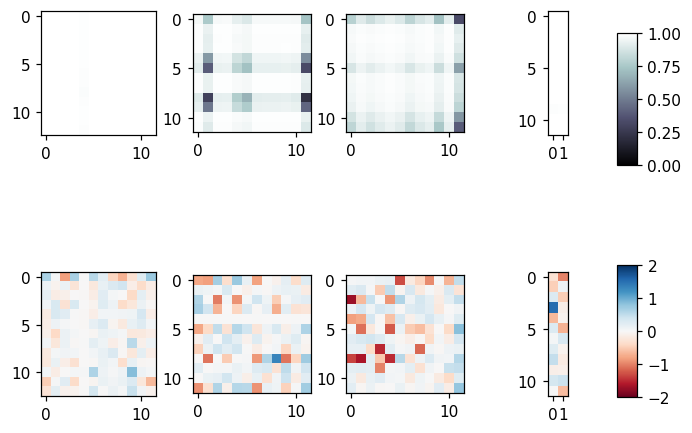

====> Epoch: 270 Average loss: 0.0041
====> Epoch: 271 Average loss: -0.0111
====> Epoch: 272 Average loss: -0.0171
====> Epoch: 273 Average loss: -0.0152
====> Epoch: 274 Average loss: -0.0149
Train Epoch:275, Batch_idx:62, Loss:-0.3286


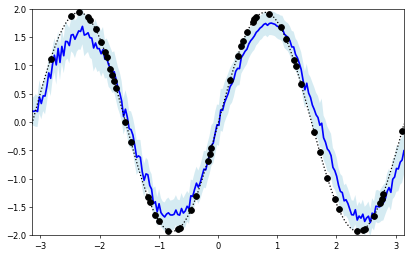

<Figure size 1100x550 with 0 Axes>

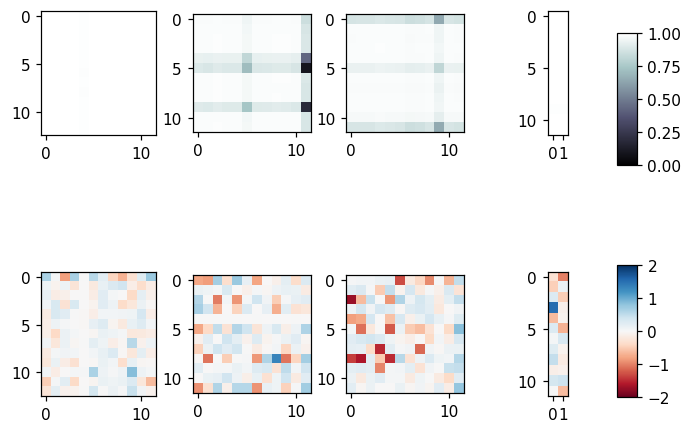

====> Epoch: 275 Average loss: 0.0052
====> Epoch: 276 Average loss: -0.0169
====> Epoch: 277 Average loss: -0.0127
====> Epoch: 278 Average loss: -0.0215
====> Epoch: 279 Average loss: -0.0236
Train Epoch:280, Batch_idx:62, Loss:-0.3853


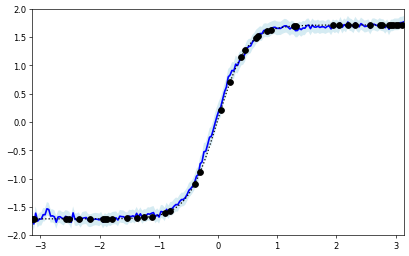

<Figure size 1100x550 with 0 Axes>

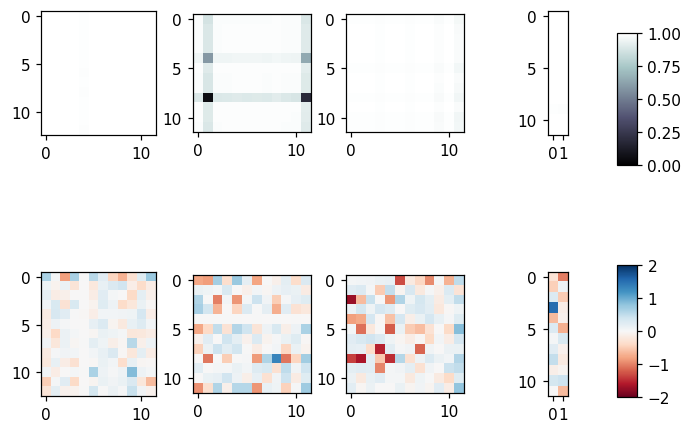

====> Epoch: 280 Average loss: -0.0177
====> Epoch: 281 Average loss: -0.0169
====> Epoch: 282 Average loss: -0.0228
====> Epoch: 283 Average loss: -0.0202
====> Epoch: 284 Average loss: -0.0162
Train Epoch:285, Batch_idx:62, Loss:-0.5523


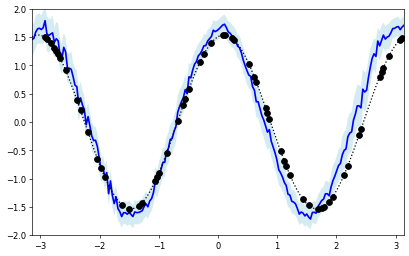

<Figure size 1100x550 with 0 Axes>

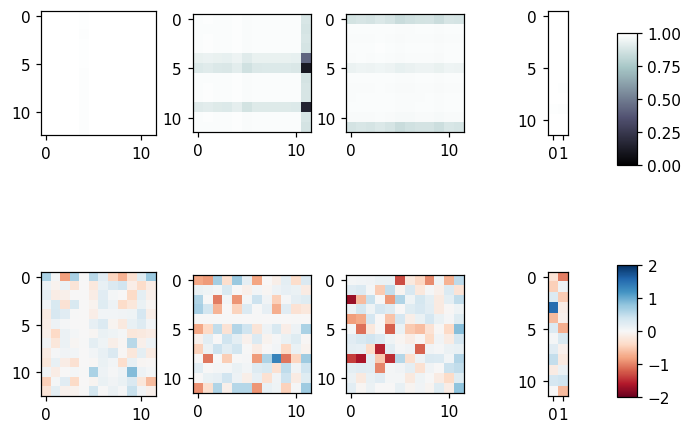

====> Epoch: 285 Average loss: -0.0229
====> Epoch: 286 Average loss: -0.0117
====> Epoch: 287 Average loss: -0.0210
====> Epoch: 288 Average loss: -0.0110
====> Epoch: 289 Average loss: -0.0186
Train Epoch:290, Batch_idx:62, Loss:-0.3145


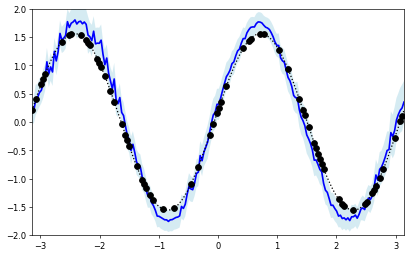

<Figure size 1100x550 with 0 Axes>

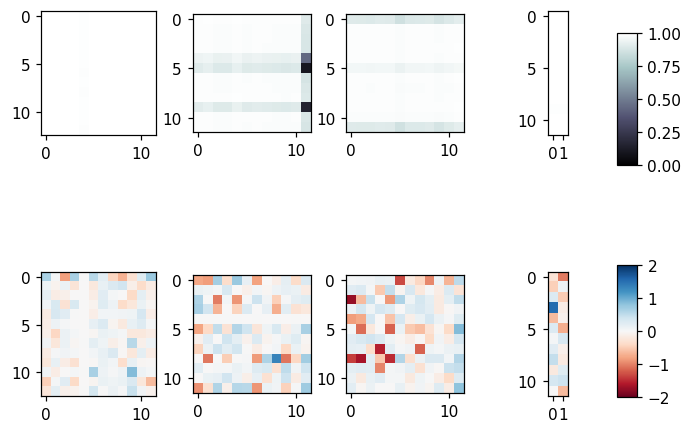

====> Epoch: 290 Average loss: -0.0192
====> Epoch: 291 Average loss: -0.0239
====> Epoch: 292 Average loss: -0.0213
====> Epoch: 293 Average loss: -0.0072
====> Epoch: 294 Average loss: -0.0217
Train Epoch:295, Batch_idx:62, Loss:0.1683


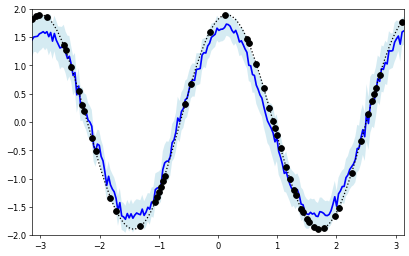

<Figure size 1100x550 with 0 Axes>

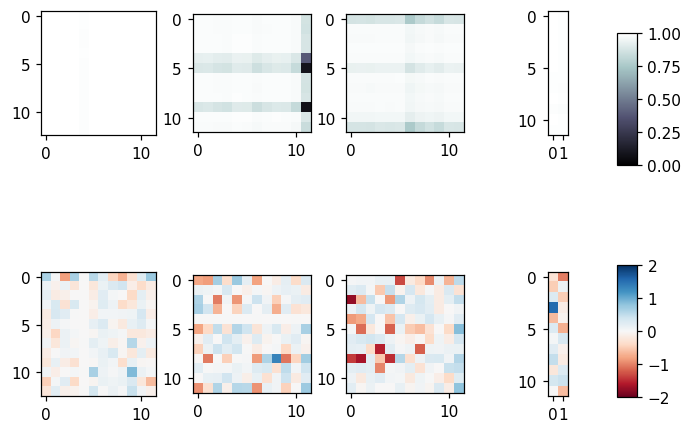

====> Epoch: 295 Average loss: 0.0040
====> Epoch: 296 Average loss: -0.0161
====> Epoch: 297 Average loss: -0.0164
====> Epoch: 298 Average loss: -0.0106
====> Epoch: 299 Average loss: -0.0231
Train Epoch:300, Batch_idx:62, Loss:0.1985


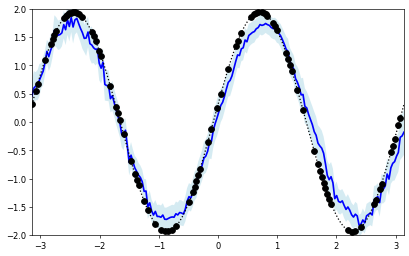

<Figure size 1100x550 with 0 Axes>

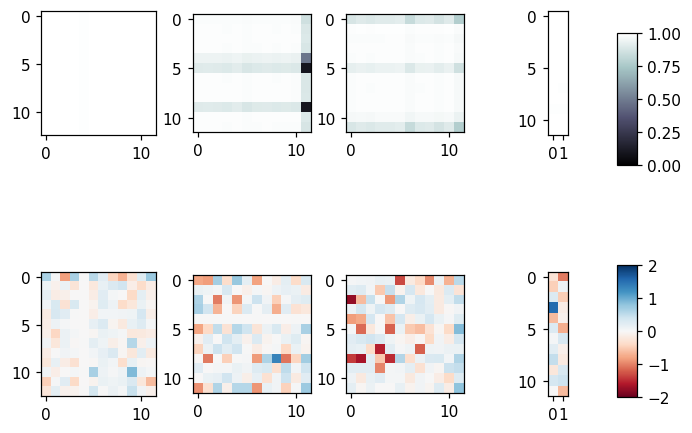

====> Epoch: 300 Average loss: -0.0138
====> Epoch: 301 Average loss: -0.0193
====> Epoch: 302 Average loss: -0.0183
====> Epoch: 303 Average loss: -0.0167
====> Epoch: 304 Average loss: -0.0159
Train Epoch:305, Batch_idx:62, Loss:-0.5036


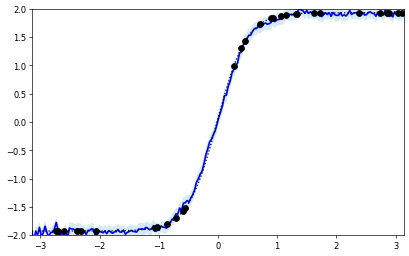

<Figure size 1100x550 with 0 Axes>

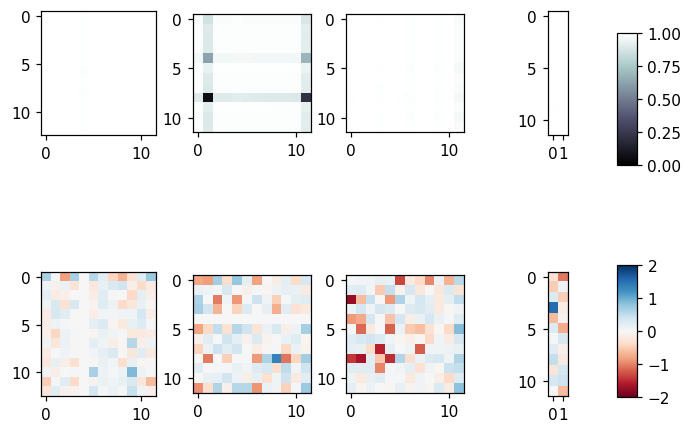

====> Epoch: 305 Average loss: -0.0169
====> Epoch: 306 Average loss: -0.0192
====> Epoch: 307 Average loss: -0.0108
====> Epoch: 308 Average loss: -0.0166
====> Epoch: 309 Average loss: -0.0240
Train Epoch:310, Batch_idx:62, Loss:0.1582


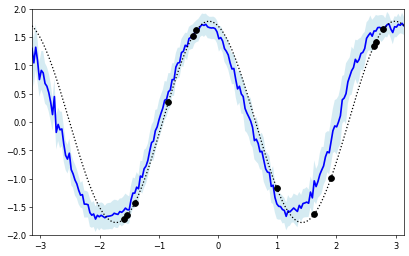

<Figure size 1100x550 with 0 Axes>

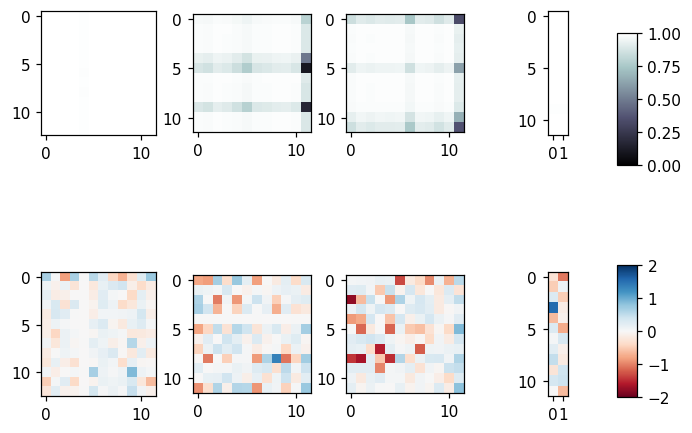

====> Epoch: 310 Average loss: -0.0116
====> Epoch: 311 Average loss: -0.0199
====> Epoch: 312 Average loss: -0.0096
====> Epoch: 313 Average loss: -0.0253
====> Epoch: 314 Average loss: -0.0122
Train Epoch:315, Batch_idx:62, Loss:0.0840


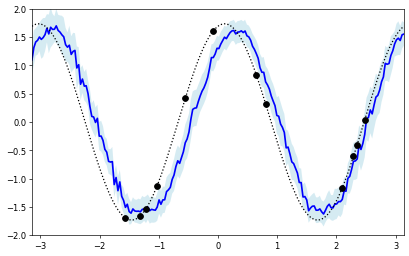

<Figure size 1100x550 with 0 Axes>

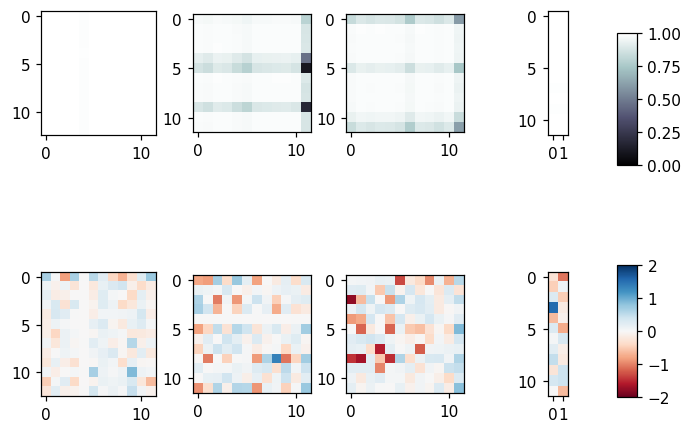

====> Epoch: 315 Average loss: -0.0215
====> Epoch: 316 Average loss: -0.0146
====> Epoch: 317 Average loss: -0.0226
====> Epoch: 318 Average loss: -0.0229
====> Epoch: 319 Average loss: -0.0243
Train Epoch:320, Batch_idx:62, Loss:-0.0055


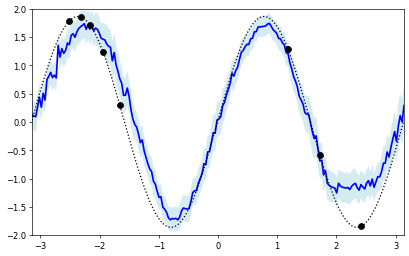

<Figure size 1100x550 with 0 Axes>

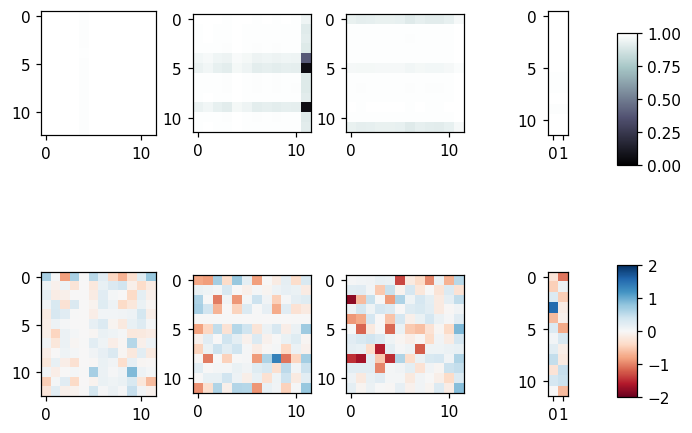

====> Epoch: 320 Average loss: -0.0123
====> Epoch: 321 Average loss: -0.0215
====> Epoch: 322 Average loss: 0.0499
====> Epoch: 323 Average loss: -0.0172
====> Epoch: 324 Average loss: -0.0221
Train Epoch:325, Batch_idx:62, Loss:-0.3536


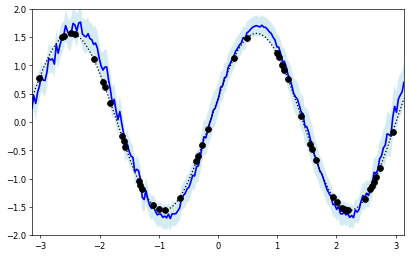

<Figure size 1100x550 with 0 Axes>

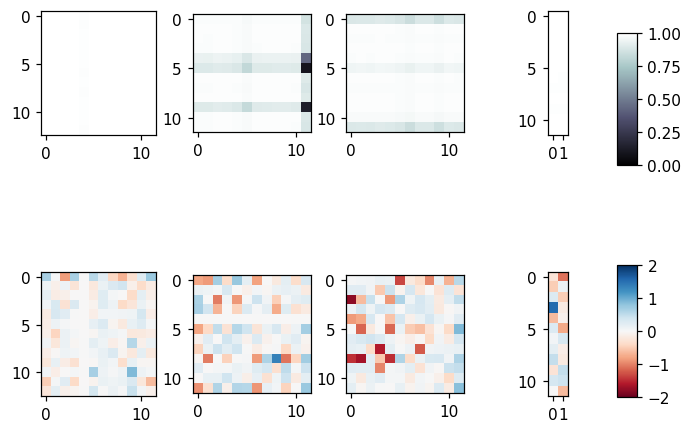

====> Epoch: 325 Average loss: -0.0167
====> Epoch: 326 Average loss: -0.0234
====> Epoch: 327 Average loss: -0.0257
====> Epoch: 328 Average loss: -0.0136
====> Epoch: 329 Average loss: -0.0184
Train Epoch:330, Batch_idx:62, Loss:-0.7024


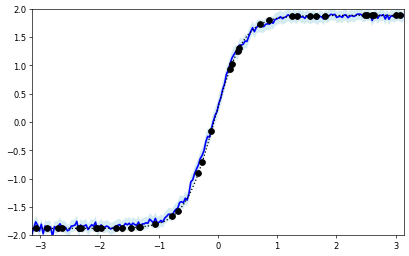

<Figure size 1100x550 with 0 Axes>

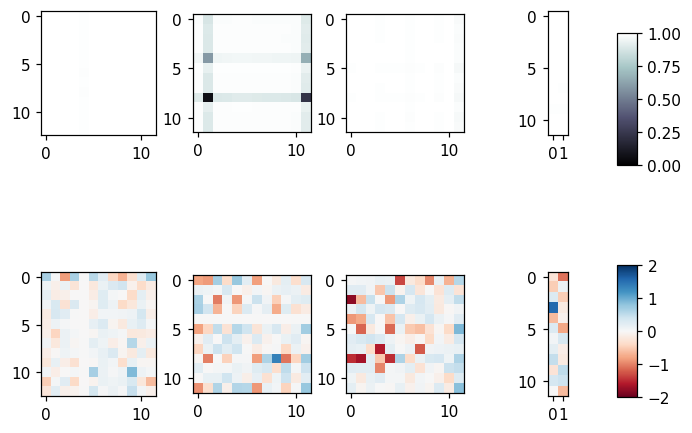

====> Epoch: 330 Average loss: -0.0191
====> Epoch: 331 Average loss: -0.0043
====> Epoch: 332 Average loss: -0.0158
====> Epoch: 333 Average loss: -0.0162
====> Epoch: 334 Average loss: -0.0199
Train Epoch:335, Batch_idx:62, Loss:-0.8622


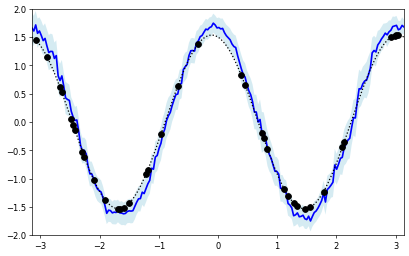

<Figure size 1100x550 with 0 Axes>

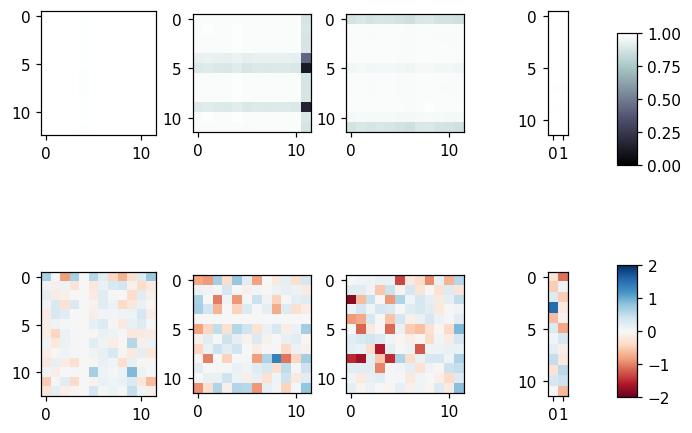

====> Epoch: 335 Average loss: -0.0244
====> Epoch: 336 Average loss: -0.0234
====> Epoch: 337 Average loss: -0.0055
====> Epoch: 338 Average loss: -0.0182
====> Epoch: 339 Average loss: 0.0836
Train Epoch:340, Batch_idx:62, Loss:-0.2108


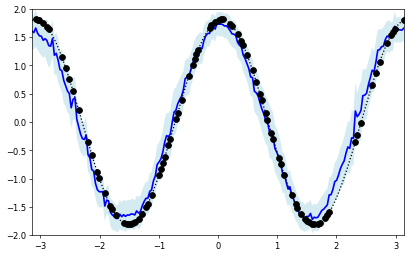

<Figure size 1100x550 with 0 Axes>

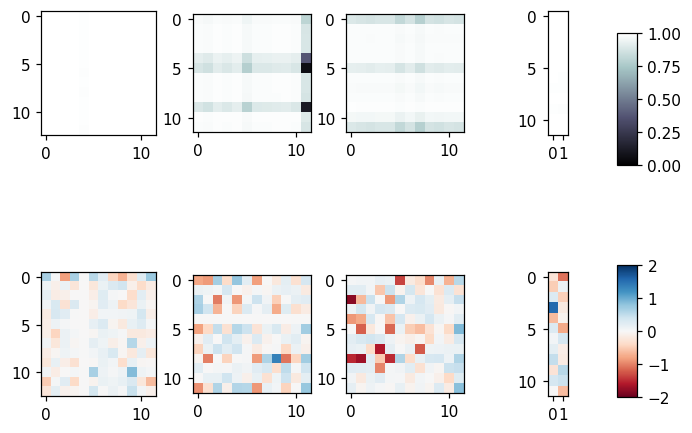

====> Epoch: 340 Average loss: 0.0007
====> Epoch: 341 Average loss: -0.0092
====> Epoch: 342 Average loss: -0.0217
====> Epoch: 343 Average loss: -0.0125
====> Epoch: 344 Average loss: -0.0174
Train Epoch:345, Batch_idx:62, Loss:-0.4223


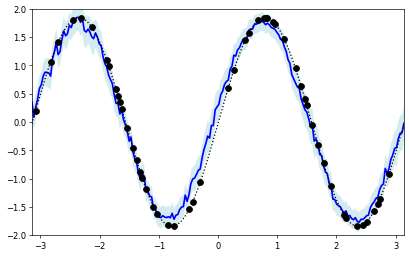

<Figure size 1100x550 with 0 Axes>

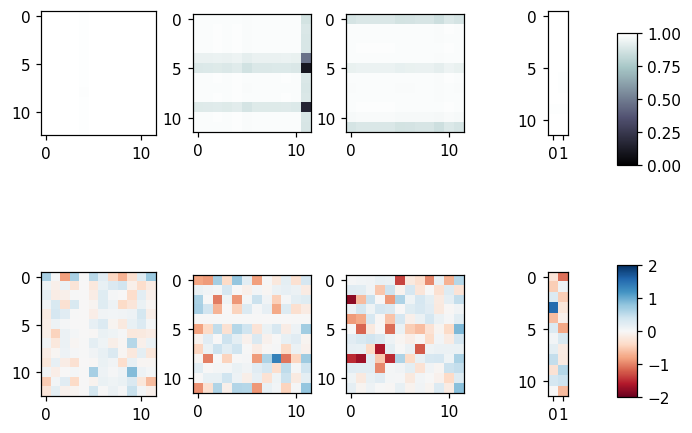

====> Epoch: 345 Average loss: -0.0247
====> Epoch: 346 Average loss: -0.0290
====> Epoch: 347 Average loss: -0.0045
====> Epoch: 348 Average loss: -0.0073
====> Epoch: 349 Average loss: -0.0141
Train Epoch:350, Batch_idx:62, Loss:-0.4069


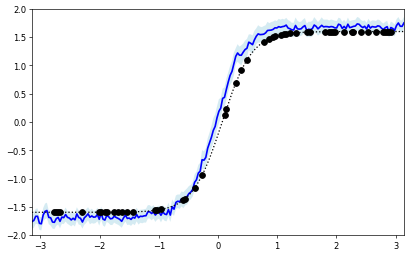

<Figure size 1100x550 with 0 Axes>

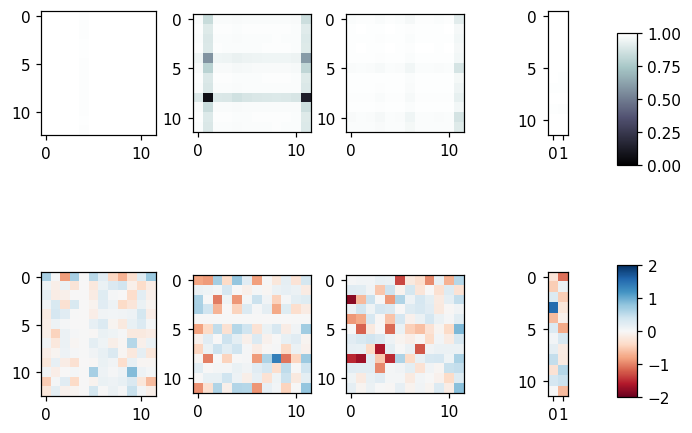

====> Epoch: 350 Average loss: -0.0141
====> Epoch: 351 Average loss: -0.0222
====> Epoch: 352 Average loss: -0.0107
====> Epoch: 353 Average loss: -0.0214
====> Epoch: 354 Average loss: -0.0167
Train Epoch:355, Batch_idx:62, Loss:-0.0421


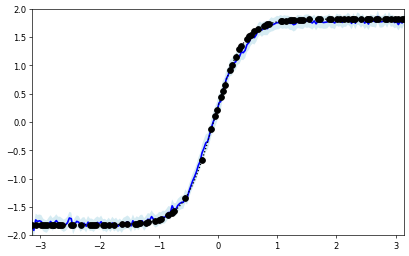

<Figure size 1100x550 with 0 Axes>

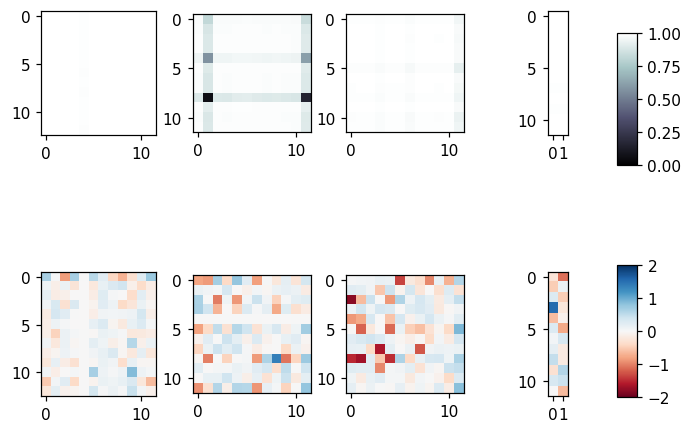

====> Epoch: 355 Average loss: -0.0199
====> Epoch: 356 Average loss: -0.0214
====> Epoch: 357 Average loss: -0.0086
====> Epoch: 358 Average loss: -0.0198
====> Epoch: 359 Average loss: -0.0162
Train Epoch:360, Batch_idx:62, Loss:-0.5695


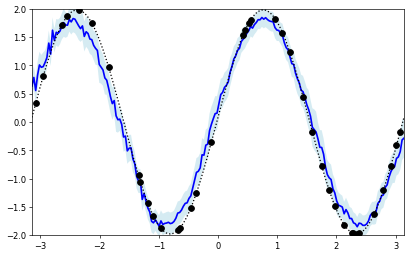

<Figure size 1100x550 with 0 Axes>

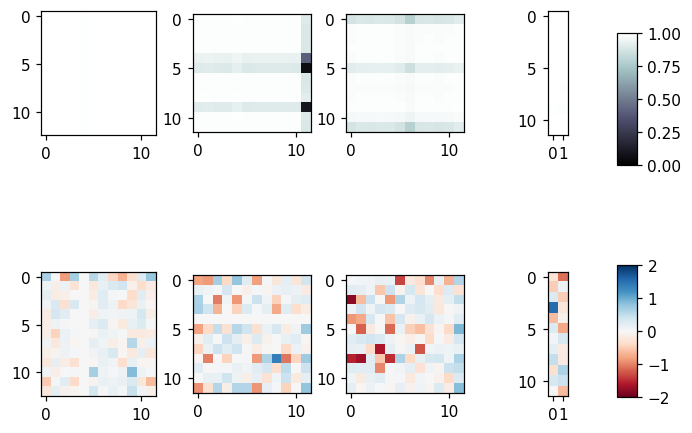

====> Epoch: 360 Average loss: -0.0178
====> Epoch: 361 Average loss: 0.0534
====> Epoch: 362 Average loss: 0.0020
====> Epoch: 363 Average loss: -0.0059
====> Epoch: 364 Average loss: -0.0150
Train Epoch:365, Batch_idx:62, Loss:0.3686


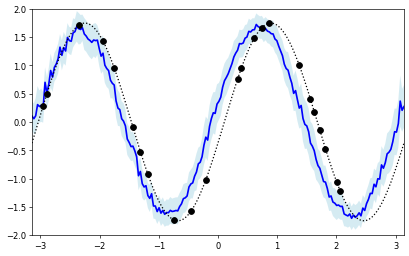

<Figure size 1100x550 with 0 Axes>

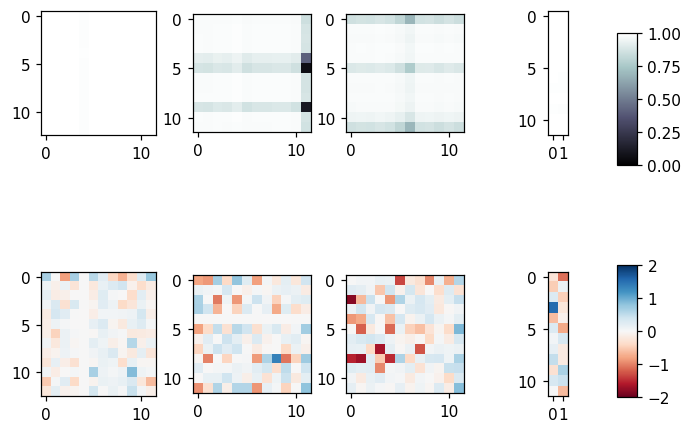

====> Epoch: 365 Average loss: -0.0120
====> Epoch: 366 Average loss: -0.0177
====> Epoch: 367 Average loss: -0.0159
====> Epoch: 368 Average loss: -0.0195
====> Epoch: 369 Average loss: -0.0178
Train Epoch:370, Batch_idx:62, Loss:-0.7168


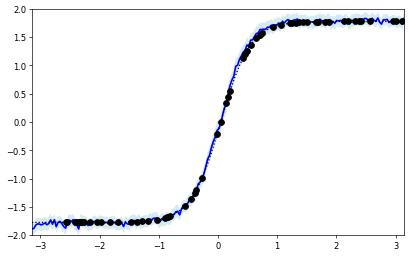

<Figure size 1100x550 with 0 Axes>

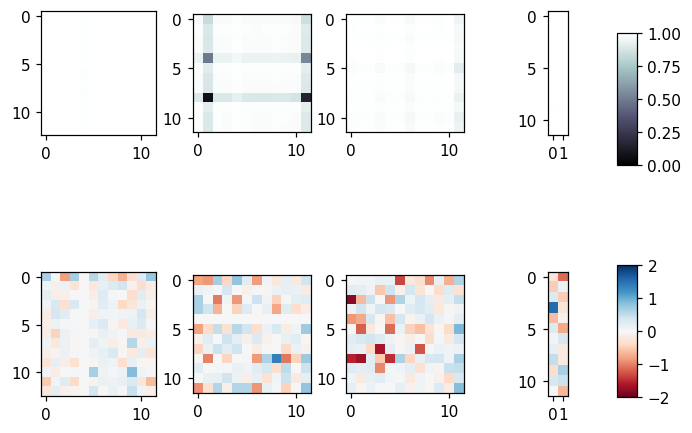

====> Epoch: 370 Average loss: -0.0249
====> Epoch: 371 Average loss: 0.0058
====> Epoch: 372 Average loss: 0.0010
====> Epoch: 373 Average loss: -0.0171
====> Epoch: 374 Average loss: -0.0237
Train Epoch:375, Batch_idx:62, Loss:-0.5614


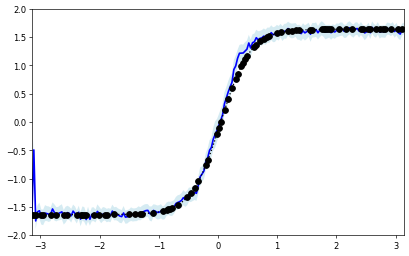

<Figure size 1100x550 with 0 Axes>

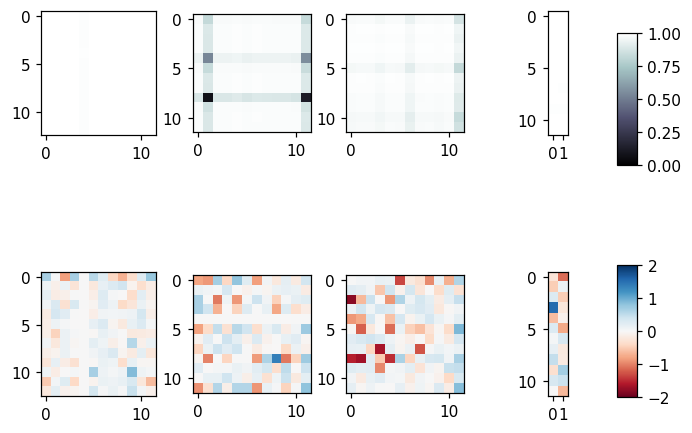

====> Epoch: 375 Average loss: -0.0187
====> Epoch: 376 Average loss: -0.0123
====> Epoch: 377 Average loss: -0.0198
====> Epoch: 378 Average loss: -0.0225
====> Epoch: 379 Average loss: -0.0150
Train Epoch:380, Batch_idx:62, Loss:-0.4735


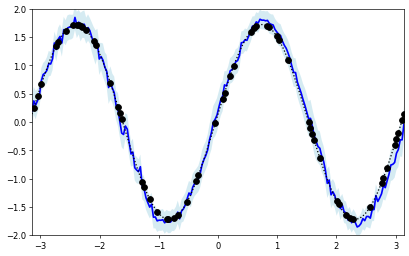

<Figure size 1100x550 with 0 Axes>

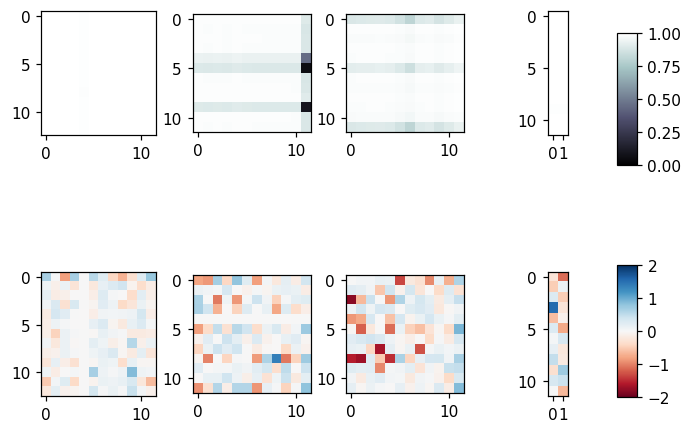

====> Epoch: 380 Average loss: -0.0203
====> Epoch: 381 Average loss: -0.0210
====> Epoch: 382 Average loss: -0.0258
====> Epoch: 383 Average loss: -0.0140
====> Epoch: 384 Average loss: -0.0178
Train Epoch:385, Batch_idx:62, Loss:-0.6356


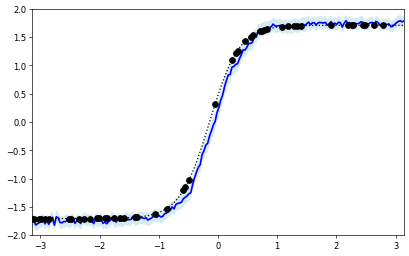

<Figure size 1100x550 with 0 Axes>

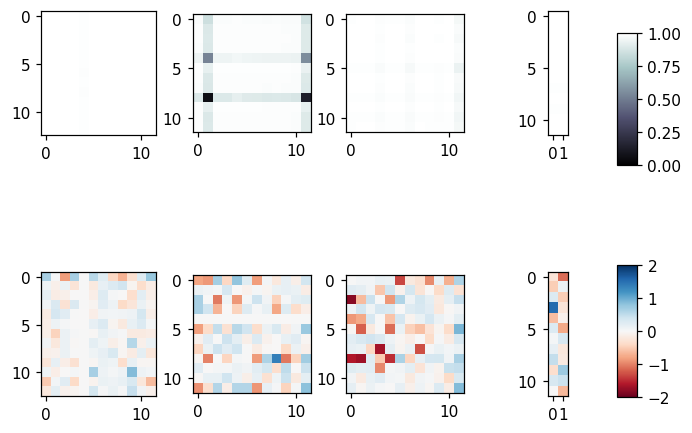

====> Epoch: 385 Average loss: -0.0191
====> Epoch: 386 Average loss: -0.0223
====> Epoch: 387 Average loss: -0.0244
====> Epoch: 388 Average loss: -0.0240
====> Epoch: 389 Average loss: -0.0227
Train Epoch:390, Batch_idx:62, Loss:-0.4113


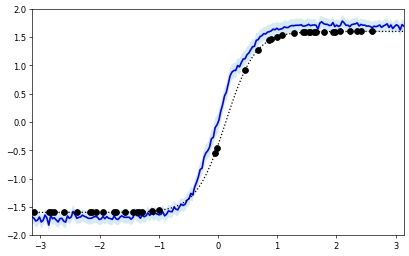

<Figure size 1100x550 with 0 Axes>

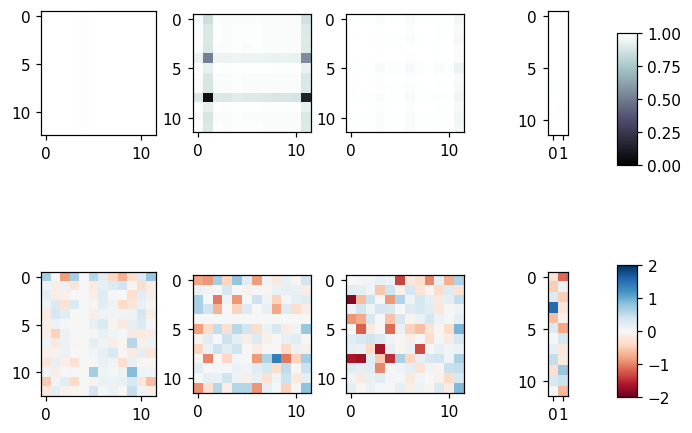

====> Epoch: 390 Average loss: -0.0164
====> Epoch: 391 Average loss: -0.0224
====> Epoch: 392 Average loss: -0.0141
====> Epoch: 393 Average loss: -0.0248
====> Epoch: 394 Average loss: -0.0217
Train Epoch:395, Batch_idx:62, Loss:-0.4319


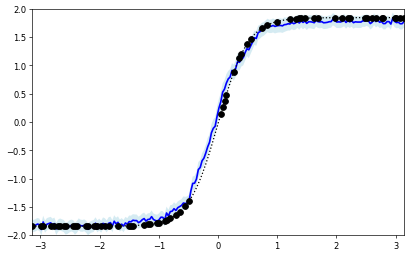

<Figure size 1100x550 with 0 Axes>

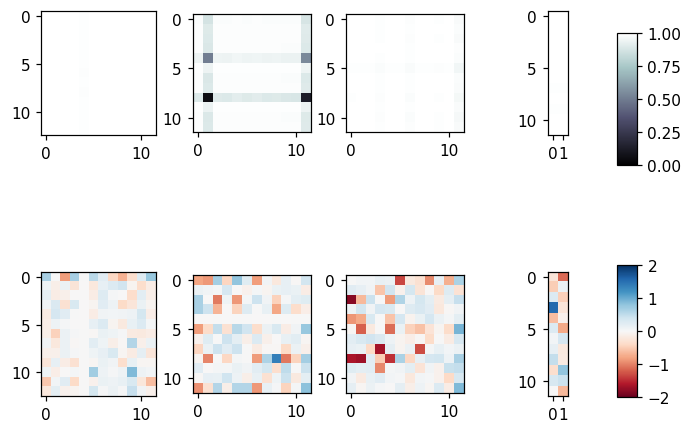

====> Epoch: 395 Average loss: -0.0087
====> Epoch: 396 Average loss: -0.0195
====> Epoch: 397 Average loss: -0.0275
====> Epoch: 398 Average loss: -0.0216
====> Epoch: 399 Average loss: -0.0117
Train Epoch:400, Batch_idx:62, Loss:-0.3658


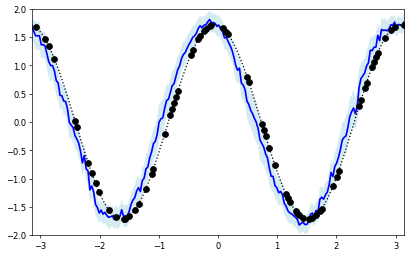

<Figure size 1100x550 with 0 Axes>

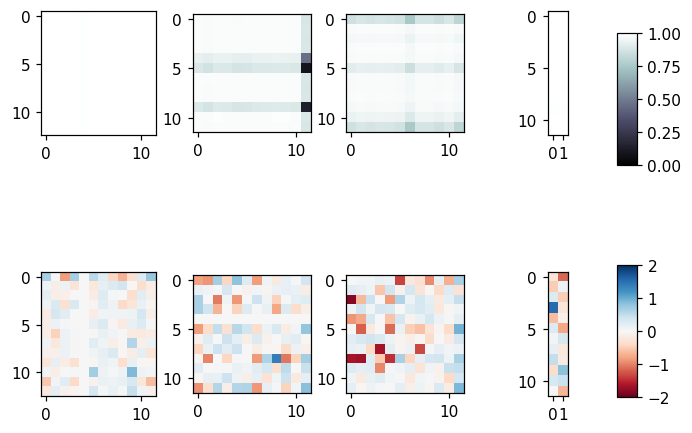

====> Epoch: 400 Average loss: -0.0266
====> Epoch: 401 Average loss: -0.0184
====> Epoch: 402 Average loss: -0.0197
====> Epoch: 403 Average loss: -0.0171
====> Epoch: 404 Average loss: -0.0234
Train Epoch:405, Batch_idx:62, Loss:0.4865


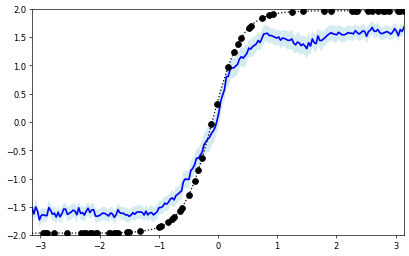

<Figure size 1100x550 with 0 Axes>

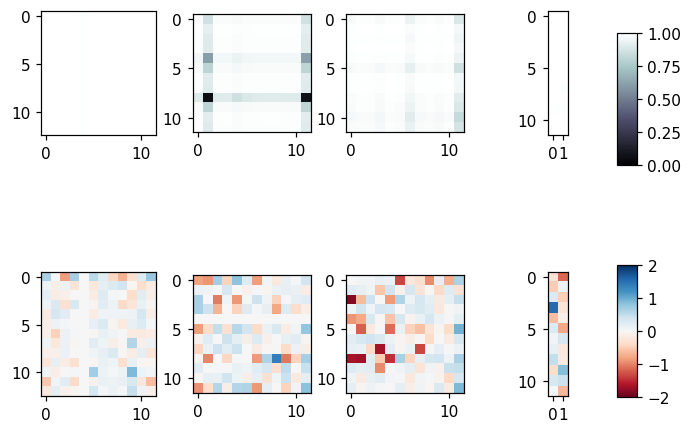

====> Epoch: 405 Average loss: 0.0042
====> Epoch: 406 Average loss: -0.0055
====> Epoch: 407 Average loss: -0.0170
====> Epoch: 408 Average loss: -0.0171
====> Epoch: 409 Average loss: -0.0193
Train Epoch:410, Batch_idx:62, Loss:-0.2260


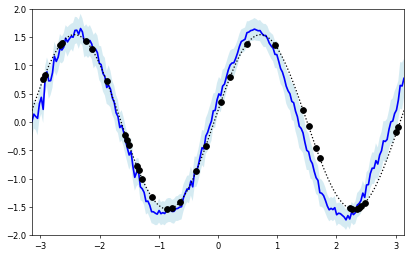

<Figure size 1100x550 with 0 Axes>

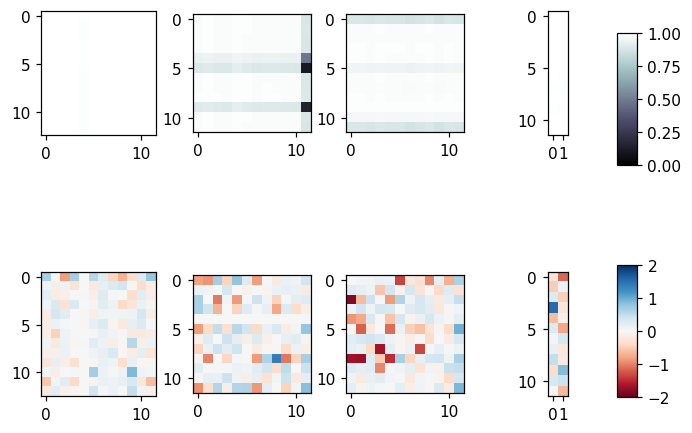

====> Epoch: 410 Average loss: -0.0196
====> Epoch: 411 Average loss: -0.0203
====> Epoch: 412 Average loss: -0.0309
====> Epoch: 413 Average loss: -0.0272
====> Epoch: 414 Average loss: -0.0126
Train Epoch:415, Batch_idx:62, Loss:-0.3150


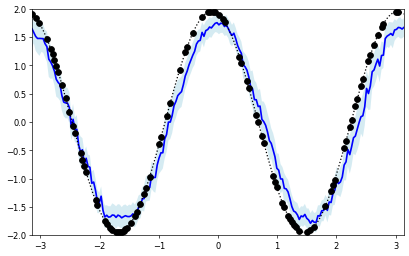

<Figure size 1100x550 with 0 Axes>

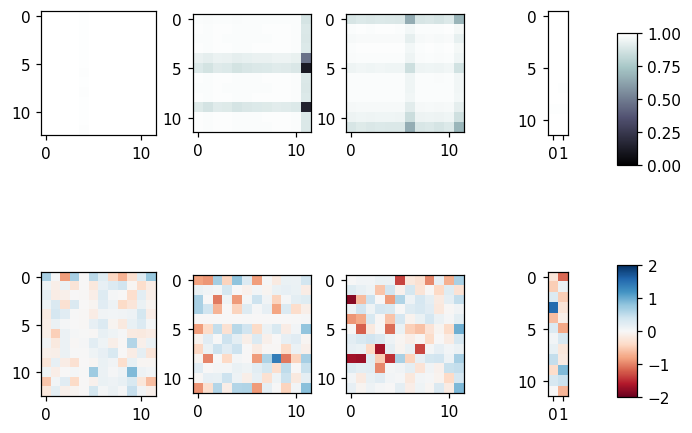

====> Epoch: 415 Average loss: -0.0228
====> Epoch: 416 Average loss: -0.0143
====> Epoch: 417 Average loss: -0.0250
====> Epoch: 418 Average loss: -0.0220
====> Epoch: 419 Average loss: -0.0176
Train Epoch:420, Batch_idx:62, Loss:-0.3660


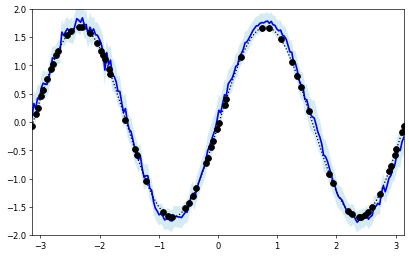

<Figure size 1100x550 with 0 Axes>

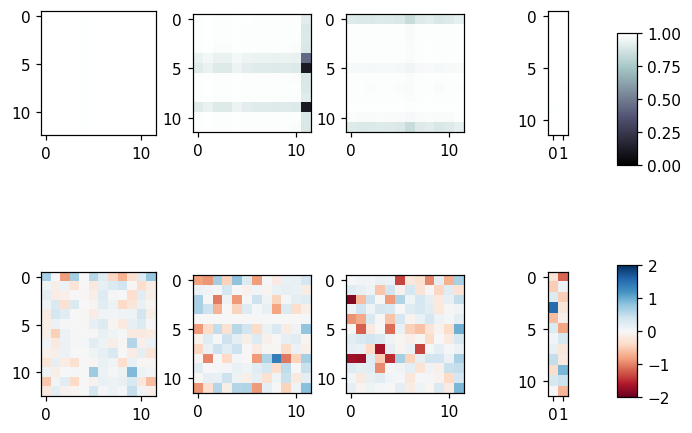

====> Epoch: 420 Average loss: -0.0247
====> Epoch: 421 Average loss: -0.0235
====> Epoch: 422 Average loss: -0.0221
====> Epoch: 423 Average loss: -0.0231
====> Epoch: 424 Average loss: -0.0229
Train Epoch:425, Batch_idx:62, Loss:-0.5294


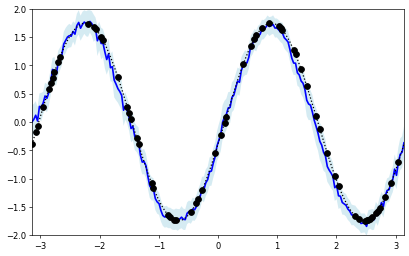

<Figure size 1100x550 with 0 Axes>

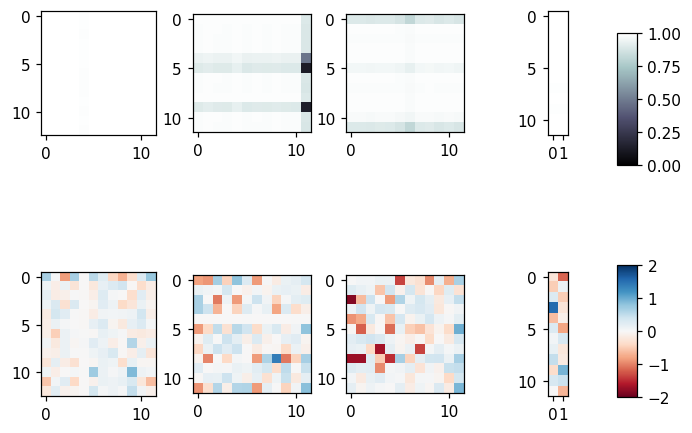

====> Epoch: 425 Average loss: -0.0211
====> Epoch: 426 Average loss: -0.0186
====> Epoch: 427 Average loss: -0.0210
====> Epoch: 428 Average loss: -0.0247
====> Epoch: 429 Average loss: -0.0266
Train Epoch:430, Batch_idx:62, Loss:-0.5455


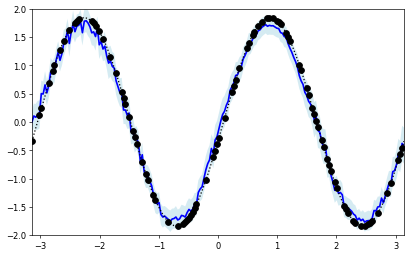

<Figure size 1100x550 with 0 Axes>

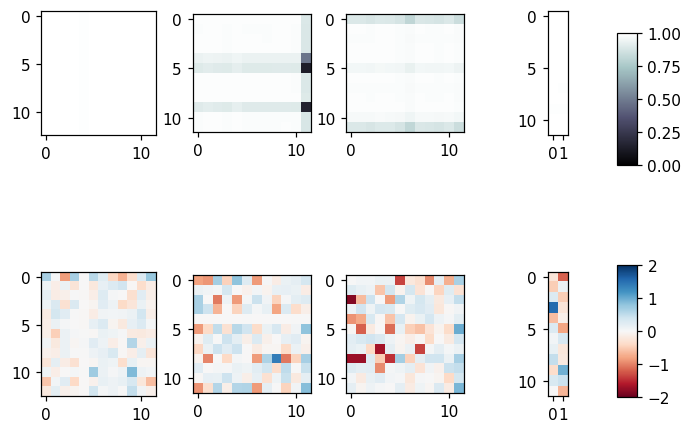

====> Epoch: 430 Average loss: -0.0239
====> Epoch: 431 Average loss: -0.0242
====> Epoch: 432 Average loss: -0.0161
====> Epoch: 433 Average loss: -0.0237
====> Epoch: 434 Average loss: -0.0234
Train Epoch:435, Batch_idx:62, Loss:-0.7323


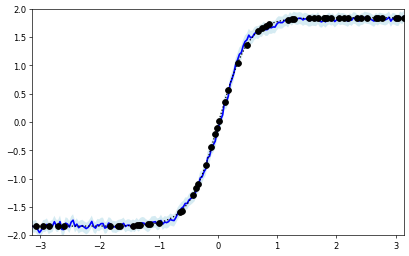

<Figure size 1100x550 with 0 Axes>

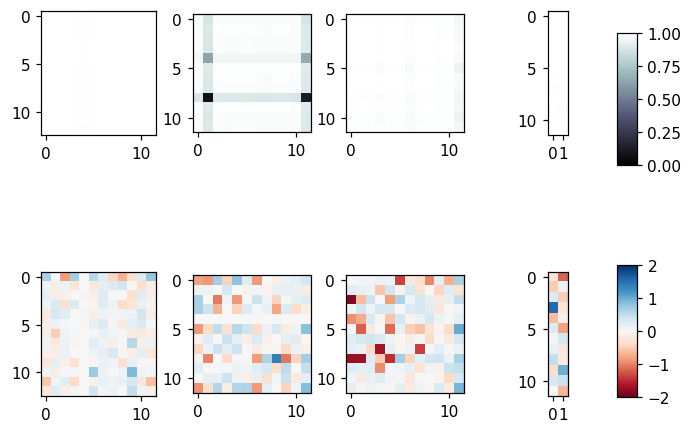

====> Epoch: 435 Average loss: -0.0261
====> Epoch: 436 Average loss: -0.0206
====> Epoch: 437 Average loss: -0.0219
====> Epoch: 438 Average loss: -0.0135
====> Epoch: 439 Average loss: -0.0230
Train Epoch:440, Batch_idx:62, Loss:-0.5702


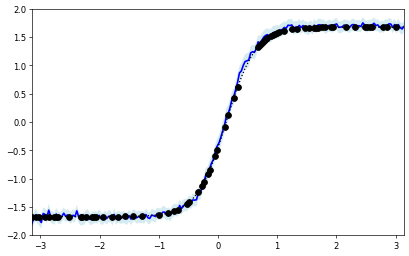

<Figure size 1100x550 with 0 Axes>

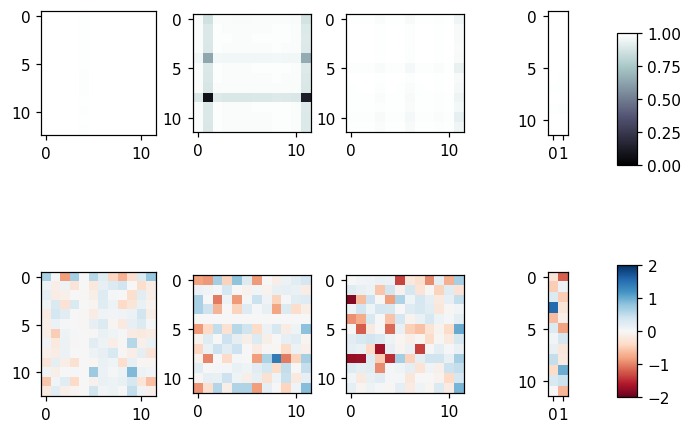

====> Epoch: 440 Average loss: -0.0253
====> Epoch: 441 Average loss: -0.0278
====> Epoch: 442 Average loss: -0.0265
====> Epoch: 443 Average loss: -0.0150
====> Epoch: 444 Average loss: -0.0228
Train Epoch:445, Batch_idx:62, Loss:-0.3464


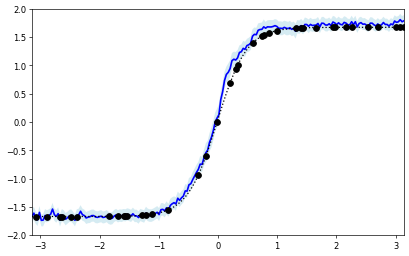

<Figure size 1100x550 with 0 Axes>

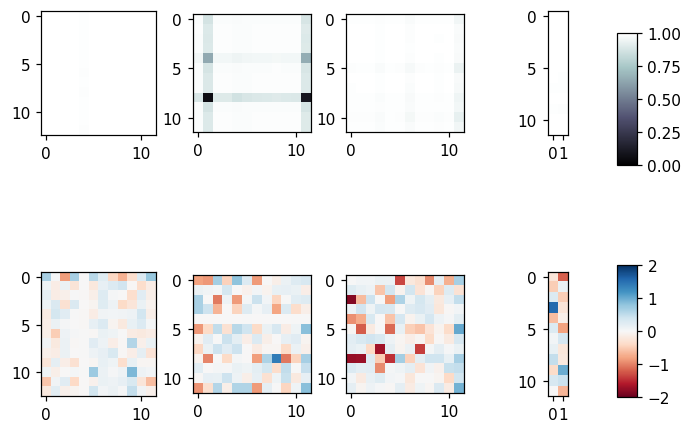

====> Epoch: 445 Average loss: -0.0239
====> Epoch: 446 Average loss: -0.0216
====> Epoch: 447 Average loss: -0.0293
====> Epoch: 448 Average loss: -0.0217
====> Epoch: 449 Average loss: -0.0154
Train Epoch:450, Batch_idx:62, Loss:-0.5780


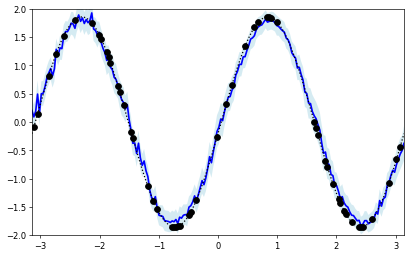

<Figure size 1100x550 with 0 Axes>

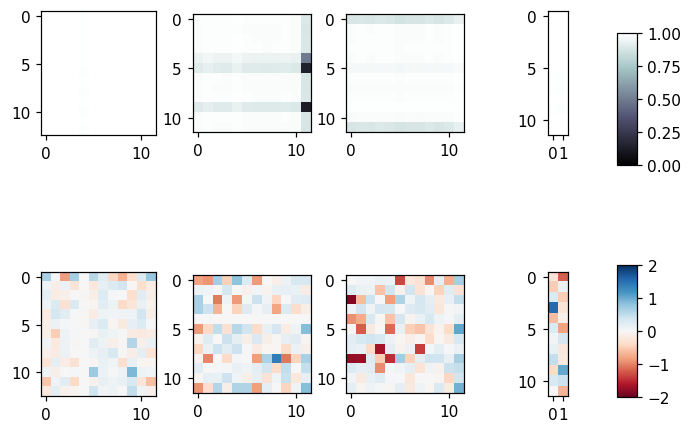

====> Epoch: 450 Average loss: -0.0276
====> Epoch: 451 Average loss: -0.0185
====> Epoch: 452 Average loss: -0.0221
====> Epoch: 453 Average loss: -0.0191
====> Epoch: 454 Average loss: -0.0268
Train Epoch:455, Batch_idx:62, Loss:-0.2218


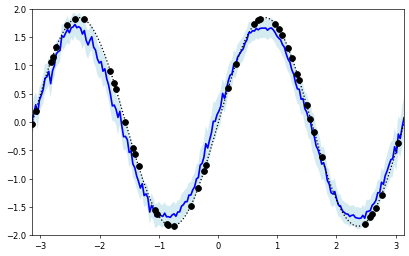

<Figure size 1100x550 with 0 Axes>

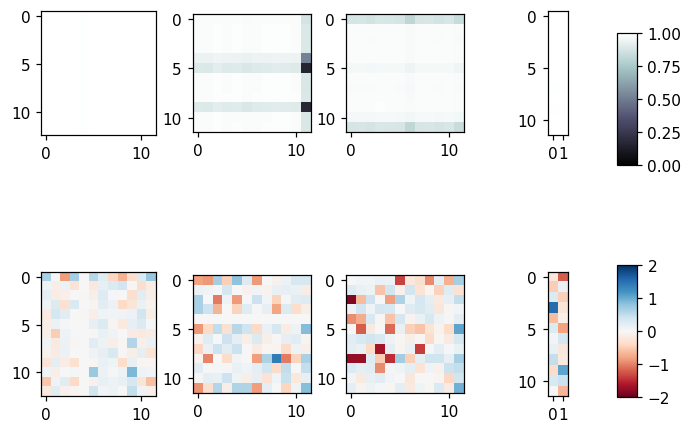

====> Epoch: 455 Average loss: -0.0191
====> Epoch: 456 Average loss: -0.0235
====> Epoch: 457 Average loss: -0.0242
====> Epoch: 458 Average loss: -0.0287
====> Epoch: 459 Average loss: -0.0264
Train Epoch:460, Batch_idx:62, Loss:-0.6342


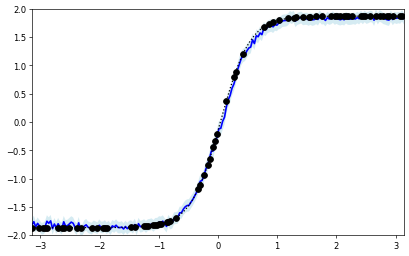

<Figure size 1100x550 with 0 Axes>

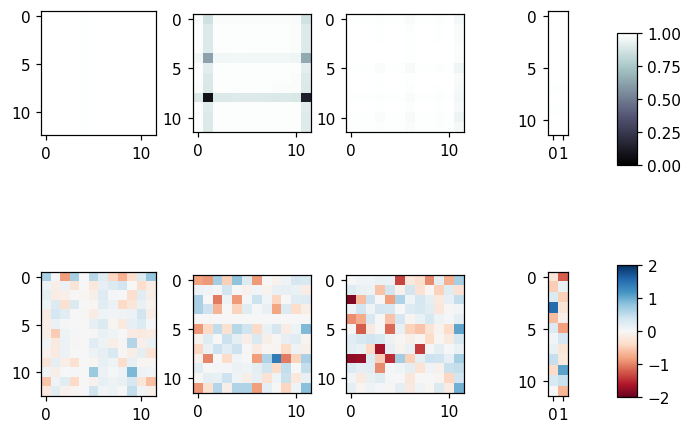

====> Epoch: 460 Average loss: -0.0171
====> Epoch: 461 Average loss: -0.0190
====> Epoch: 462 Average loss: -0.0221
====> Epoch: 463 Average loss: -0.0198
====> Epoch: 464 Average loss: -0.0275
Train Epoch:465, Batch_idx:62, Loss:-0.4604


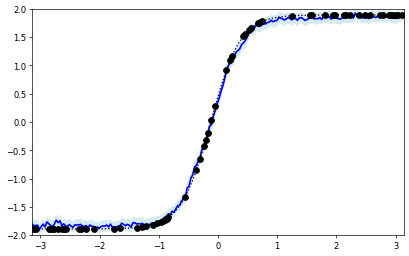

<Figure size 1100x550 with 0 Axes>

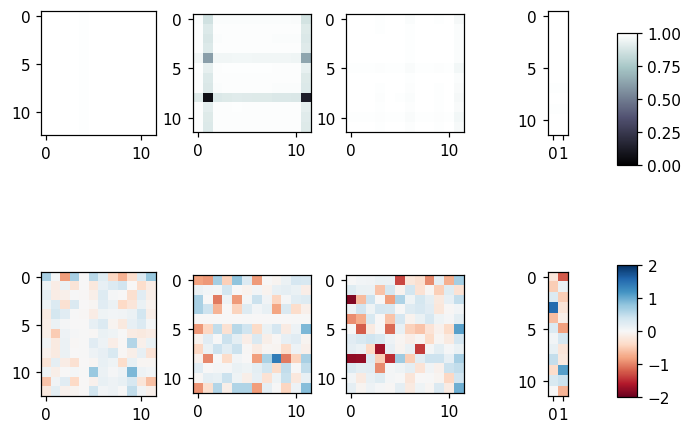

====> Epoch: 465 Average loss: -0.0298
====> Epoch: 466 Average loss: 0.0564
====> Epoch: 467 Average loss: -0.0001
====> Epoch: 468 Average loss: -0.0153
====> Epoch: 469 Average loss: -0.0118
Train Epoch:470, Batch_idx:62, Loss:-0.2097


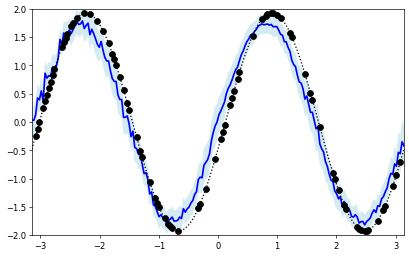

<Figure size 1100x550 with 0 Axes>

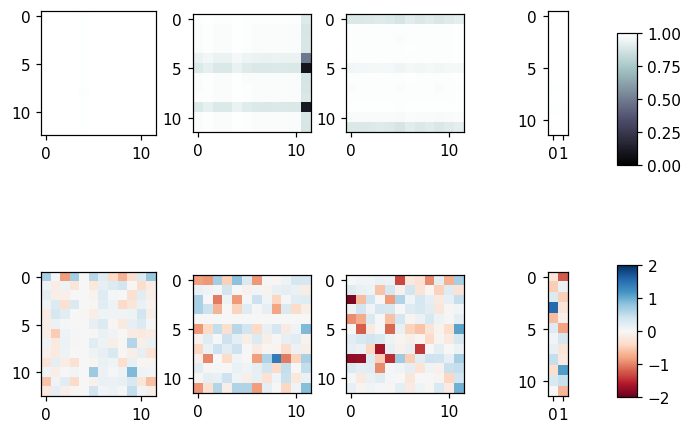

====> Epoch: 470 Average loss: -0.0186
====> Epoch: 471 Average loss: -0.0215
====> Epoch: 472 Average loss: -0.0241
====> Epoch: 473 Average loss: -0.0261
====> Epoch: 474 Average loss: -0.0249
Train Epoch:475, Batch_idx:62, Loss:-0.4639


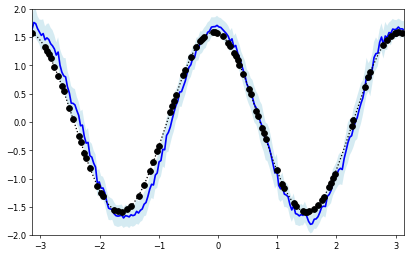

<Figure size 1100x550 with 0 Axes>

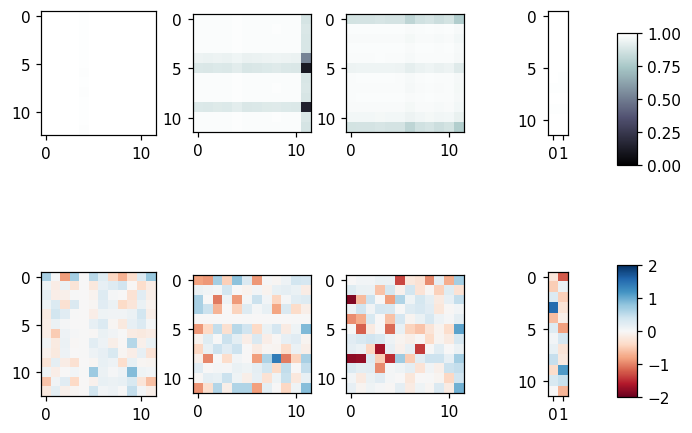

====> Epoch: 475 Average loss: -0.0224
====> Epoch: 476 Average loss: -0.0206
====> Epoch: 477 Average loss: -0.0186
====> Epoch: 478 Average loss: -0.0259
====> Epoch: 479 Average loss: -0.0292
Train Epoch:480, Batch_idx:62, Loss:0.5600


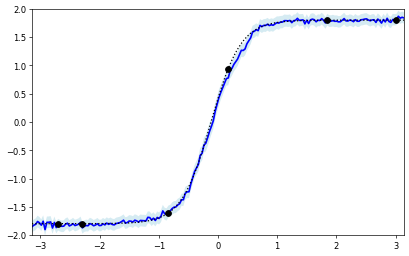

<Figure size 1100x550 with 0 Axes>

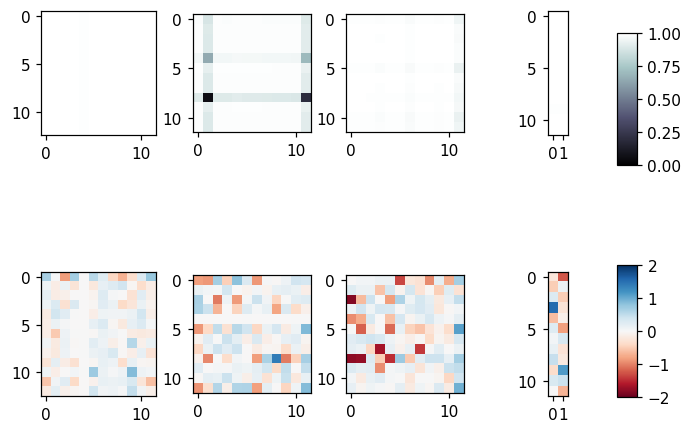

====> Epoch: 480 Average loss: -0.0315
====> Epoch: 481 Average loss: -0.0220
====> Epoch: 482 Average loss: -0.0293
====> Epoch: 483 Average loss: -0.0198
====> Epoch: 484 Average loss: -0.0239
Train Epoch:485, Batch_idx:62, Loss:-0.8134


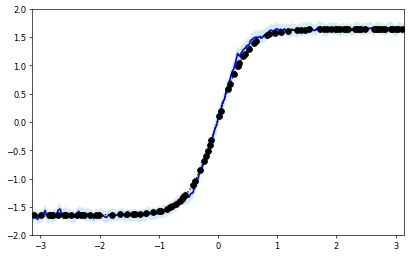

<Figure size 1100x550 with 0 Axes>

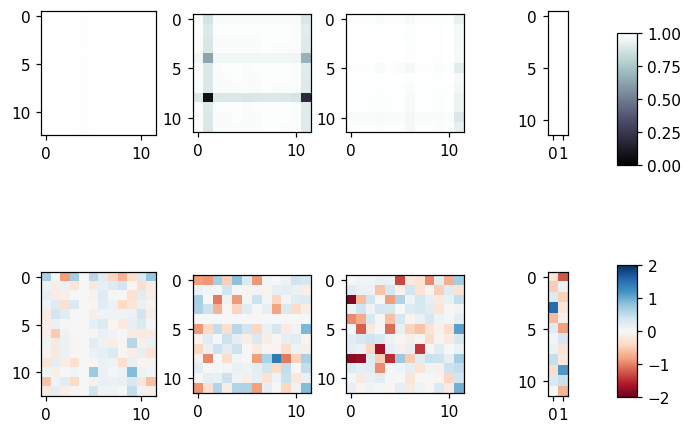

====> Epoch: 485 Average loss: -0.0248
====> Epoch: 486 Average loss: -0.0249
====> Epoch: 487 Average loss: -0.0302
====> Epoch: 488 Average loss: -0.0269
====> Epoch: 489 Average loss: -0.0147
Train Epoch:490, Batch_idx:62, Loss:-0.2200


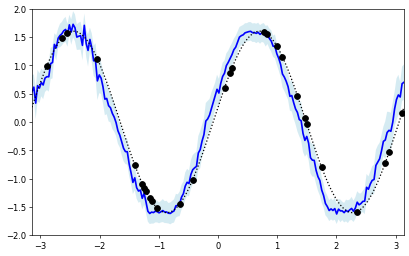

<Figure size 1100x550 with 0 Axes>

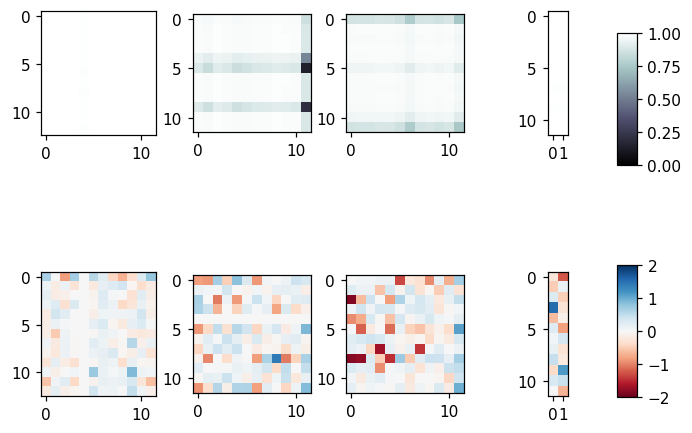

====> Epoch: 490 Average loss: -0.0269
====> Epoch: 491 Average loss: -0.0276
====> Epoch: 492 Average loss: -0.0341
====> Epoch: 493 Average loss: -0.0285
====> Epoch: 494 Average loss: -0.0269
Train Epoch:495, Batch_idx:62, Loss:0.2631


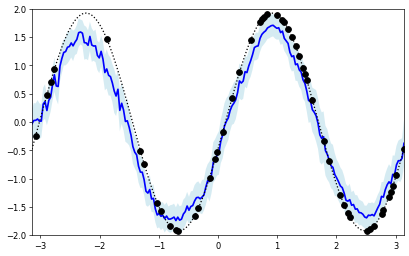

<Figure size 1100x550 with 0 Axes>

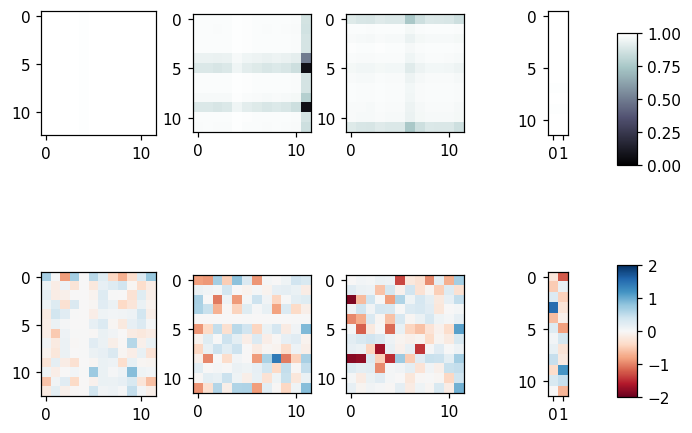

====> Epoch: 495 Average loss: 0.0252
====> Epoch: 496 Average loss: -0.0006
====> Epoch: 497 Average loss: -0.0211
====> Epoch: 498 Average loss: -0.0216
====> Epoch: 499 Average loss: -0.0247
Train Epoch:500, Batch_idx:62, Loss:-0.8393


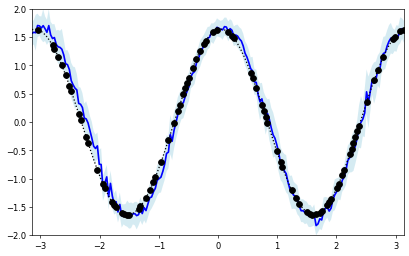

<Figure size 1100x550 with 0 Axes>

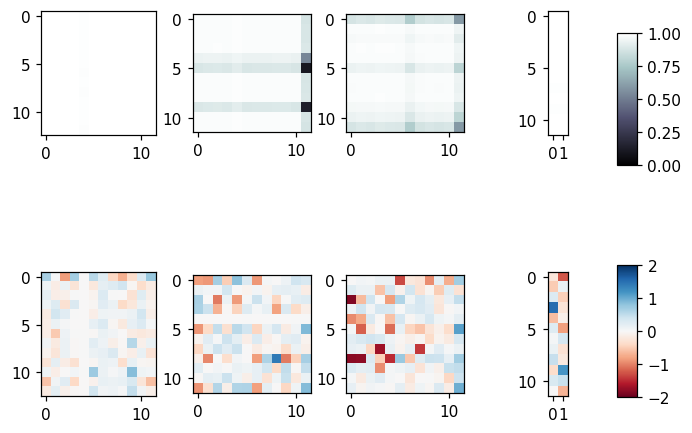

====> Epoch: 500 Average loss: -0.0259
====> Epoch: 501 Average loss: -0.0294
====> Epoch: 502 Average loss: -0.0284
====> Epoch: 503 Average loss: -0.0229
====> Epoch: 504 Average loss: -0.0231
Train Epoch:505, Batch_idx:62, Loss:-0.3936


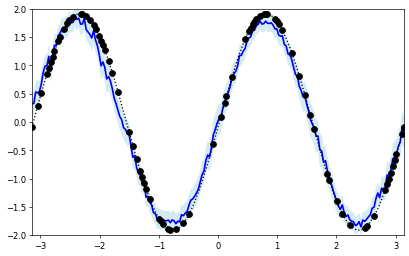

<Figure size 1100x550 with 0 Axes>

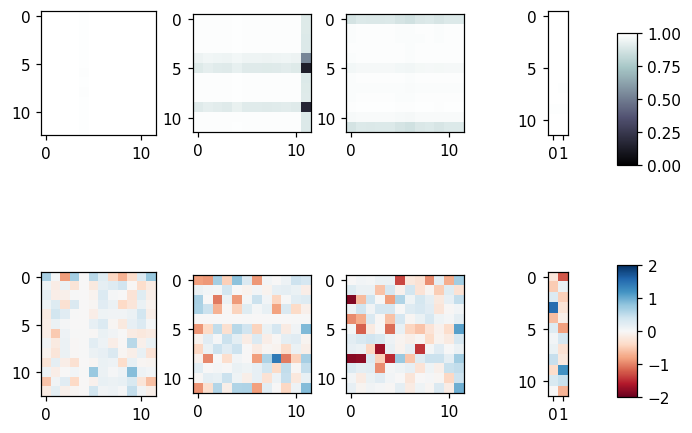

====> Epoch: 505 Average loss: -0.0244
====> Epoch: 506 Average loss: -0.0306
====> Epoch: 507 Average loss: -0.0138
====> Epoch: 508 Average loss: -0.0250
====> Epoch: 509 Average loss: -0.0219
Train Epoch:510, Batch_idx:62, Loss:-0.2021


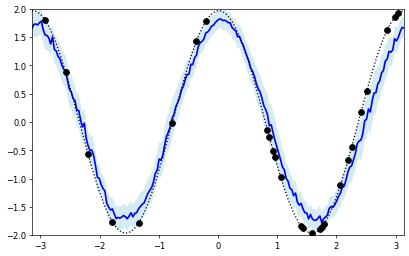

<Figure size 1100x550 with 0 Axes>

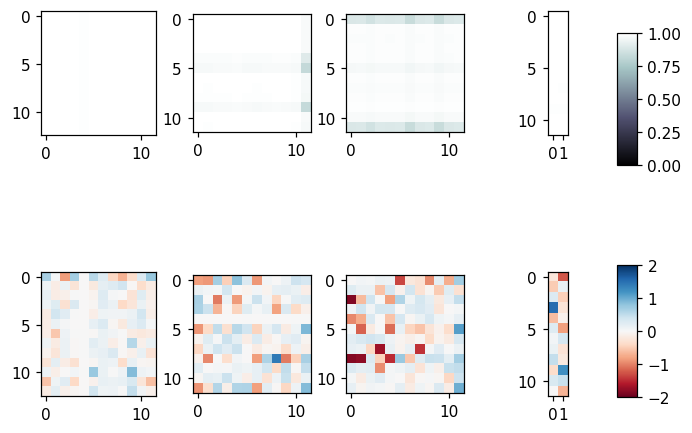

====> Epoch: 510 Average loss: -0.0169
====> Epoch: 511 Average loss: -0.0227
====> Epoch: 512 Average loss: -0.0237
====> Epoch: 513 Average loss: -0.0286
====> Epoch: 514 Average loss: -0.0174
Train Epoch:515, Batch_idx:62, Loss:-0.6899


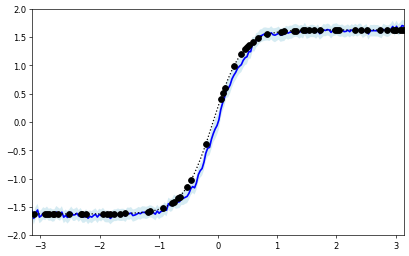

<Figure size 1100x550 with 0 Axes>

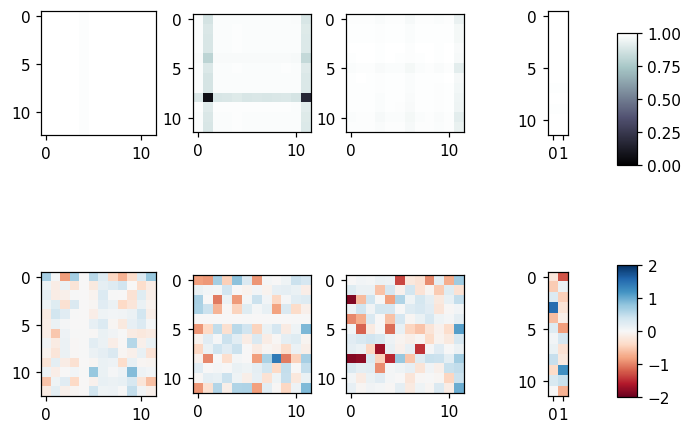

====> Epoch: 515 Average loss: -0.0289
====> Epoch: 516 Average loss: -0.0310
====> Epoch: 517 Average loss: -0.0257
====> Epoch: 518 Average loss: -0.0252
====> Epoch: 519 Average loss: -0.0290
Train Epoch:520, Batch_idx:62, Loss:-0.5985


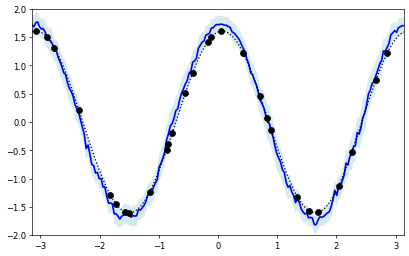

<Figure size 1100x550 with 0 Axes>

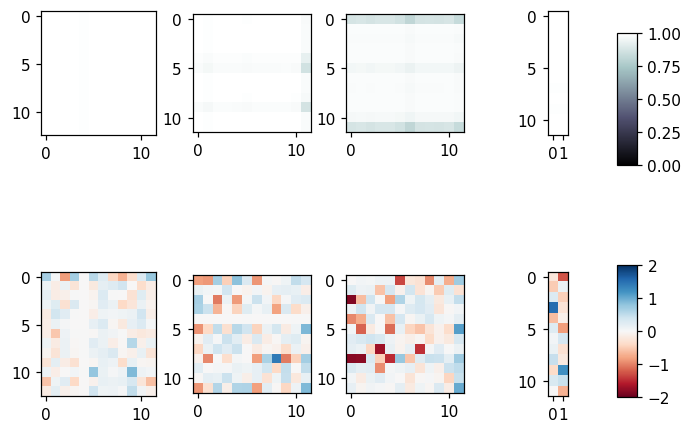

====> Epoch: 520 Average loss: -0.0324
====> Epoch: 521 Average loss: -0.0142
====> Epoch: 522 Average loss: -0.0214
====> Epoch: 523 Average loss: -0.0198
====> Epoch: 524 Average loss: -0.0261
Train Epoch:525, Batch_idx:62, Loss:2.2051


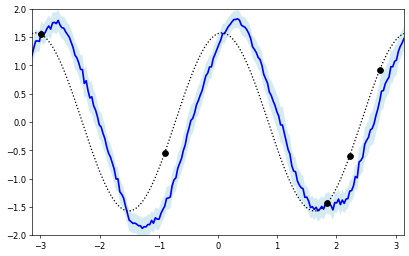

<Figure size 1100x550 with 0 Axes>

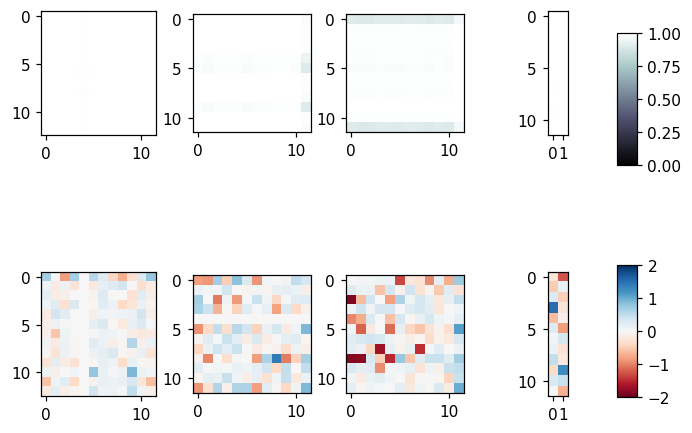

====> Epoch: 525 Average loss: -0.0189
====> Epoch: 526 Average loss: -0.0201
====> Epoch: 527 Average loss: -0.0256
====> Epoch: 528 Average loss: -0.0172
====> Epoch: 529 Average loss: -0.0151
Train Epoch:530, Batch_idx:62, Loss:-0.4588


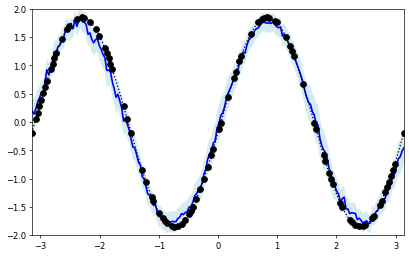

<Figure size 1100x550 with 0 Axes>

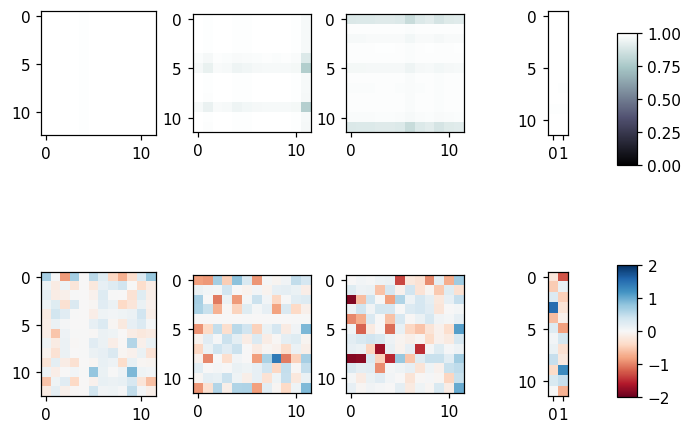

====> Epoch: 530 Average loss: -0.0251
====> Epoch: 531 Average loss: -0.0162
====> Epoch: 532 Average loss: -0.0057
====> Epoch: 533 Average loss: -0.0307
====> Epoch: 534 Average loss: -0.0250
Train Epoch:535, Batch_idx:62, Loss:-0.3984


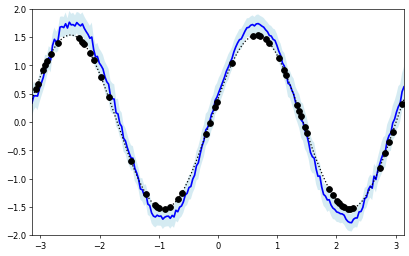

<Figure size 1100x550 with 0 Axes>

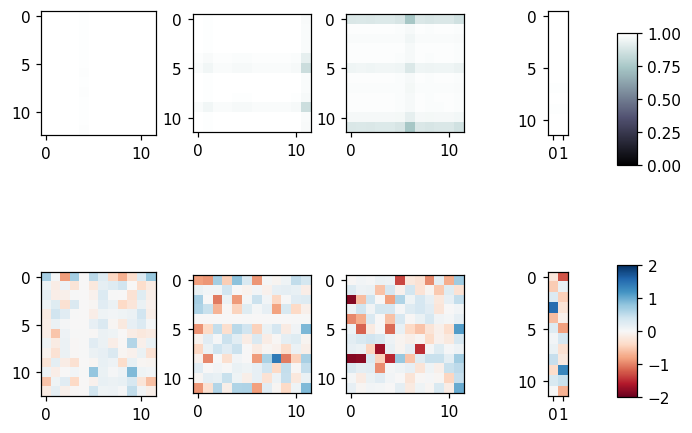

====> Epoch: 535 Average loss: -0.0259
====> Epoch: 536 Average loss: -0.0281
====> Epoch: 537 Average loss: -0.0309
====> Epoch: 538 Average loss: -0.0264
====> Epoch: 539 Average loss: -0.0230
Train Epoch:540, Batch_idx:62, Loss:-0.7719


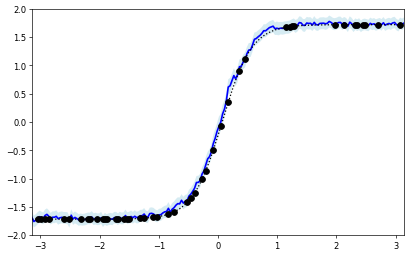

<Figure size 1100x550 with 0 Axes>

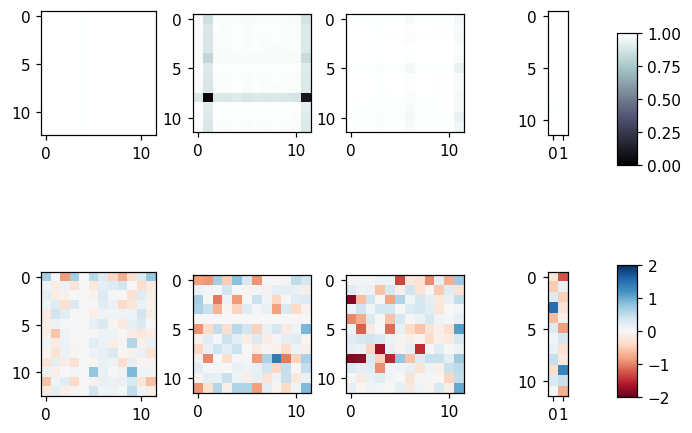

====> Epoch: 540 Average loss: -0.0308
====> Epoch: 541 Average loss: -0.0272
====> Epoch: 542 Average loss: -0.0305
====> Epoch: 543 Average loss: -0.0294
====> Epoch: 544 Average loss: -0.0274
Train Epoch:545, Batch_idx:62, Loss:-0.5616


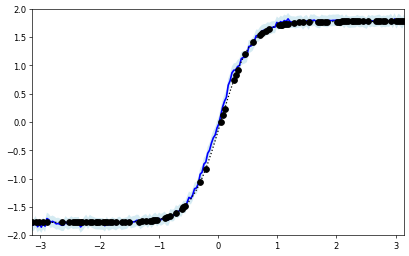

<Figure size 1100x550 with 0 Axes>

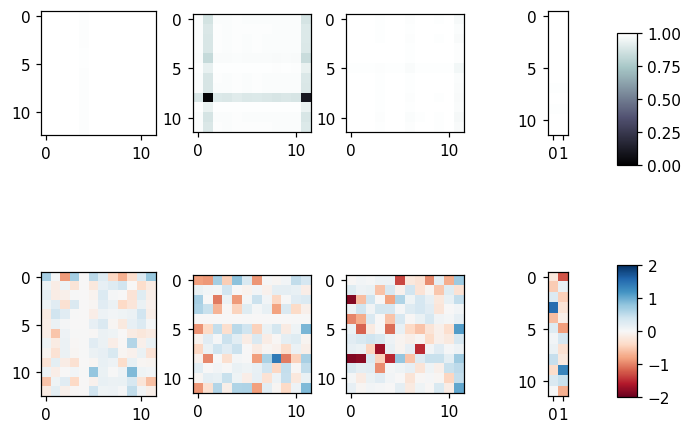

====> Epoch: 545 Average loss: -0.0284
====> Epoch: 546 Average loss: -0.0283
====> Epoch: 547 Average loss: -0.0267
====> Epoch: 548 Average loss: -0.0179
====> Epoch: 549 Average loss: -0.0296
Train Epoch:550, Batch_idx:62, Loss:-0.4878


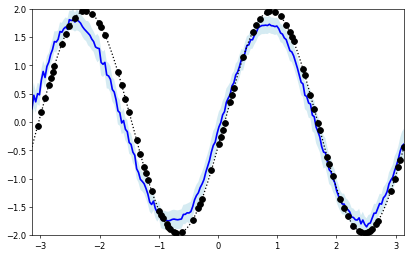

<Figure size 1100x550 with 0 Axes>

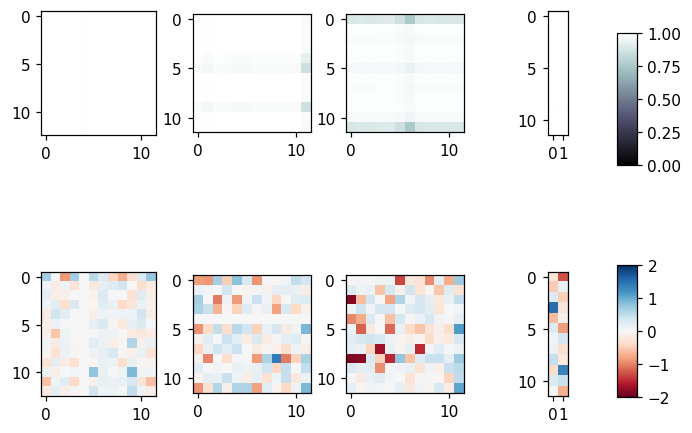

====> Epoch: 550 Average loss: -0.0299
====> Epoch: 551 Average loss: -0.0247
====> Epoch: 552 Average loss: -0.0269
====> Epoch: 553 Average loss: -0.0247
====> Epoch: 554 Average loss: -0.0308
Train Epoch:555, Batch_idx:62, Loss:-0.3576


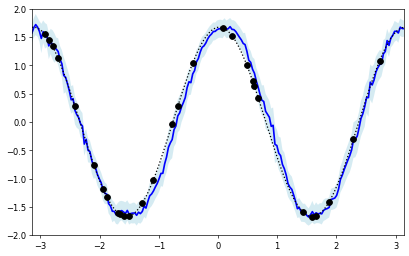

<Figure size 1100x550 with 0 Axes>

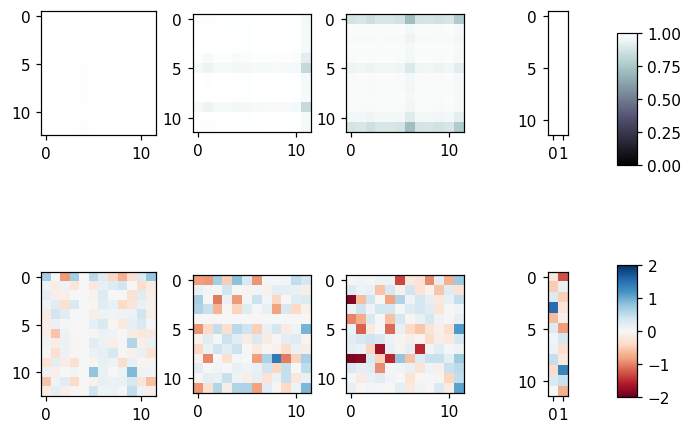

====> Epoch: 555 Average loss: -0.0296
====> Epoch: 556 Average loss: -0.0305
====> Epoch: 557 Average loss: -0.0274
====> Epoch: 558 Average loss: -0.0267
====> Epoch: 559 Average loss: -0.0239
Train Epoch:560, Batch_idx:62, Loss:-0.5197


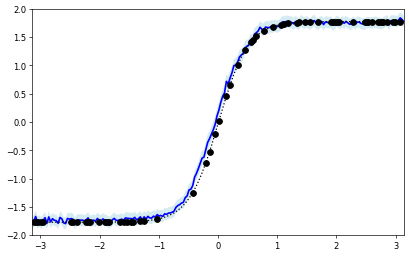

<Figure size 1100x550 with 0 Axes>

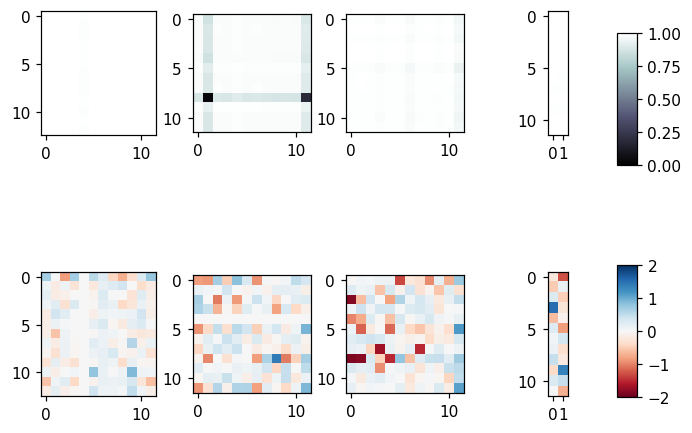

====> Epoch: 560 Average loss: -0.0275
====> Epoch: 561 Average loss: -0.0340
====> Epoch: 562 Average loss: -0.0304
====> Epoch: 563 Average loss: -0.0299
====> Epoch: 564 Average loss: -0.0233
Train Epoch:565, Batch_idx:62, Loss:-0.6202


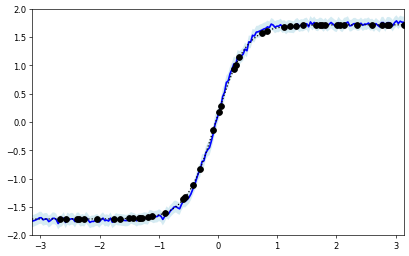

<Figure size 1100x550 with 0 Axes>

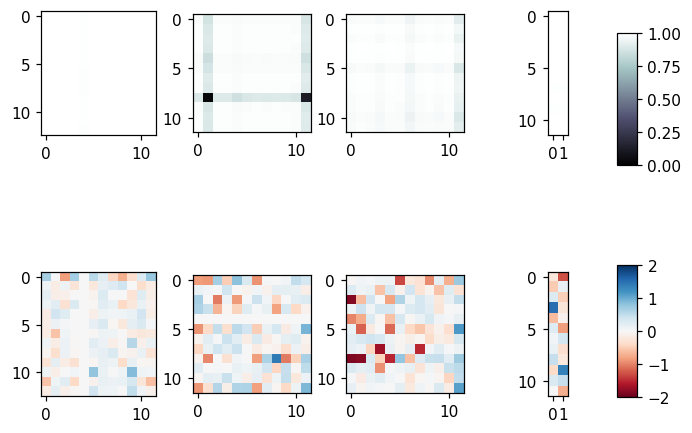

====> Epoch: 565 Average loss: -0.0222
====> Epoch: 566 Average loss: -0.0226
====> Epoch: 567 Average loss: -0.0201
====> Epoch: 568 Average loss: -0.0324
====> Epoch: 569 Average loss: -0.0193
Train Epoch:570, Batch_idx:62, Loss:-0.7042


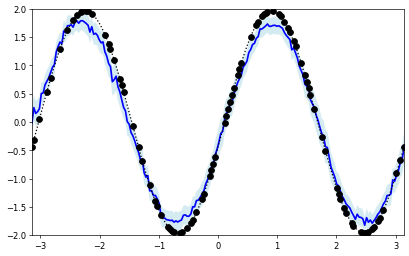

<Figure size 1100x550 with 0 Axes>

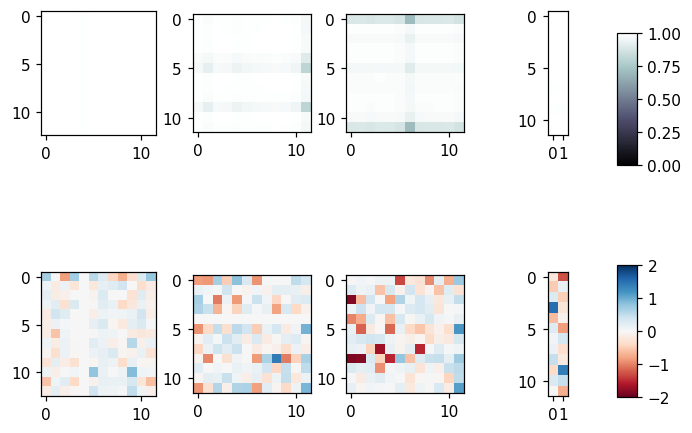

====> Epoch: 570 Average loss: -0.0246
====> Epoch: 571 Average loss: -0.0281
====> Epoch: 572 Average loss: -0.0308
====> Epoch: 573 Average loss: -0.0289
====> Epoch: 574 Average loss: -0.0235
Train Epoch:575, Batch_idx:62, Loss:-0.3877


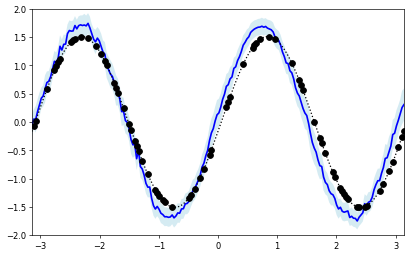

<Figure size 1100x550 with 0 Axes>

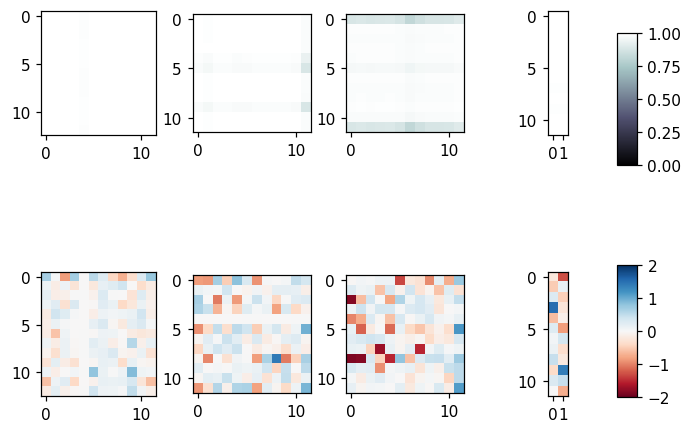

====> Epoch: 575 Average loss: -0.0339
====> Epoch: 576 Average loss: -0.0290
====> Epoch: 577 Average loss: -0.0215
====> Epoch: 578 Average loss: -0.0250
====> Epoch: 579 Average loss: -0.0167
Train Epoch:580, Batch_idx:62, Loss:-0.6047


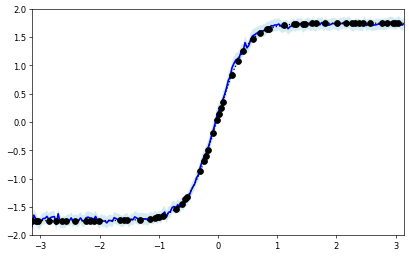

<Figure size 1100x550 with 0 Axes>

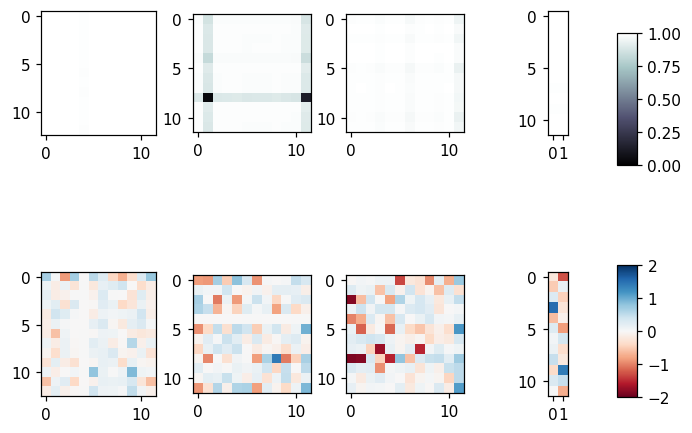

====> Epoch: 580 Average loss: -0.0288
====> Epoch: 581 Average loss: -0.0314
====> Epoch: 582 Average loss: -0.0304
====> Epoch: 583 Average loss: -0.0289
====> Epoch: 584 Average loss: -0.0287
Train Epoch:585, Batch_idx:62, Loss:-0.5076


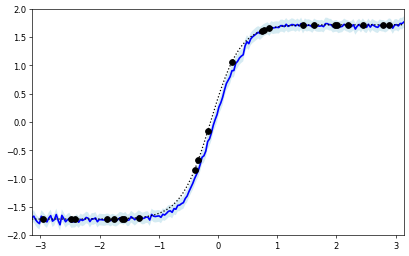

<Figure size 1100x550 with 0 Axes>

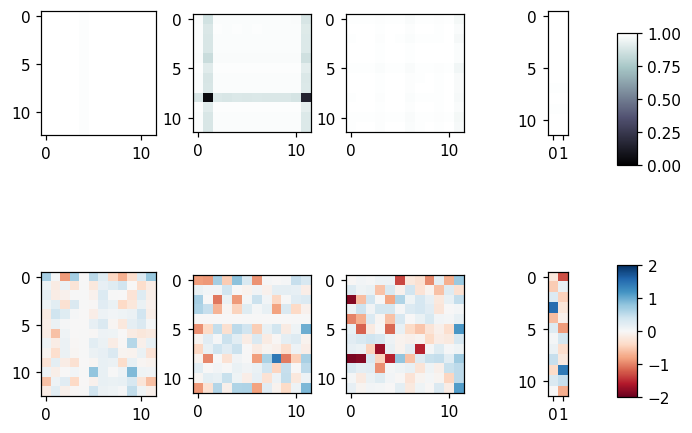

====> Epoch: 585 Average loss: -0.0235
====> Epoch: 586 Average loss: -0.0317
====> Epoch: 587 Average loss: -0.0302
====> Epoch: 588 Average loss: -0.0293
====> Epoch: 589 Average loss: -0.0245
Train Epoch:590, Batch_idx:62, Loss:-0.6701


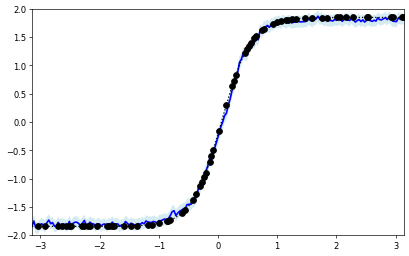

<Figure size 1100x550 with 0 Axes>

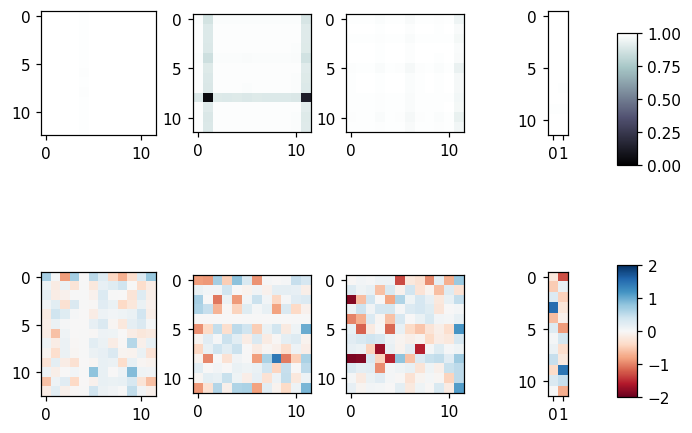

====> Epoch: 590 Average loss: -0.0276
====> Epoch: 591 Average loss: -0.0361
====> Epoch: 592 Average loss: -0.0283
====> Epoch: 593 Average loss: -0.0268
====> Epoch: 594 Average loss: -0.0231
Train Epoch:595, Batch_idx:62, Loss:-0.6471


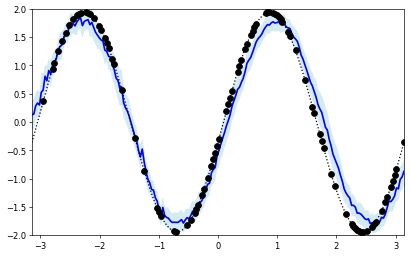

<Figure size 1100x550 with 0 Axes>

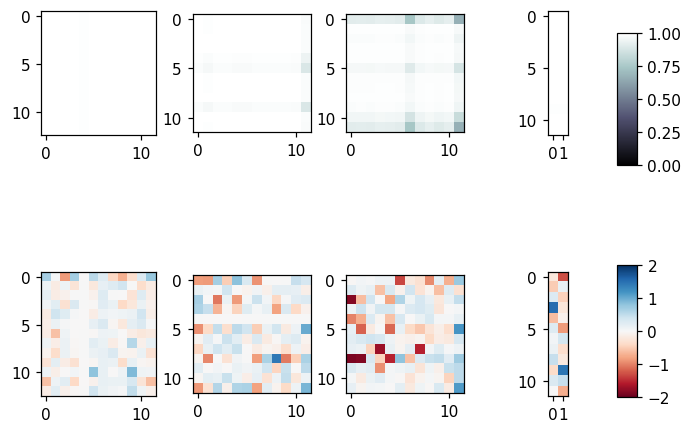

====> Epoch: 595 Average loss: -0.0253
====> Epoch: 596 Average loss: -0.0279
====> Epoch: 597 Average loss: -0.0269
====> Epoch: 598 Average loss: -0.0300
====> Epoch: 599 Average loss: -0.0244
Train Epoch:600, Batch_idx:62, Loss:-0.5424


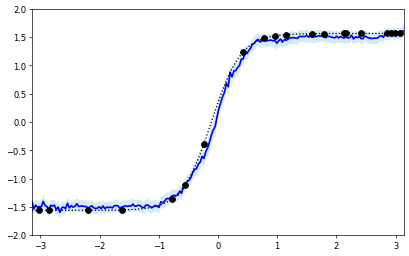

<Figure size 1100x550 with 0 Axes>

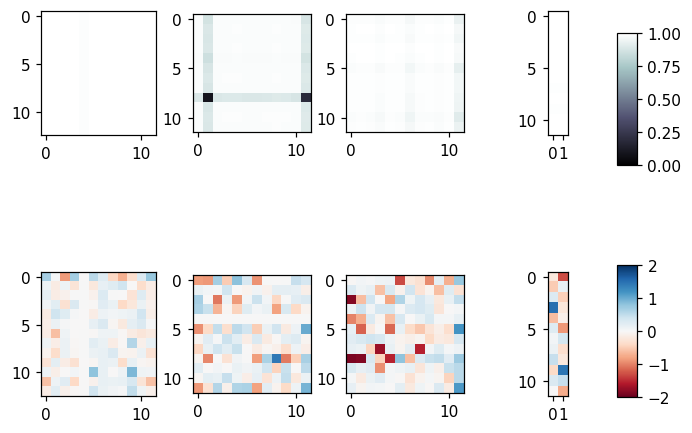

====> Epoch: 600 Average loss: -0.0354
====> Epoch: 601 Average loss: -0.0232
====> Epoch: 602 Average loss: -0.0283
====> Epoch: 603 Average loss: -0.0297
====> Epoch: 604 Average loss: -0.0298
Train Epoch:605, Batch_idx:62, Loss:-0.3759


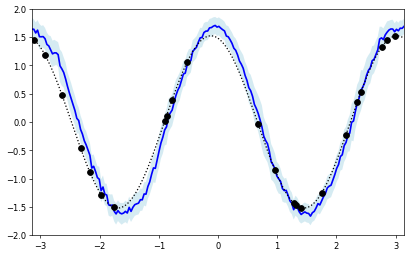

<Figure size 1100x550 with 0 Axes>

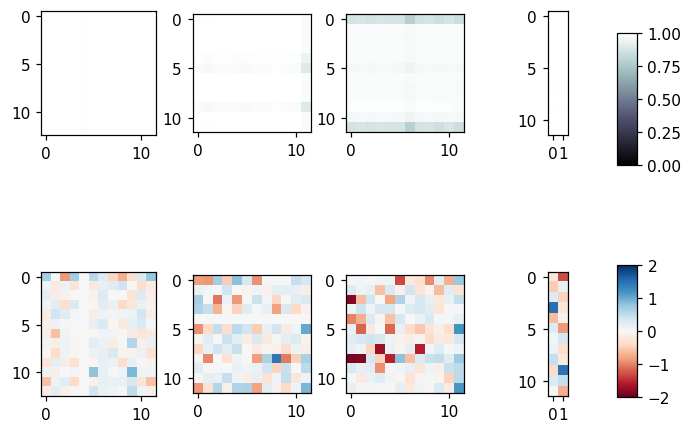

====> Epoch: 605 Average loss: -0.0305
====> Epoch: 606 Average loss: -0.0236
====> Epoch: 607 Average loss: -0.0352
====> Epoch: 608 Average loss: -0.0349
====> Epoch: 609 Average loss: -0.0353
Train Epoch:610, Batch_idx:62, Loss:-0.7161


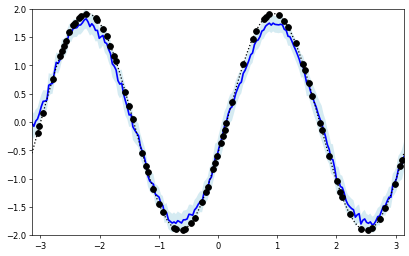

<Figure size 1100x550 with 0 Axes>

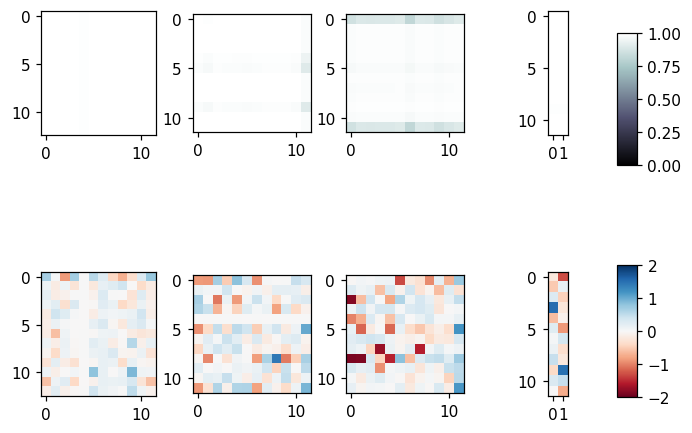

====> Epoch: 610 Average loss: -0.0287
====> Epoch: 611 Average loss: -0.0164
====> Epoch: 612 Average loss: -0.0255
====> Epoch: 613 Average loss: -0.0293
====> Epoch: 614 Average loss: -0.0330
Train Epoch:615, Batch_idx:62, Loss:2.6599


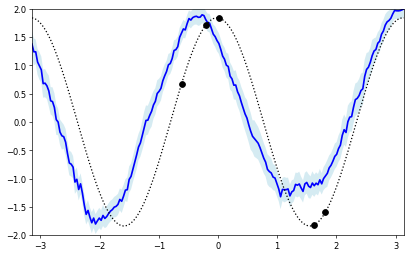

<Figure size 1100x550 with 0 Axes>

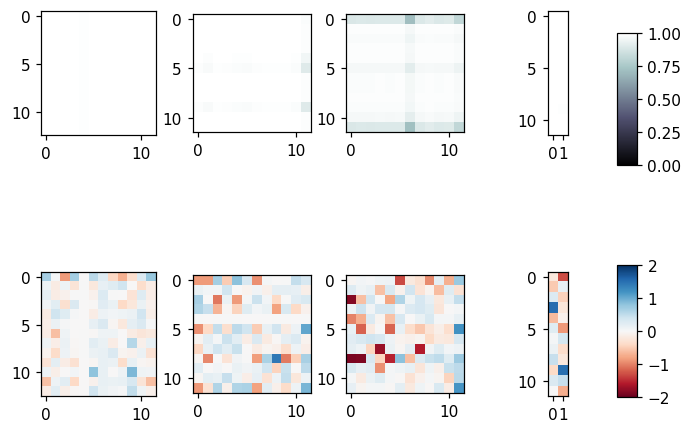

====> Epoch: 615 Average loss: -0.0222
====> Epoch: 616 Average loss: -0.0306
====> Epoch: 617 Average loss: -0.0256
====> Epoch: 618 Average loss: -0.0213
====> Epoch: 619 Average loss: -0.0300
Train Epoch:620, Batch_idx:62, Loss:-0.7786


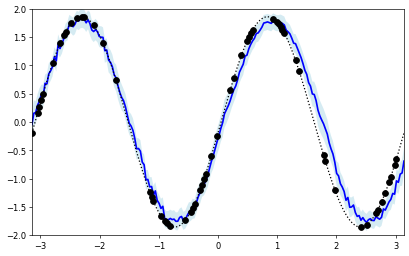

<Figure size 1100x550 with 0 Axes>

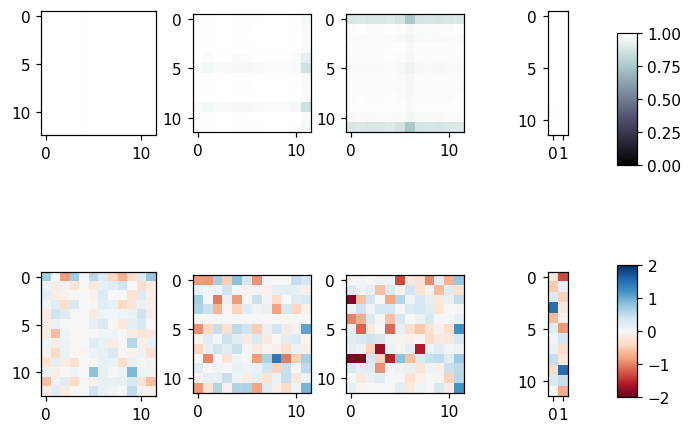

====> Epoch: 620 Average loss: -0.0334
====> Epoch: 621 Average loss: -0.0330
====> Epoch: 622 Average loss: -0.0327
====> Epoch: 623 Average loss: -0.0373
====> Epoch: 624 Average loss: -0.0289
Train Epoch:625, Batch_idx:62, Loss:-0.6088


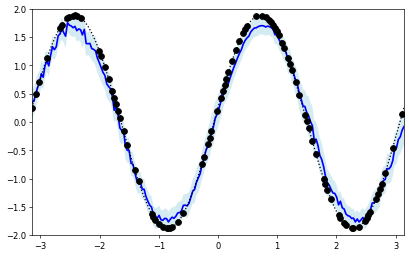

<Figure size 1100x550 with 0 Axes>

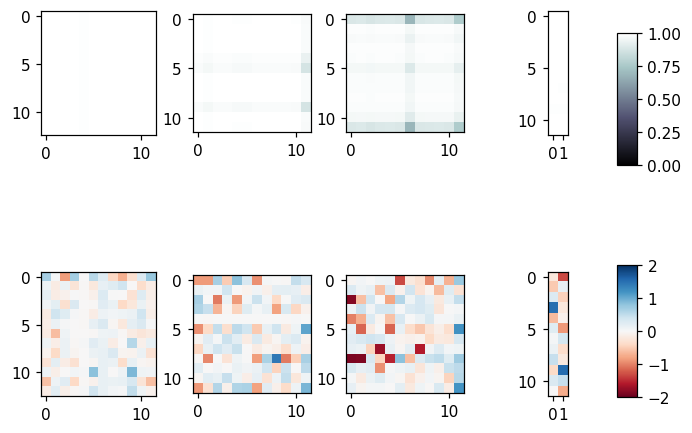

====> Epoch: 625 Average loss: -0.0224
====> Epoch: 626 Average loss: -0.0289
====> Epoch: 627 Average loss: -0.0320
====> Epoch: 628 Average loss: -0.0298
====> Epoch: 629 Average loss: -0.0265
Train Epoch:630, Batch_idx:62, Loss:-0.6893


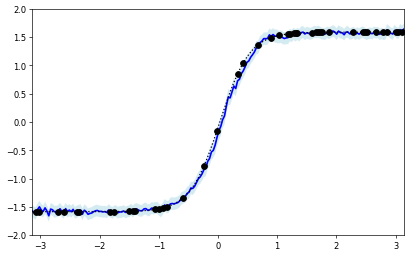

<Figure size 1100x550 with 0 Axes>

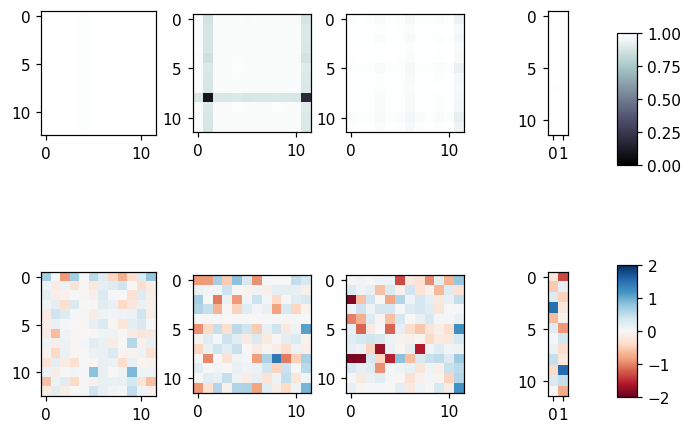

====> Epoch: 630 Average loss: -0.0316
====> Epoch: 631 Average loss: -0.0291
====> Epoch: 632 Average loss: -0.0277
====> Epoch: 633 Average loss: -0.0324
====> Epoch: 634 Average loss: -0.0230
Train Epoch:635, Batch_idx:62, Loss:-0.7745


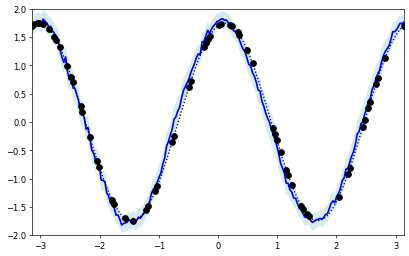

<Figure size 1100x550 with 0 Axes>

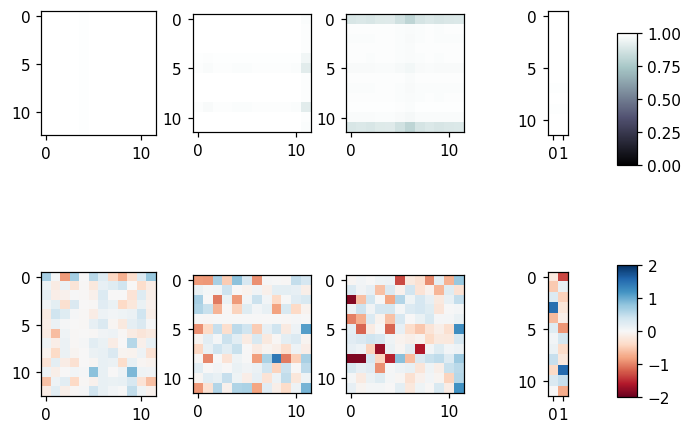

====> Epoch: 635 Average loss: -0.0370
====> Epoch: 636 Average loss: -0.0327
====> Epoch: 637 Average loss: -0.0267
====> Epoch: 638 Average loss: -0.0301
====> Epoch: 639 Average loss: -0.0295
Train Epoch:640, Batch_idx:62, Loss:-0.2875


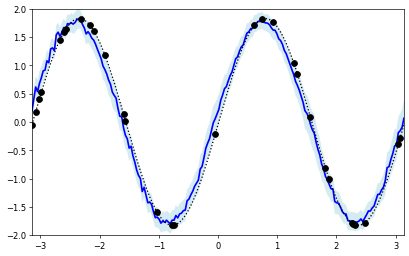

<Figure size 1100x550 with 0 Axes>

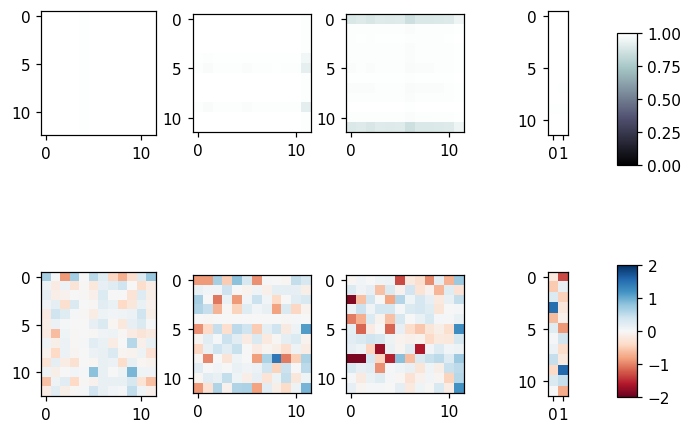

====> Epoch: 640 Average loss: -0.0260
====> Epoch: 641 Average loss: -0.0367
====> Epoch: 642 Average loss: -0.0212
====> Epoch: 643 Average loss: -0.0365
====> Epoch: 644 Average loss: -0.0326
Train Epoch:645, Batch_idx:62, Loss:-0.4509


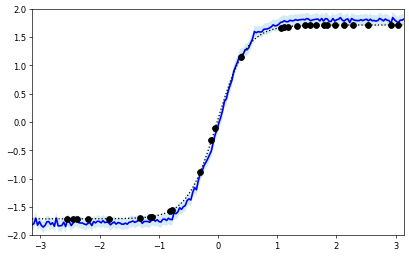

<Figure size 1100x550 with 0 Axes>

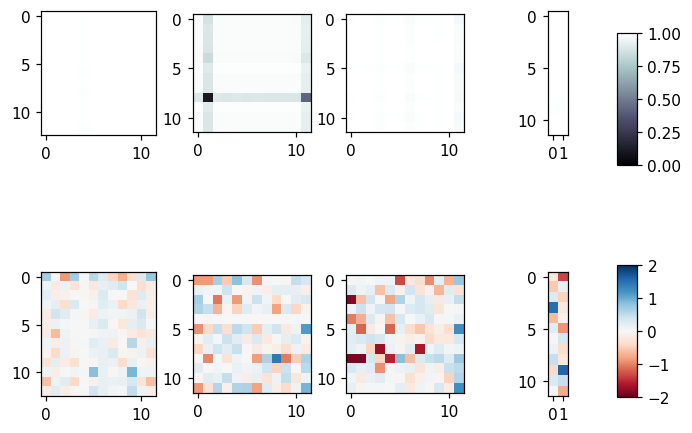

====> Epoch: 645 Average loss: -0.0288
====> Epoch: 646 Average loss: -0.0282
====> Epoch: 647 Average loss: -0.0233
====> Epoch: 648 Average loss: -0.0324
====> Epoch: 649 Average loss: 0.0317
Train Epoch:650, Batch_idx:62, Loss:-0.0088


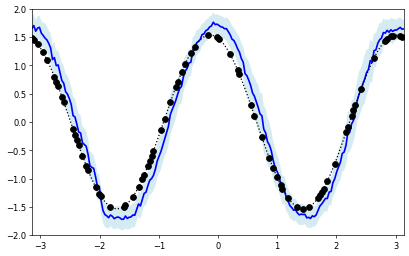

<Figure size 1100x550 with 0 Axes>

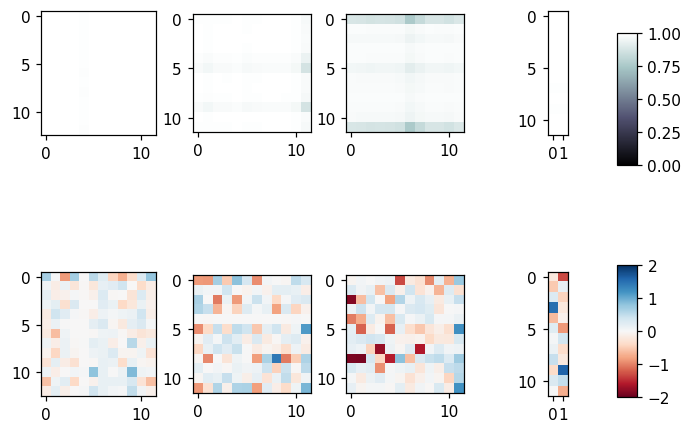

====> Epoch: 650 Average loss: 0.0060
====> Epoch: 651 Average loss: -0.0134
====> Epoch: 652 Average loss: -0.0227
====> Epoch: 653 Average loss: -0.0199
====> Epoch: 654 Average loss: -0.0198
Train Epoch:655, Batch_idx:62, Loss:-0.2114


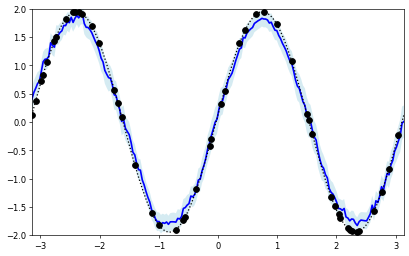

<Figure size 1100x550 with 0 Axes>

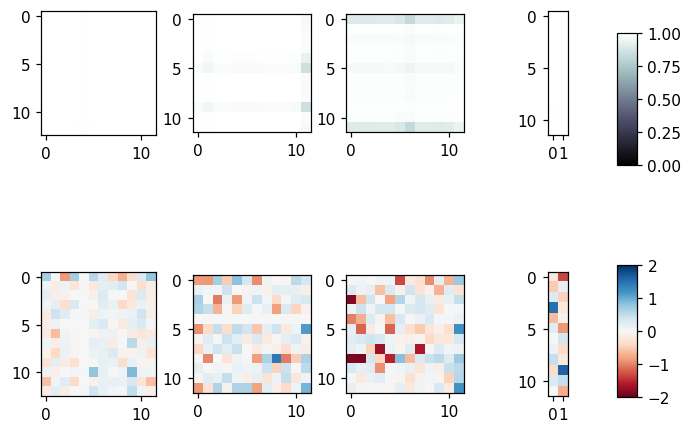

====> Epoch: 655 Average loss: -0.0256
====> Epoch: 656 Average loss: -0.0325
====> Epoch: 657 Average loss: -0.0266
====> Epoch: 658 Average loss: -0.0291
====> Epoch: 659 Average loss: -0.0240
Train Epoch:660, Batch_idx:62, Loss:-0.2270


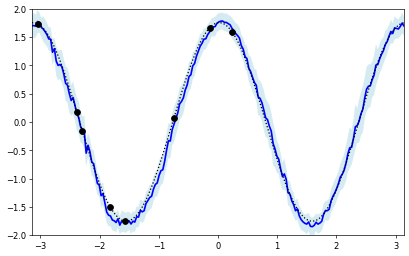

<Figure size 1100x550 with 0 Axes>

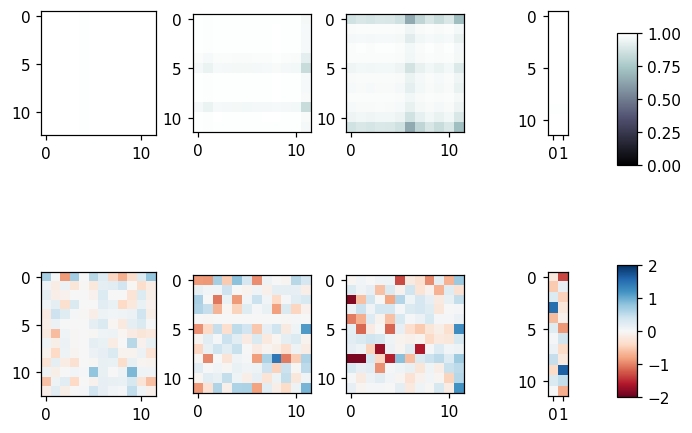

====> Epoch: 660 Average loss: -0.0201
====> Epoch: 661 Average loss: -0.0278
====> Epoch: 662 Average loss: -0.0309
====> Epoch: 663 Average loss: -0.0286
====> Epoch: 664 Average loss: -0.0295
Train Epoch:665, Batch_idx:62, Loss:-0.3985


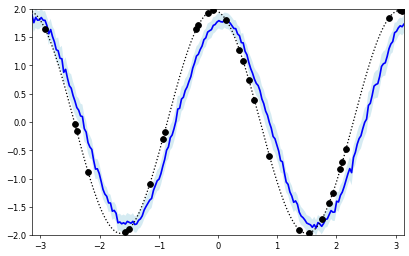

<Figure size 1100x550 with 0 Axes>

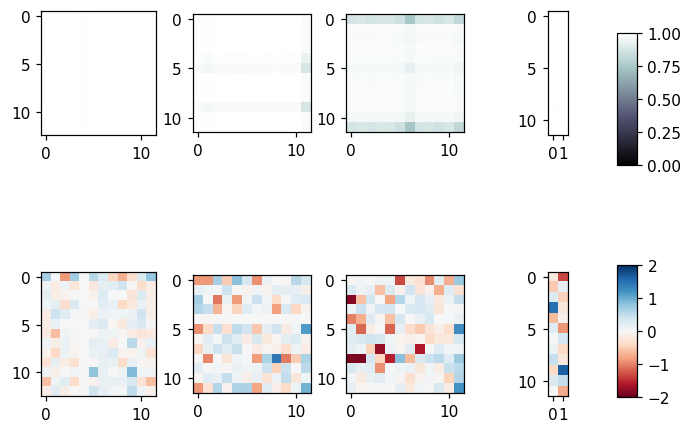

====> Epoch: 665 Average loss: -0.0377
====> Epoch: 666 Average loss: -0.0148
====> Epoch: 667 Average loss: -0.0252
====> Epoch: 668 Average loss: -0.0301
====> Epoch: 669 Average loss: -0.0336
Train Epoch:670, Batch_idx:62, Loss:-0.8892


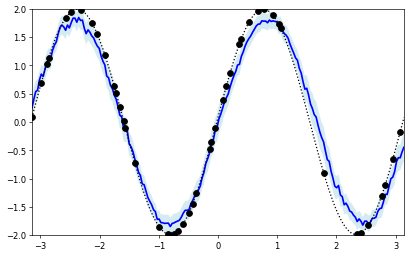

<Figure size 1100x550 with 0 Axes>

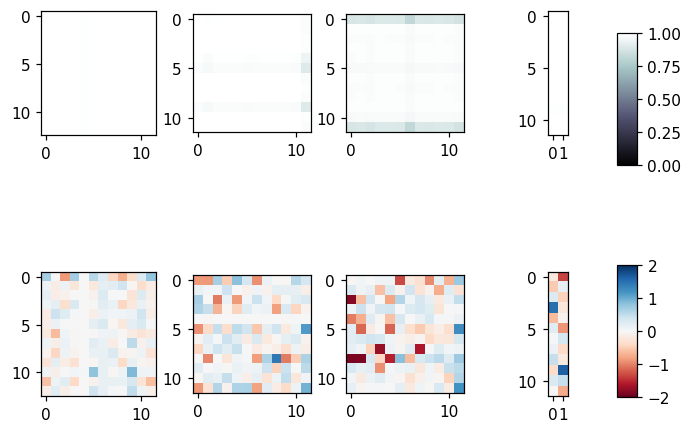

====> Epoch: 670 Average loss: -0.0300
====> Epoch: 671 Average loss: -0.0355
====> Epoch: 672 Average loss: -0.0306
====> Epoch: 673 Average loss: -0.0318
====> Epoch: 674 Average loss: -0.0327
Train Epoch:675, Batch_idx:62, Loss:-0.4988


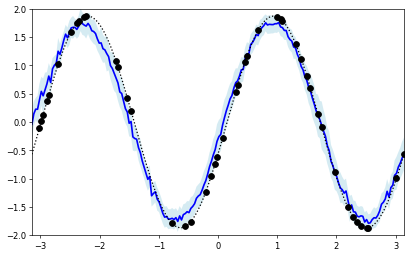

<Figure size 1100x550 with 0 Axes>

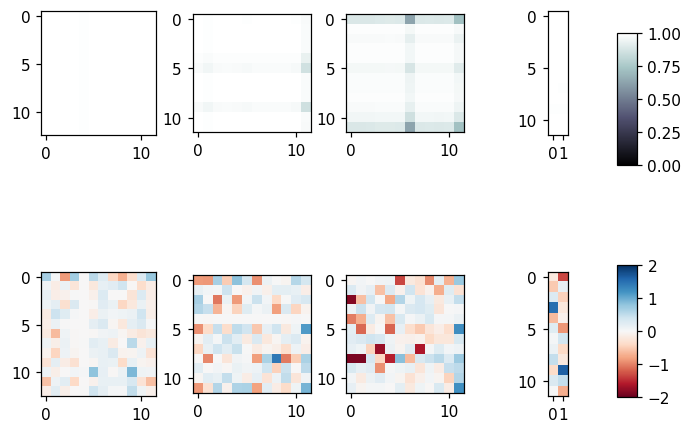

====> Epoch: 675 Average loss: -0.0197
====> Epoch: 676 Average loss: -0.0234
====> Epoch: 677 Average loss: -0.0176
====> Epoch: 678 Average loss: -0.0317
====> Epoch: 679 Average loss: -0.0357
Train Epoch:680, Batch_idx:62, Loss:-0.5010


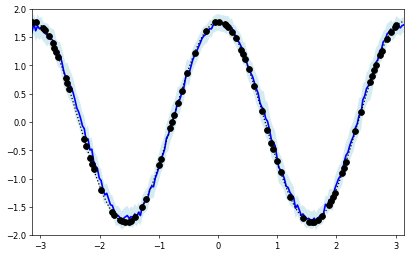

<Figure size 1100x550 with 0 Axes>

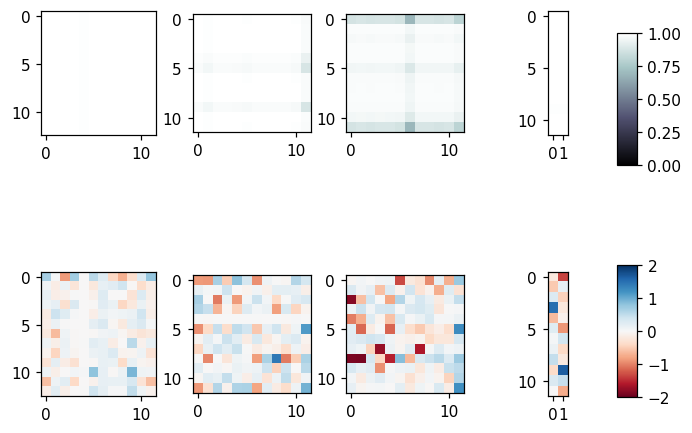

====> Epoch: 680 Average loss: -0.0281
====> Epoch: 681 Average loss: -0.0306
====> Epoch: 682 Average loss: -0.0270
====> Epoch: 683 Average loss: -0.0273
====> Epoch: 684 Average loss: -0.0312
Train Epoch:685, Batch_idx:62, Loss:-0.7640


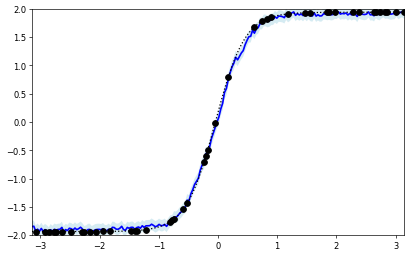

<Figure size 1100x550 with 0 Axes>

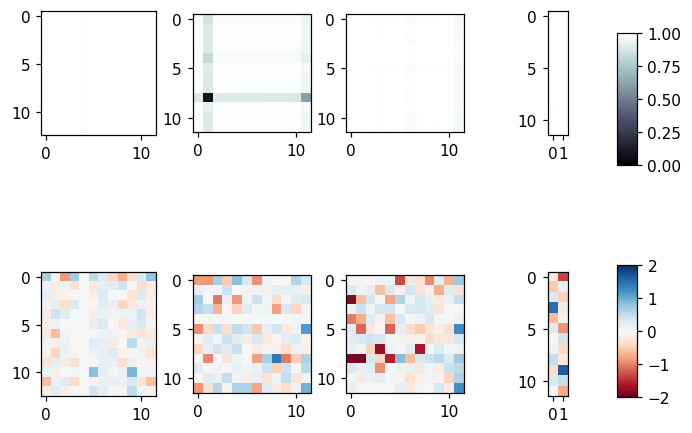

====> Epoch: 685 Average loss: -0.0287
====> Epoch: 686 Average loss: -0.0340
====> Epoch: 687 Average loss: -0.0318
====> Epoch: 688 Average loss: -0.0372
====> Epoch: 689 Average loss: -0.0370
Train Epoch:690, Batch_idx:62, Loss:-0.6496


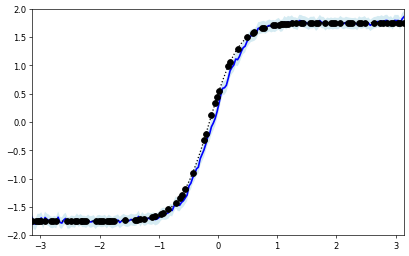

<Figure size 1100x550 with 0 Axes>

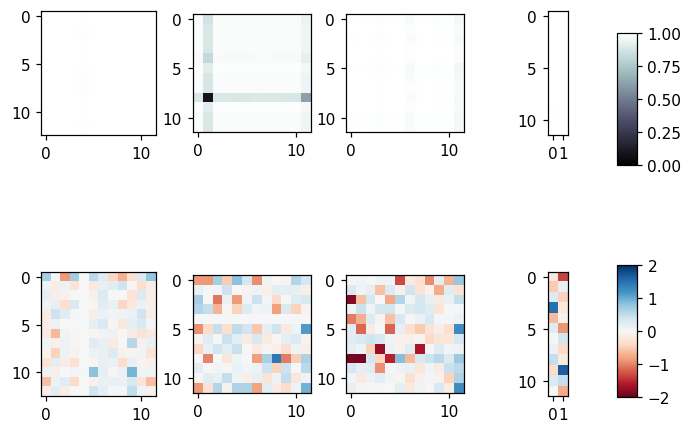

====> Epoch: 690 Average loss: -0.0253
====> Epoch: 691 Average loss: -0.0352
====> Epoch: 692 Average loss: -0.0232
====> Epoch: 693 Average loss: -0.0330
====> Epoch: 694 Average loss: -0.0371
Train Epoch:695, Batch_idx:62, Loss:0.4133


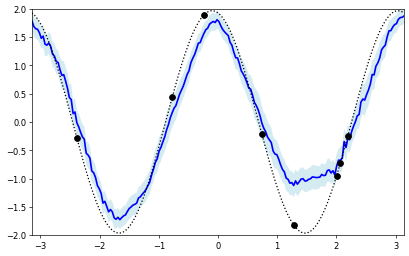

<Figure size 1100x550 with 0 Axes>

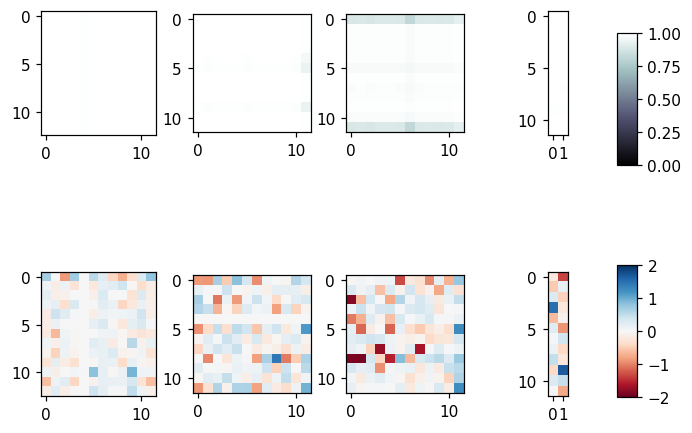

====> Epoch: 695 Average loss: -0.0282
====> Epoch: 696 Average loss: -0.0307
====> Epoch: 697 Average loss: -0.0356
====> Epoch: 698 Average loss: -0.0358
====> Epoch: 699 Average loss: -0.0085
Train Epoch:700, Batch_idx:62, Loss:-0.2401


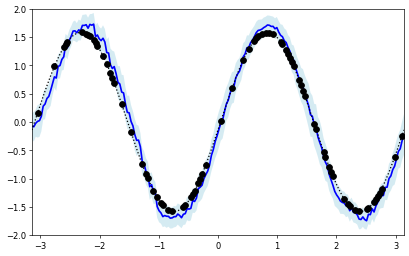

<Figure size 1100x550 with 0 Axes>

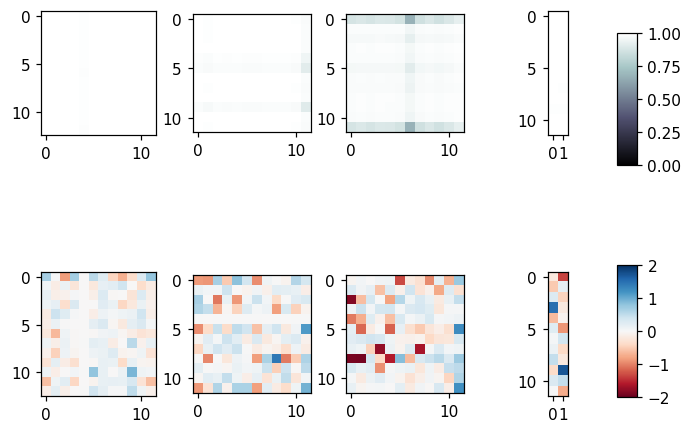

====> Epoch: 700 Average loss: 0.0142
====> Epoch: 701 Average loss: -0.0028
====> Epoch: 702 Average loss: -0.0238
====> Epoch: 703 Average loss: -0.0294
====> Epoch: 704 Average loss: -0.0159
Train Epoch:705, Batch_idx:62, Loss:-0.5829


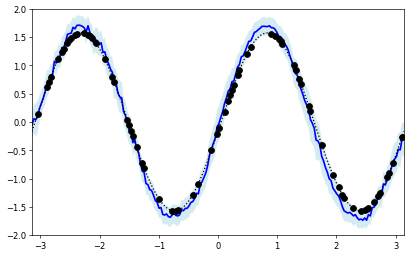

<Figure size 1100x550 with 0 Axes>

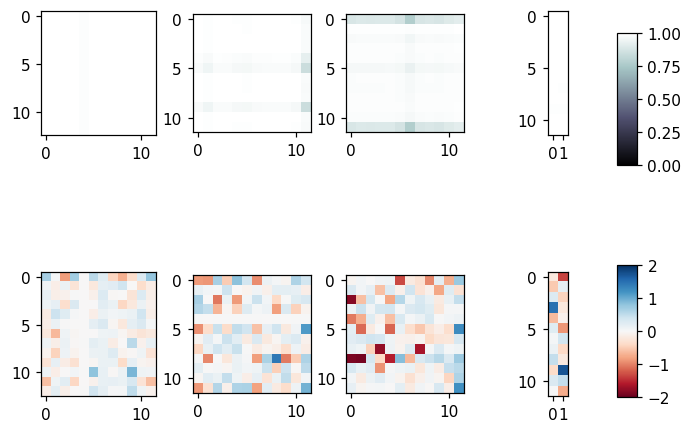

====> Epoch: 705 Average loss: -0.0217
====> Epoch: 706 Average loss: -0.0198
====> Epoch: 707 Average loss: -0.0324
====> Epoch: 708 Average loss: -0.0389
====> Epoch: 709 Average loss: -0.0284
Train Epoch:710, Batch_idx:62, Loss:-0.4332


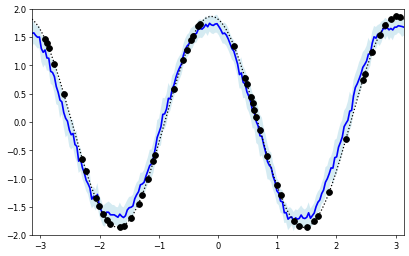

<Figure size 1100x550 with 0 Axes>

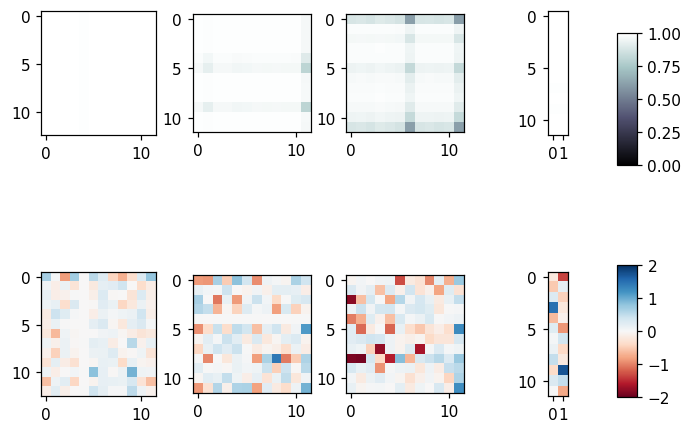

====> Epoch: 710 Average loss: -0.0218
====> Epoch: 711 Average loss: -0.0310
====> Epoch: 712 Average loss: -0.0391
====> Epoch: 713 Average loss: -0.0238
====> Epoch: 714 Average loss: -0.0286
Train Epoch:715, Batch_idx:62, Loss:-0.4415


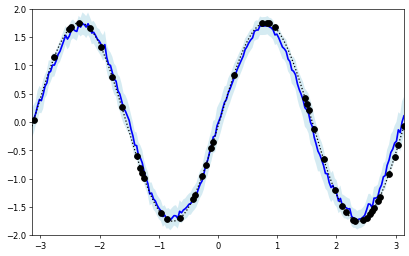

<Figure size 1100x550 with 0 Axes>

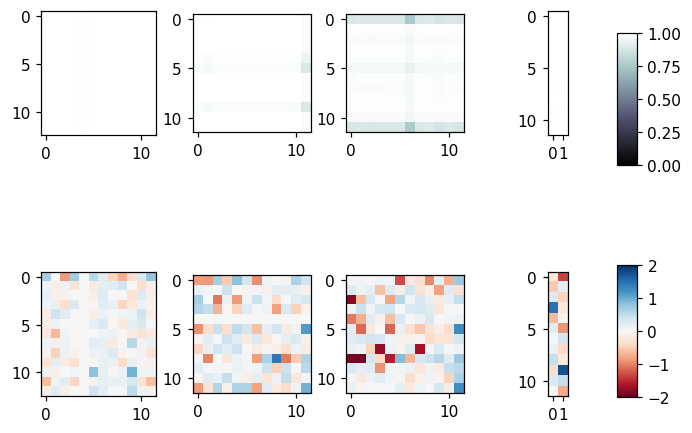

====> Epoch: 715 Average loss: -0.0209
====> Epoch: 716 Average loss: -0.0299
====> Epoch: 717 Average loss: -0.0084
====> Epoch: 718 Average loss: -0.0262
====> Epoch: 719 Average loss: -0.0246
Train Epoch:720, Batch_idx:62, Loss:-0.5470


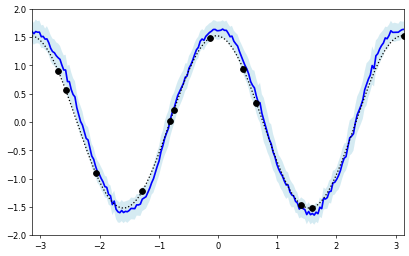

<Figure size 1100x550 with 0 Axes>

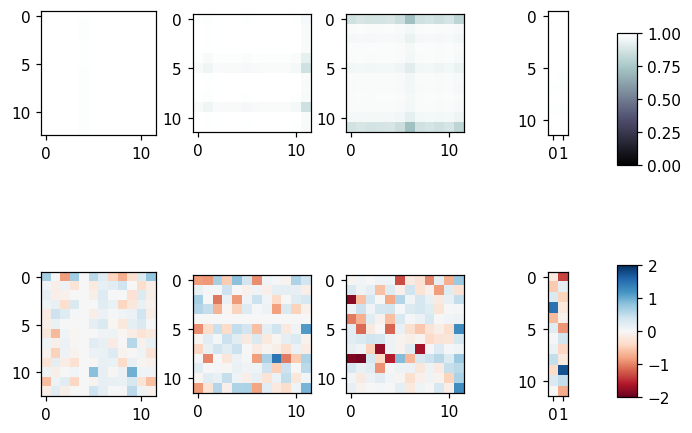

====> Epoch: 720 Average loss: -0.0306
====> Epoch: 721 Average loss: -0.0363
====> Epoch: 722 Average loss: -0.0339
====> Epoch: 723 Average loss: -0.0315
====> Epoch: 724 Average loss: -0.0288
Train Epoch:725, Batch_idx:62, Loss:-0.4077


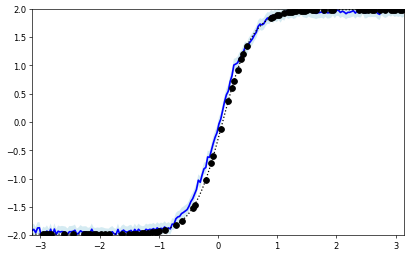

<Figure size 1100x550 with 0 Axes>

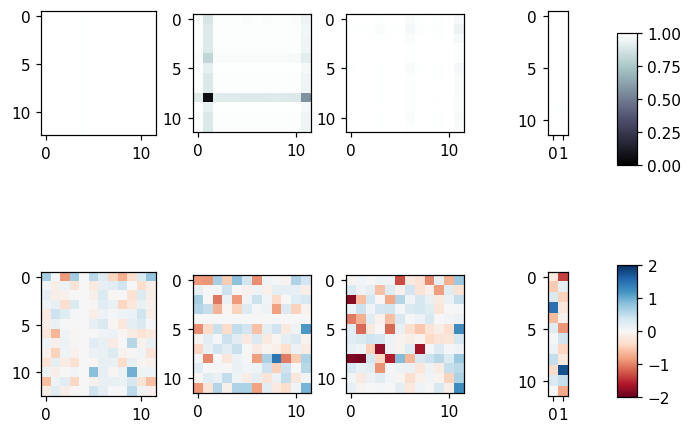

====> Epoch: 725 Average loss: -0.0342
====> Epoch: 726 Average loss: -0.0353
====> Epoch: 727 Average loss: -0.0280
====> Epoch: 728 Average loss: -0.0251
====> Epoch: 729 Average loss: -0.0286
Train Epoch:730, Batch_idx:62, Loss:-0.7278


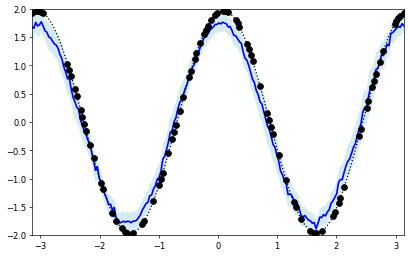

<Figure size 1100x550 with 0 Axes>

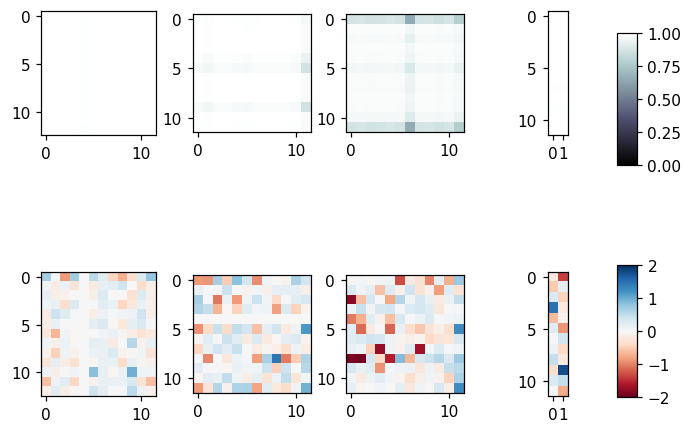

====> Epoch: 730 Average loss: -0.0275
====> Epoch: 731 Average loss: -0.0333
====> Epoch: 732 Average loss: -0.0347
====> Epoch: 733 Average loss: -0.0354
====> Epoch: 734 Average loss: -0.0262
Train Epoch:735, Batch_idx:62, Loss:-0.4920


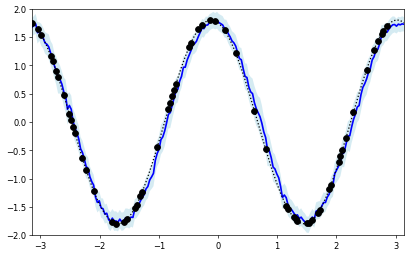

<Figure size 1100x550 with 0 Axes>

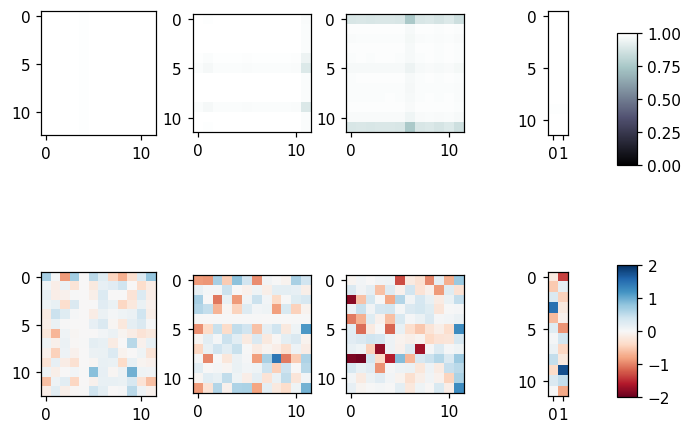

====> Epoch: 735 Average loss: -0.0347
====> Epoch: 736 Average loss: -0.0404
====> Epoch: 737 Average loss: -0.0397
====> Epoch: 738 Average loss: -0.0366
====> Epoch: 739 Average loss: -0.0140
Train Epoch:740, Batch_idx:62, Loss:-0.7847


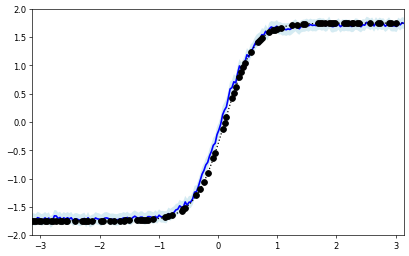

<Figure size 1100x550 with 0 Axes>

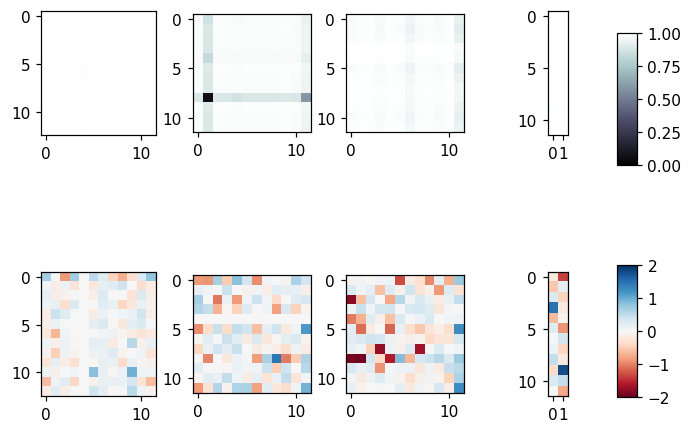

====> Epoch: 740 Average loss: -0.0281
====> Epoch: 741 Average loss: -0.0296
====> Epoch: 742 Average loss: -0.0344
====> Epoch: 743 Average loss: 0.0319
====> Epoch: 744 Average loss: -0.0279
Train Epoch:745, Batch_idx:62, Loss:-0.7864


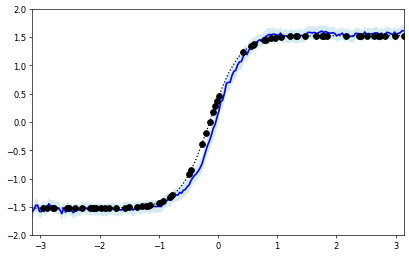

<Figure size 1100x550 with 0 Axes>

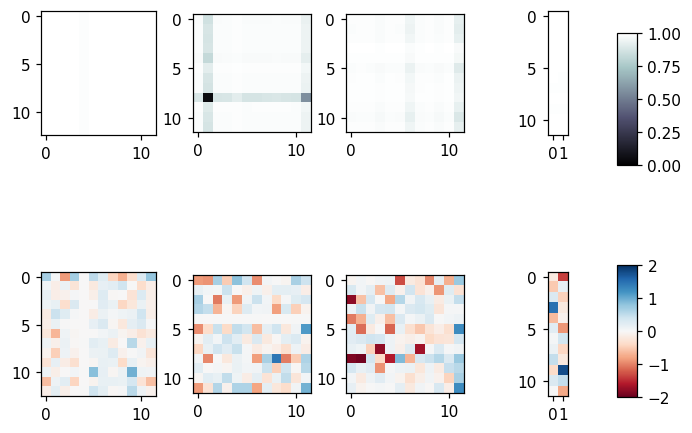

====> Epoch: 745 Average loss: -0.0350
====> Epoch: 746 Average loss: -0.0364
====> Epoch: 747 Average loss: -0.0288
====> Epoch: 748 Average loss: -0.0361
====> Epoch: 749 Average loss: -0.0354
Train Epoch:750, Batch_idx:62, Loss:-0.3684


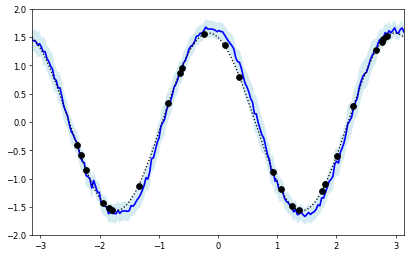

<Figure size 1100x550 with 0 Axes>

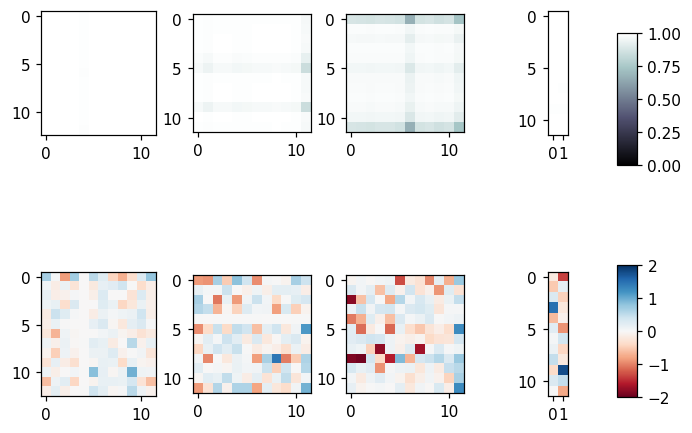

====> Epoch: 750 Average loss: -0.0322
====> Epoch: 751 Average loss: -0.0288
====> Epoch: 752 Average loss: -0.0344
====> Epoch: 753 Average loss: -0.0328
====> Epoch: 754 Average loss: -0.0321
Train Epoch:755, Batch_idx:62, Loss:-0.3871


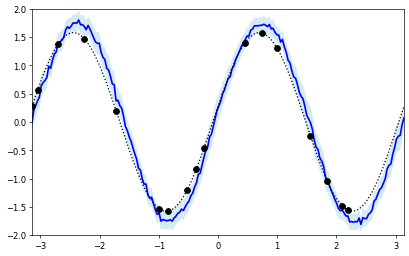

<Figure size 1100x550 with 0 Axes>

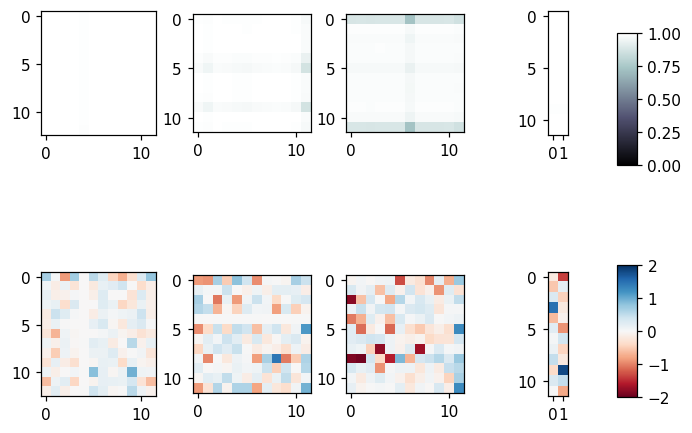

====> Epoch: 755 Average loss: -0.0295
====> Epoch: 756 Average loss: -0.0343
====> Epoch: 757 Average loss: -0.0347
====> Epoch: 758 Average loss: -0.0333
====> Epoch: 759 Average loss: -0.0322
Train Epoch:760, Batch_idx:62, Loss:-0.6176


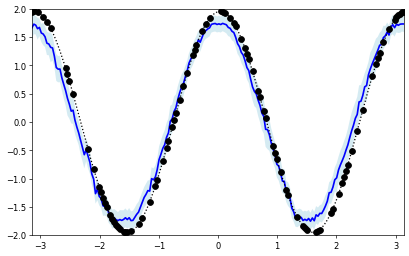

<Figure size 1100x550 with 0 Axes>

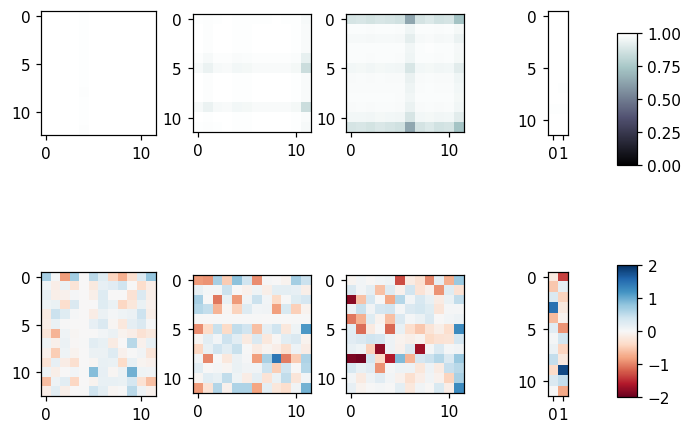

====> Epoch: 760 Average loss: -0.0302
====> Epoch: 761 Average loss: -0.0356
====> Epoch: 762 Average loss: -0.0347
====> Epoch: 763 Average loss: -0.0250
====> Epoch: 764 Average loss: -0.0352
Train Epoch:765, Batch_idx:62, Loss:-0.4326


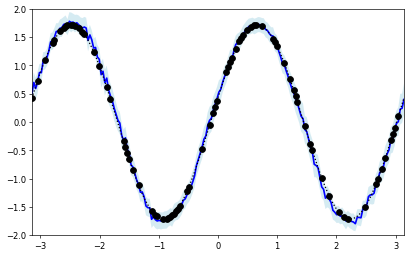

<Figure size 1100x550 with 0 Axes>

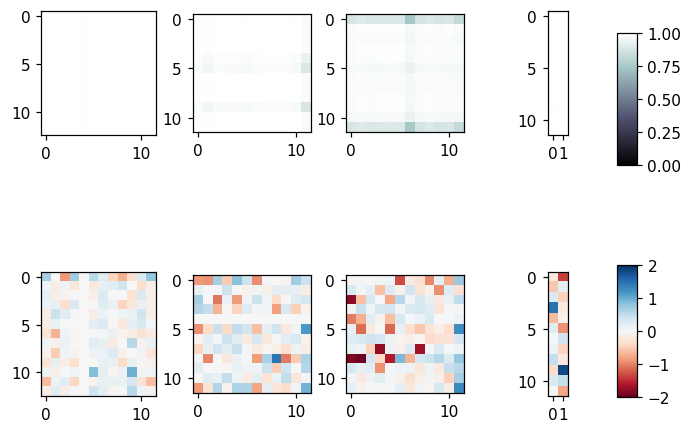

====> Epoch: 765 Average loss: -0.0340
====> Epoch: 766 Average loss: -0.0273
====> Epoch: 767 Average loss: -0.0392
====> Epoch: 768 Average loss: -0.0269
====> Epoch: 769 Average loss: -0.0360
Train Epoch:770, Batch_idx:62, Loss:-0.5777


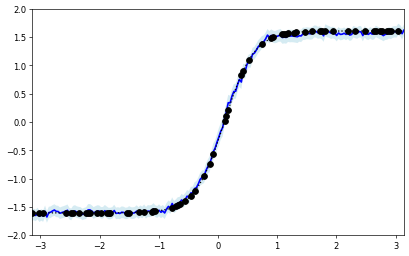

<Figure size 1100x550 with 0 Axes>

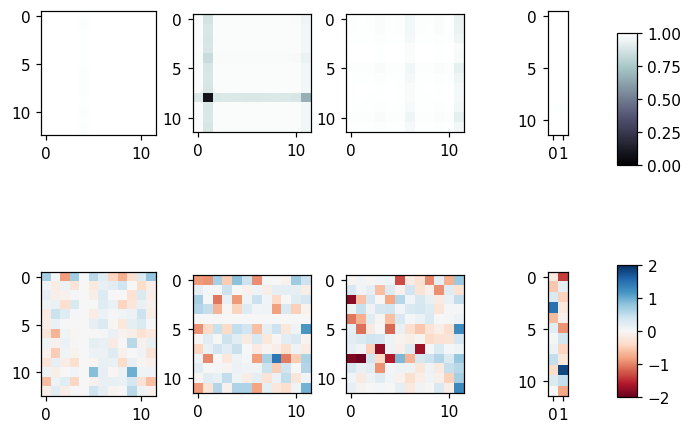

====> Epoch: 770 Average loss: -0.0379
====> Epoch: 771 Average loss: -0.0336
====> Epoch: 772 Average loss: -0.0385
====> Epoch: 773 Average loss: -0.0376
====> Epoch: 774 Average loss: -0.0325
Train Epoch:775, Batch_idx:62, Loss:-0.7826


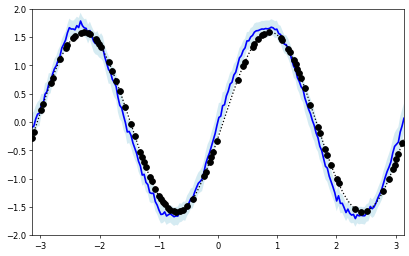

<Figure size 1100x550 with 0 Axes>

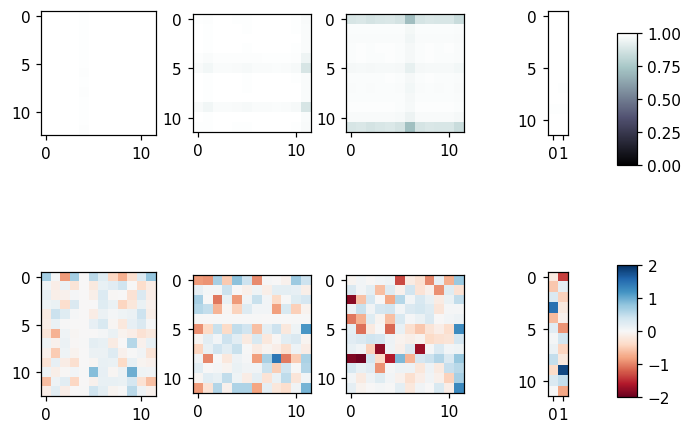

====> Epoch: 775 Average loss: -0.0326
====> Epoch: 776 Average loss: -0.0323
====> Epoch: 777 Average loss: -0.0378
====> Epoch: 778 Average loss: -0.0360
====> Epoch: 779 Average loss: -0.0300
Train Epoch:780, Batch_idx:62, Loss:-0.2989


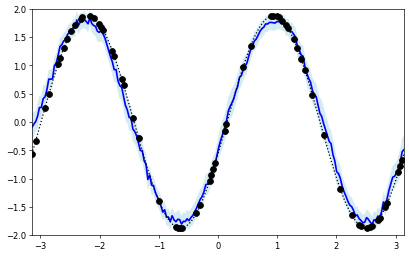

<Figure size 1100x550 with 0 Axes>

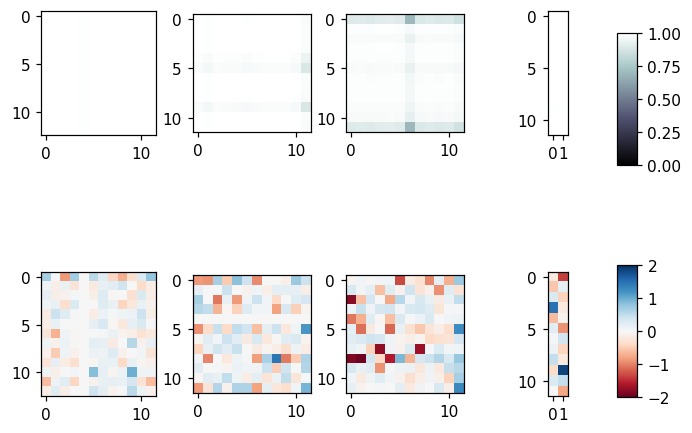

====> Epoch: 780 Average loss: -0.0279
====> Epoch: 781 Average loss: -0.0391
====> Epoch: 782 Average loss: -0.0326
====> Epoch: 783 Average loss: -0.0332
====> Epoch: 784 Average loss: -0.0328
Train Epoch:785, Batch_idx:62, Loss:-0.8448


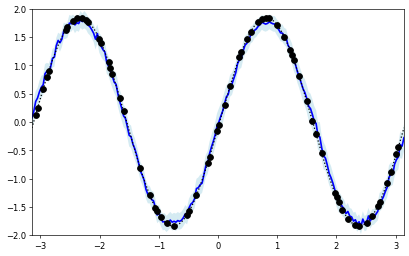

<Figure size 1100x550 with 0 Axes>

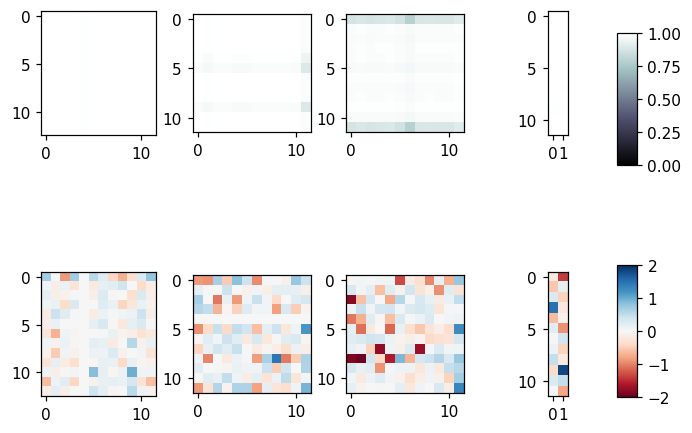

====> Epoch: 785 Average loss: -0.0359
====> Epoch: 786 Average loss: -0.0349
====> Epoch: 787 Average loss: -0.0337
====> Epoch: 788 Average loss: -0.0363
====> Epoch: 789 Average loss: -0.0319
Train Epoch:790, Batch_idx:62, Loss:-0.6504


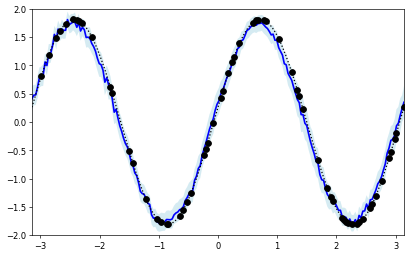

<Figure size 1100x550 with 0 Axes>

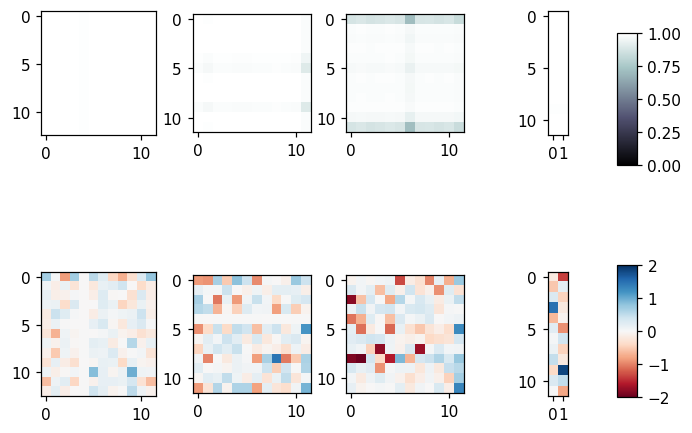

====> Epoch: 790 Average loss: -0.0294
====> Epoch: 791 Average loss: -0.0308
====> Epoch: 792 Average loss: 0.0006
====> Epoch: 793 Average loss: -0.0343
====> Epoch: 794 Average loss: -0.0301
Train Epoch:795, Batch_idx:62, Loss:-0.8325


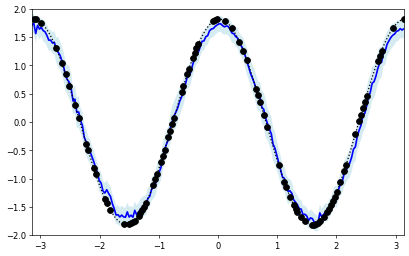

<Figure size 1100x550 with 0 Axes>

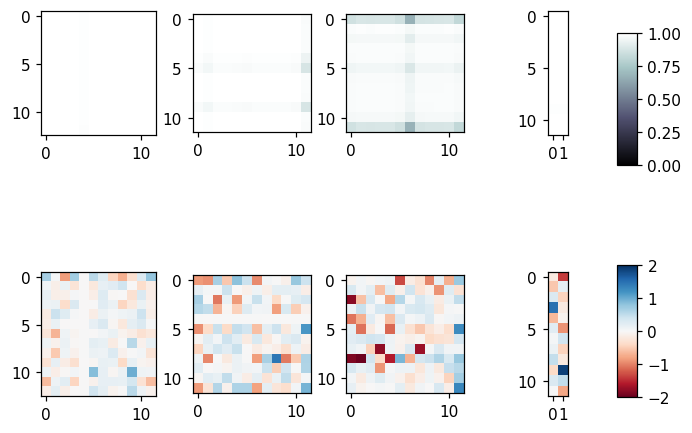

====> Epoch: 795 Average loss: -0.0264
====> Epoch: 796 Average loss: -0.0301
====> Epoch: 797 Average loss: -0.0271
====> Epoch: 798 Average loss: -0.0384
====> Epoch: 799 Average loss: -0.0346
Train Epoch:800, Batch_idx:62, Loss:-0.7735


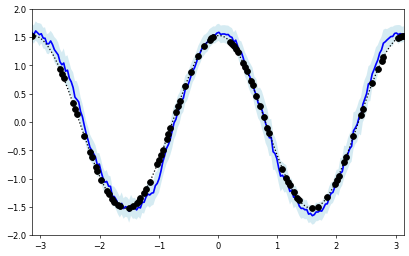

<Figure size 1100x550 with 0 Axes>

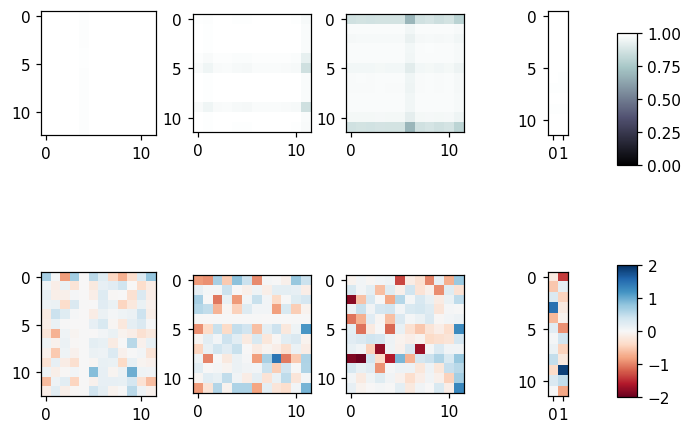

====> Epoch: 800 Average loss: -0.0316
====> Epoch: 801 Average loss: -0.0316
====> Epoch: 802 Average loss: -0.0323
====> Epoch: 803 Average loss: -0.0265
====> Epoch: 804 Average loss: -0.0333
Train Epoch:805, Batch_idx:62, Loss:-0.8575


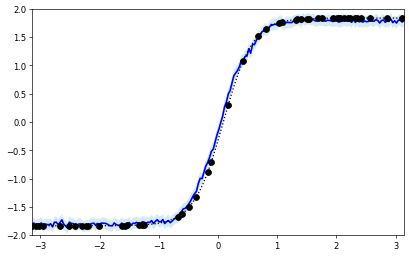

<Figure size 1100x550 with 0 Axes>

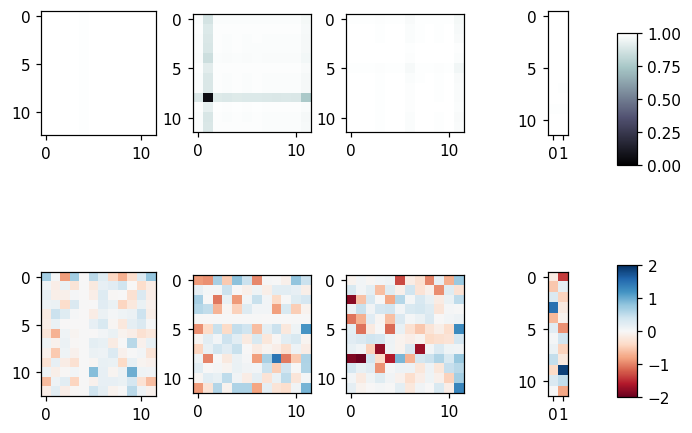

====> Epoch: 805 Average loss: -0.0341
====> Epoch: 806 Average loss: -0.0302
====> Epoch: 807 Average loss: 0.0653
====> Epoch: 808 Average loss: -0.0006
====> Epoch: 809 Average loss: -0.0112
Train Epoch:810, Batch_idx:62, Loss:-0.2881


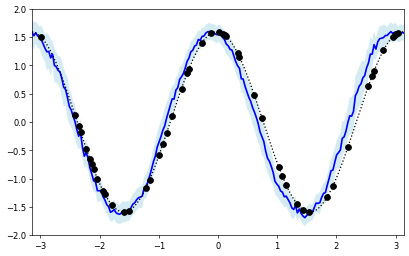

<Figure size 1100x550 with 0 Axes>

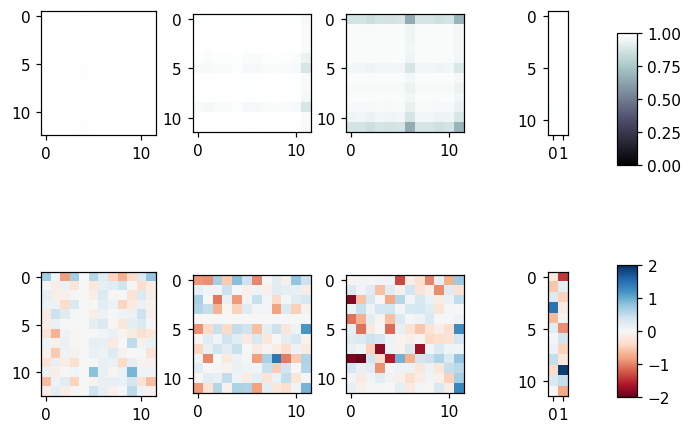

====> Epoch: 810 Average loss: -0.0103
====> Epoch: 811 Average loss: -0.0159
====> Epoch: 812 Average loss: -0.0164
====> Epoch: 813 Average loss: -0.0259
====> Epoch: 814 Average loss: -0.0340
Train Epoch:815, Batch_idx:62, Loss:-0.6305


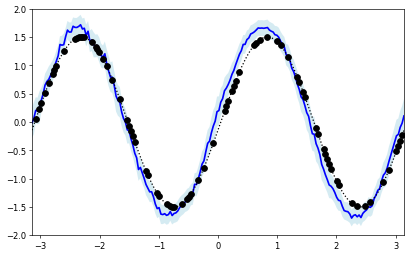

<Figure size 1100x550 with 0 Axes>

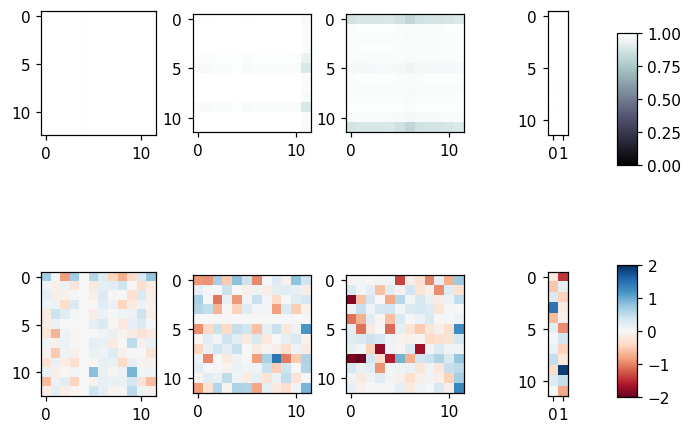

====> Epoch: 815 Average loss: -0.0295
====> Epoch: 816 Average loss: -0.0263
====> Epoch: 817 Average loss: -0.0349
====> Epoch: 818 Average loss: -0.0348
====> Epoch: 819 Average loss: -0.0327
Train Epoch:820, Batch_idx:62, Loss:-0.3509


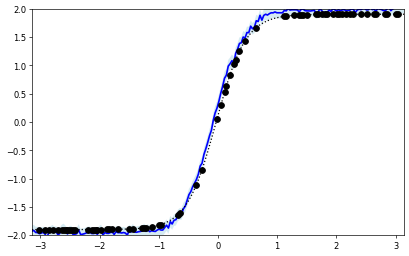

<Figure size 1100x550 with 0 Axes>

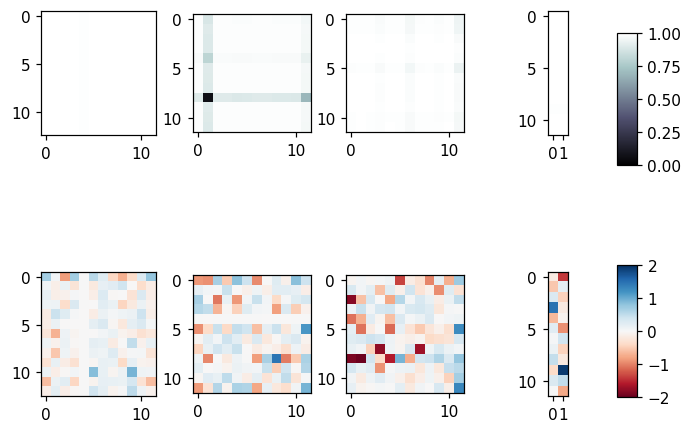

====> Epoch: 820 Average loss: -0.0257
====> Epoch: 821 Average loss: -0.0354
====> Epoch: 822 Average loss: -0.0295
====> Epoch: 823 Average loss: -0.0309
====> Epoch: 824 Average loss: -0.0284
Train Epoch:825, Batch_idx:62, Loss:-0.5177


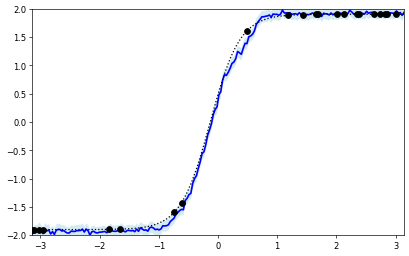

<Figure size 1100x550 with 0 Axes>

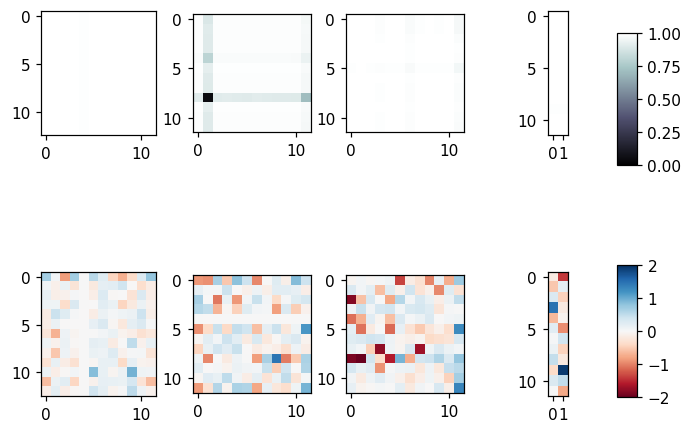

====> Epoch: 825 Average loss: -0.0316
====> Epoch: 826 Average loss: -0.0329
====> Epoch: 827 Average loss: -0.0312
====> Epoch: 828 Average loss: -0.0294
====> Epoch: 829 Average loss: -0.0352
Train Epoch:830, Batch_idx:62, Loss:-0.6180


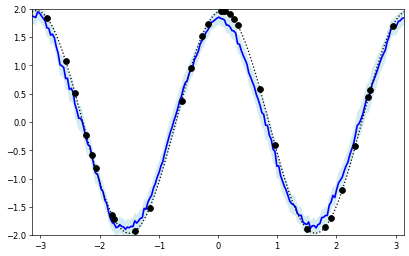

<Figure size 1100x550 with 0 Axes>

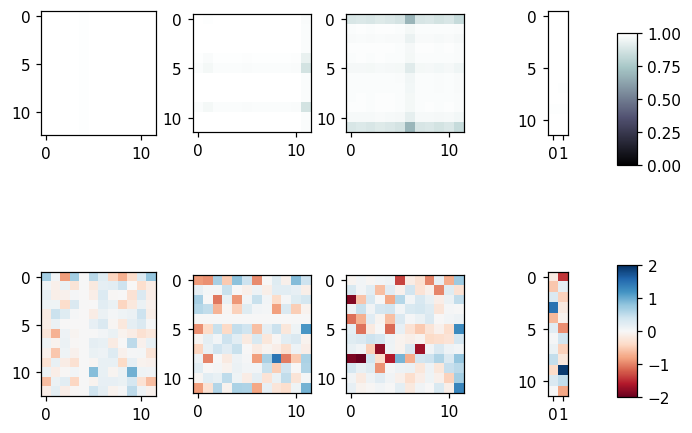

====> Epoch: 830 Average loss: -0.0358
====> Epoch: 831 Average loss: -0.0350
====> Epoch: 832 Average loss: -0.0351
====> Epoch: 833 Average loss: -0.0394
====> Epoch: 834 Average loss: -0.0321
Train Epoch:835, Batch_idx:62, Loss:-0.7994


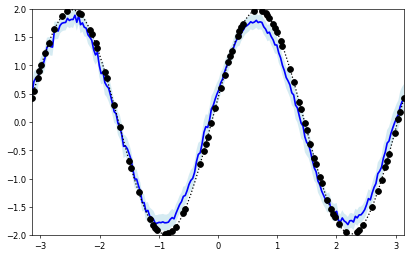

<Figure size 1100x550 with 0 Axes>

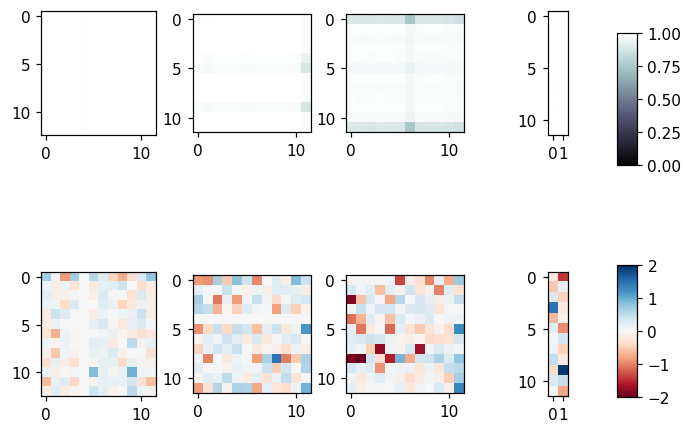

====> Epoch: 835 Average loss: -0.0360
====> Epoch: 836 Average loss: -0.0380
====> Epoch: 837 Average loss: -0.0310
====> Epoch: 838 Average loss: -0.0266
====> Epoch: 839 Average loss: -0.0355
Train Epoch:840, Batch_idx:62, Loss:3.7407


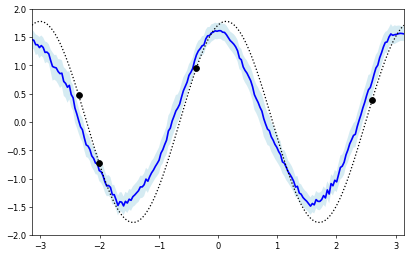

<Figure size 1100x550 with 0 Axes>

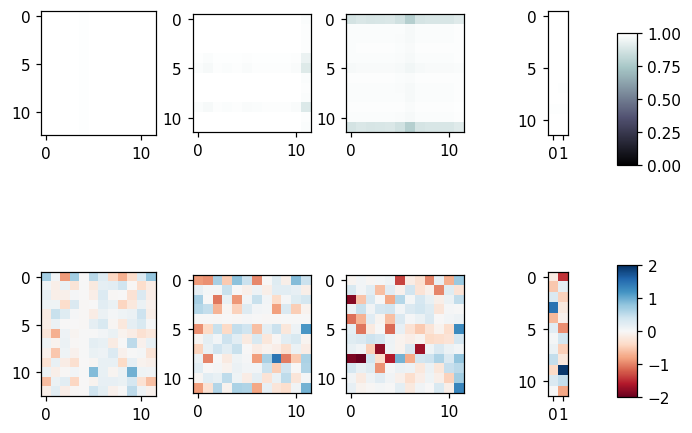

====> Epoch: 840 Average loss: -0.0378
====> Epoch: 841 Average loss: -0.0304
====> Epoch: 842 Average loss: -0.0354
====> Epoch: 843 Average loss: -0.0436
====> Epoch: 844 Average loss: -0.0238
Train Epoch:845, Batch_idx:62, Loss:-0.7756


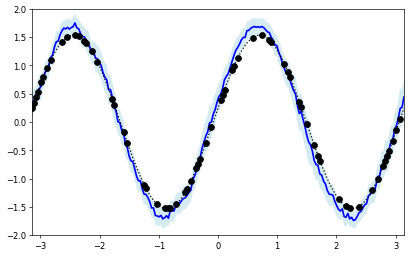

<Figure size 1100x550 with 0 Axes>

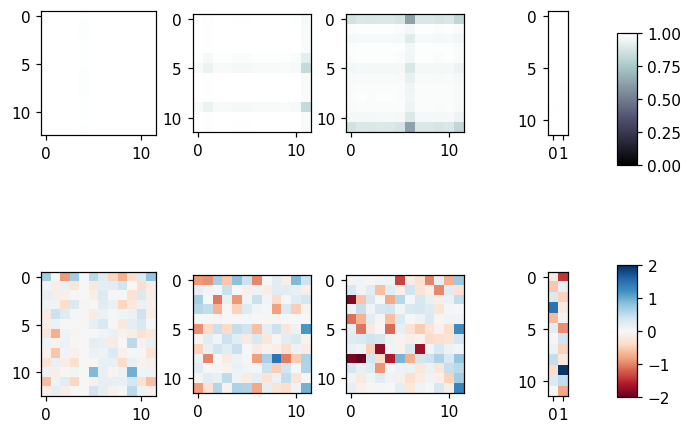

====> Epoch: 845 Average loss: -0.0297
====> Epoch: 846 Average loss: -0.0297
====> Epoch: 847 Average loss: -0.0390
====> Epoch: 848 Average loss: -0.0114
====> Epoch: 849 Average loss: -0.0247
Train Epoch:850, Batch_idx:62, Loss:0.5330


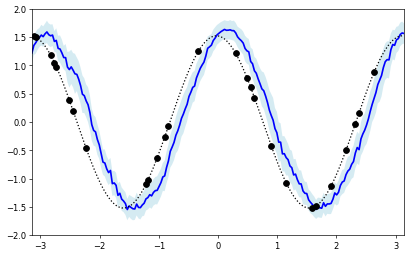

<Figure size 1100x550 with 0 Axes>

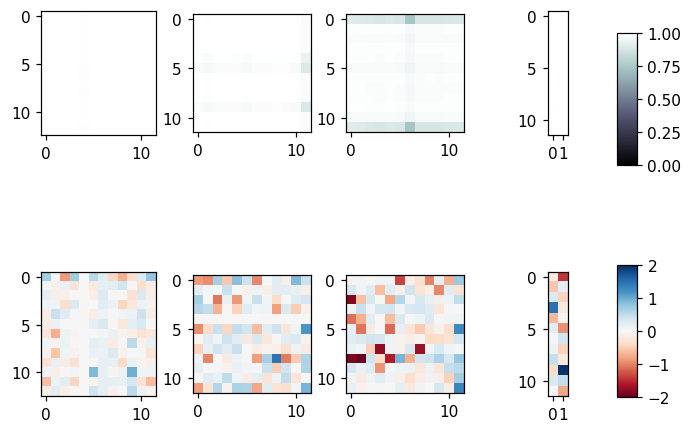

====> Epoch: 850 Average loss: -0.0278
====> Epoch: 851 Average loss: -0.0353
====> Epoch: 852 Average loss: -0.0232
====> Epoch: 853 Average loss: -0.0310
====> Epoch: 854 Average loss: -0.0375
Train Epoch:855, Batch_idx:62, Loss:-0.8159


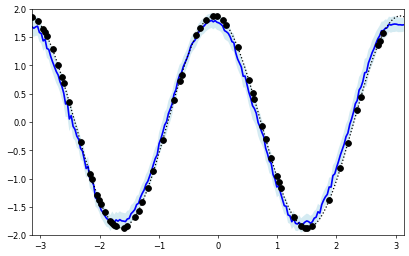

<Figure size 1100x550 with 0 Axes>

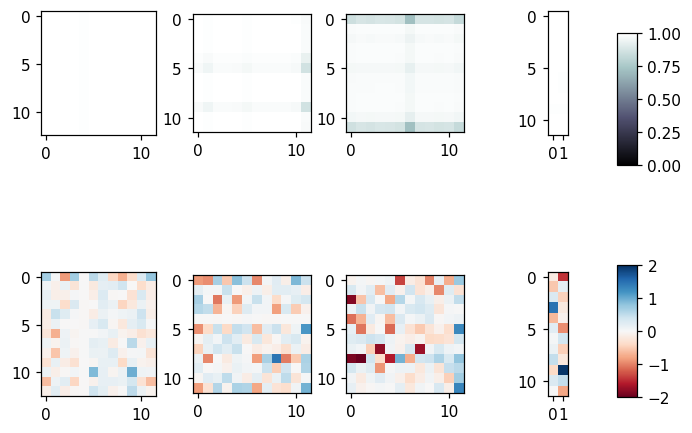

====> Epoch: 855 Average loss: -0.0408
====> Epoch: 856 Average loss: -0.0402
====> Epoch: 857 Average loss: -0.0327
====> Epoch: 858 Average loss: -0.0333
====> Epoch: 859 Average loss: -0.0342
Train Epoch:860, Batch_idx:62, Loss:-0.7662


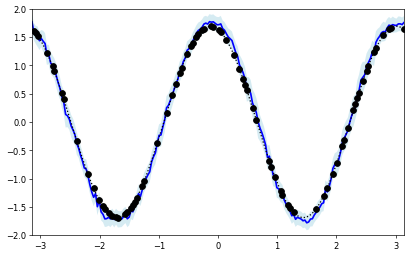

<Figure size 1100x550 with 0 Axes>

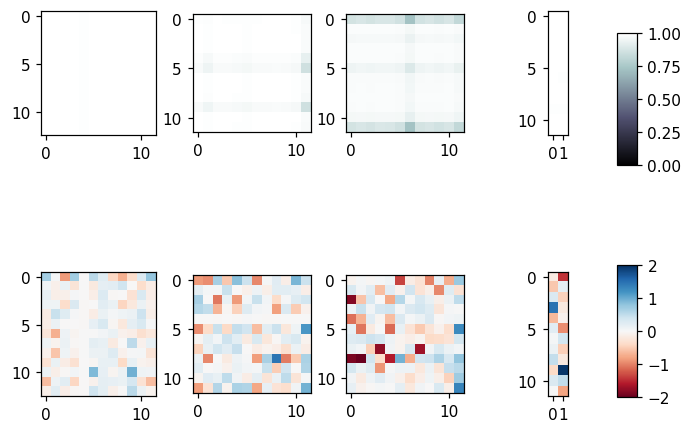

====> Epoch: 860 Average loss: -0.0423
====> Epoch: 861 Average loss: -0.0382
====> Epoch: 862 Average loss: -0.0325
====> Epoch: 863 Average loss: -0.0363
====> Epoch: 864 Average loss: -0.0378
Train Epoch:865, Batch_idx:62, Loss:-0.4231


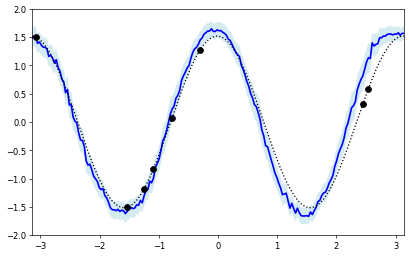

<Figure size 1100x550 with 0 Axes>

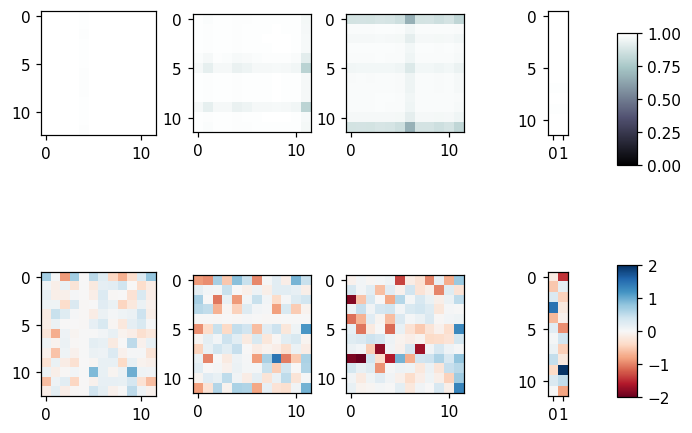

====> Epoch: 865 Average loss: -0.0351
====> Epoch: 866 Average loss: -0.0401
====> Epoch: 867 Average loss: -0.0384
====> Epoch: 868 Average loss: -0.0229
====> Epoch: 869 Average loss: -0.0371
Train Epoch:870, Batch_idx:62, Loss:-0.8882


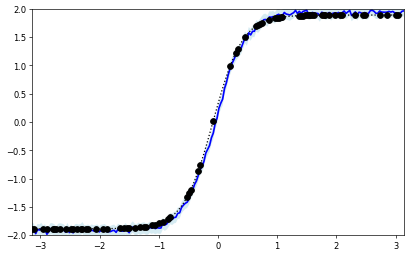

<Figure size 1100x550 with 0 Axes>

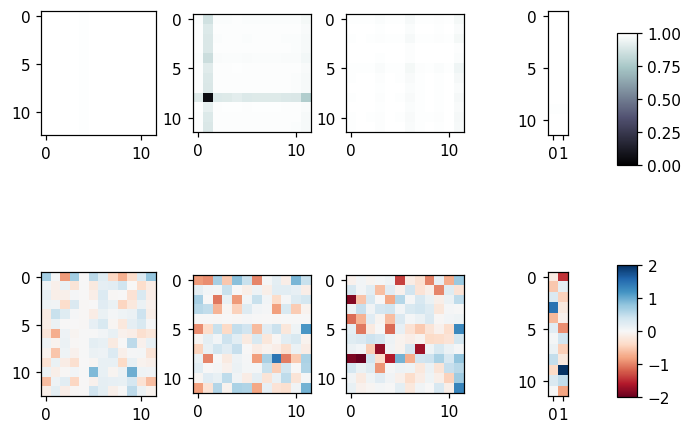

====> Epoch: 870 Average loss: -0.0374
====> Epoch: 871 Average loss: -0.0324
====> Epoch: 872 Average loss: -0.0315
====> Epoch: 873 Average loss: -0.0319
====> Epoch: 874 Average loss: -0.0368
Train Epoch:875, Batch_idx:62, Loss:-0.5449


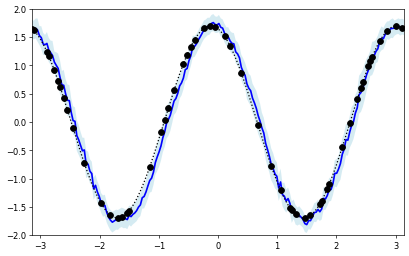

<Figure size 1100x550 with 0 Axes>

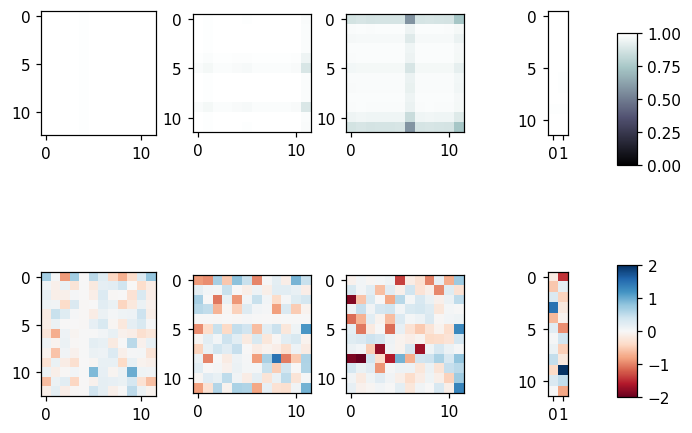

====> Epoch: 875 Average loss: -0.0234
====> Epoch: 876 Average loss: -0.0352
====> Epoch: 877 Average loss: -0.0292
====> Epoch: 878 Average loss: -0.0352
====> Epoch: 879 Average loss: -0.0341
Train Epoch:880, Batch_idx:62, Loss:-0.4632


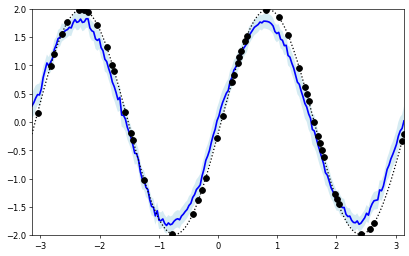

<Figure size 1100x550 with 0 Axes>

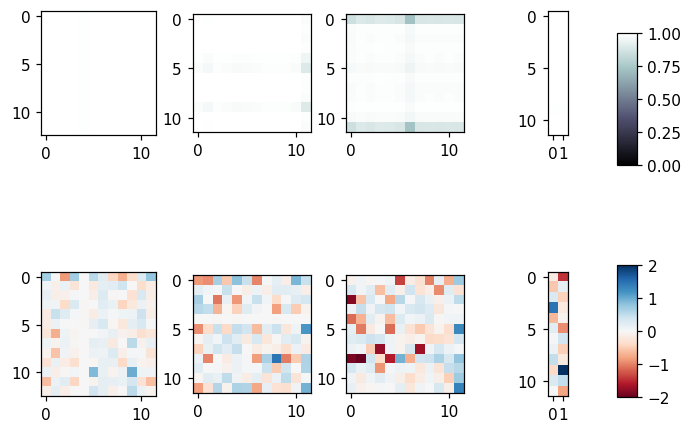

====> Epoch: 880 Average loss: -0.0347
====> Epoch: 881 Average loss: -0.0284
====> Epoch: 882 Average loss: -0.0364
====> Epoch: 883 Average loss: -0.0373
====> Epoch: 884 Average loss: 0.0079
Train Epoch:885, Batch_idx:62, Loss:-0.5283


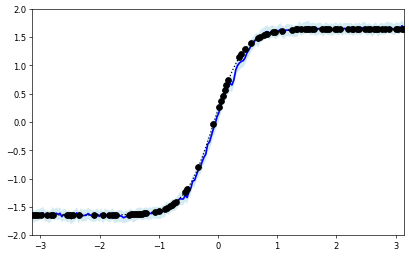

<Figure size 1100x550 with 0 Axes>

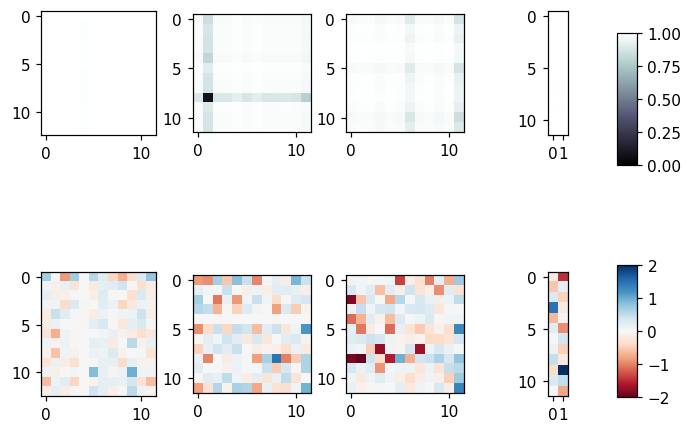

====> Epoch: 885 Average loss: -0.0272
====> Epoch: 886 Average loss: -0.0288
====> Epoch: 887 Average loss: -0.0347
====> Epoch: 888 Average loss: -0.0421
====> Epoch: 889 Average loss: -0.0417
Train Epoch:890, Batch_idx:62, Loss:-0.3505


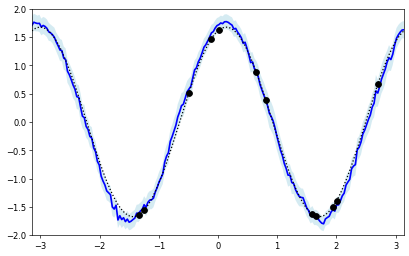

<Figure size 1100x550 with 0 Axes>

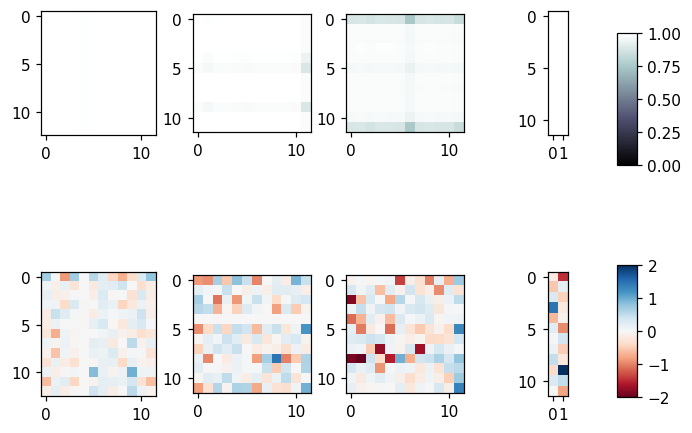

====> Epoch: 890 Average loss: -0.0381
====> Epoch: 891 Average loss: -0.0290
====> Epoch: 892 Average loss: -0.0366
====> Epoch: 893 Average loss: -0.0340
====> Epoch: 894 Average loss: -0.0358
Train Epoch:895, Batch_idx:62, Loss:-0.5268


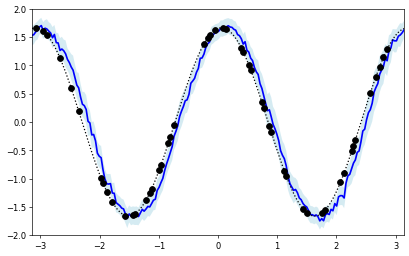

<Figure size 1100x550 with 0 Axes>

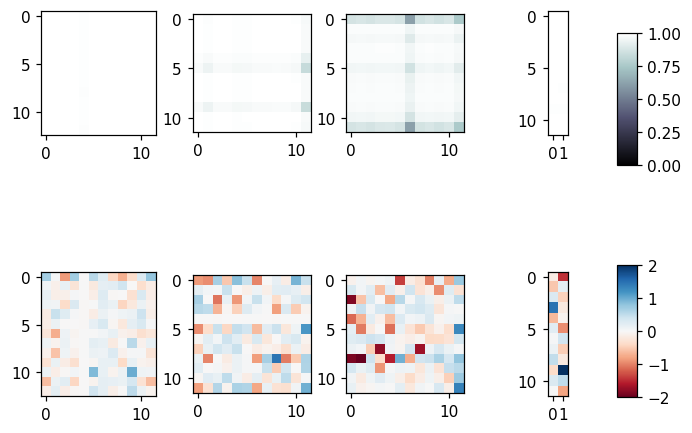

====> Epoch: 895 Average loss: -0.0342
====> Epoch: 896 Average loss: -0.0330
====> Epoch: 897 Average loss: -0.0355
====> Epoch: 898 Average loss: -0.0332
====> Epoch: 899 Average loss: -0.0351
Train Epoch:900, Batch_idx:62, Loss:-0.7860


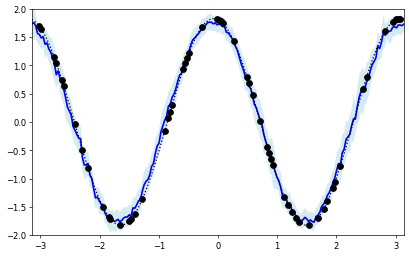

<Figure size 1100x550 with 0 Axes>

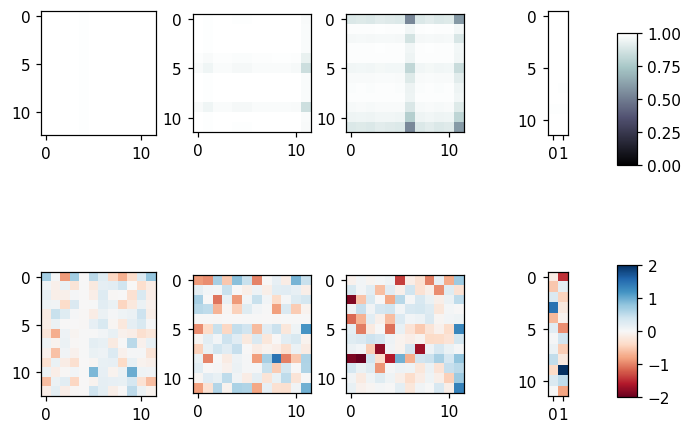

====> Epoch: 900 Average loss: -0.0287
====> Epoch: 901 Average loss: -0.0284
====> Epoch: 902 Average loss: -0.0396
====> Epoch: 903 Average loss: -0.0384
====> Epoch: 904 Average loss: -0.0340
Train Epoch:905, Batch_idx:62, Loss:-0.6980


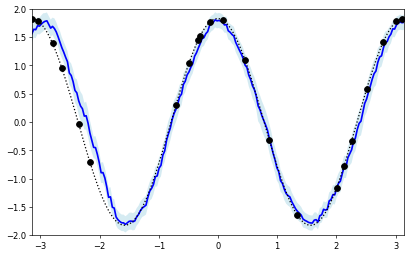

<Figure size 1100x550 with 0 Axes>

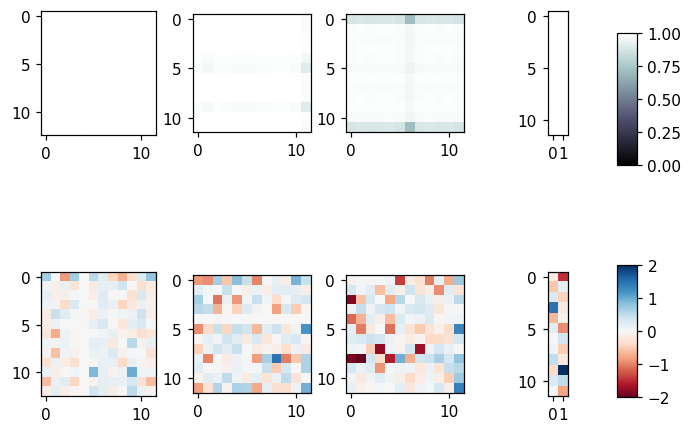

====> Epoch: 905 Average loss: -0.0352
====> Epoch: 906 Average loss: -0.0356
====> Epoch: 907 Average loss: -0.0357
====> Epoch: 908 Average loss: -0.0322
====> Epoch: 909 Average loss: -0.0377
Train Epoch:910, Batch_idx:62, Loss:-0.6480


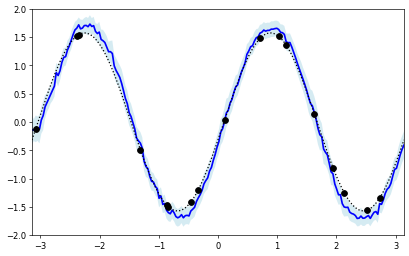

<Figure size 1100x550 with 0 Axes>

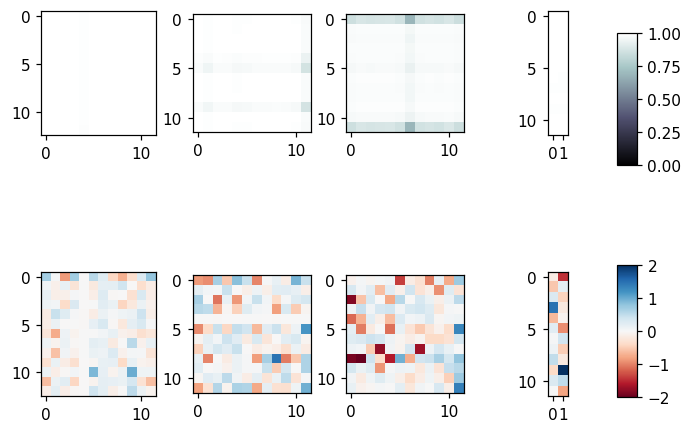

====> Epoch: 910 Average loss: -0.0364
====> Epoch: 911 Average loss: -0.0415
====> Epoch: 912 Average loss: -0.0376
====> Epoch: 913 Average loss: -0.0343
====> Epoch: 914 Average loss: -0.0340
Train Epoch:915, Batch_idx:62, Loss:-0.0262


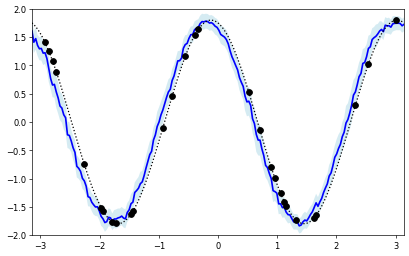

<Figure size 1100x550 with 0 Axes>

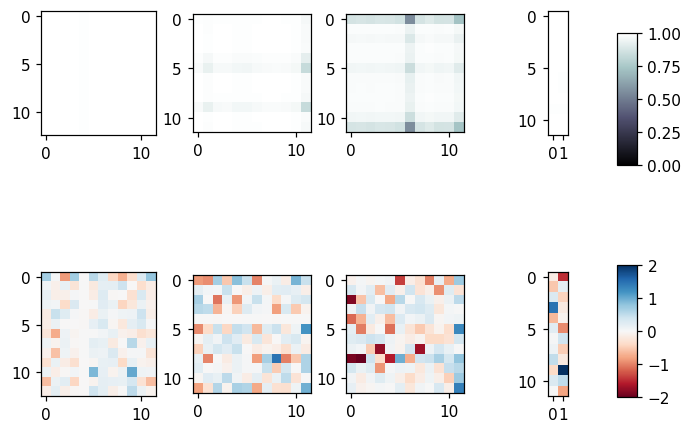

====> Epoch: 915 Average loss: -0.0313
====> Epoch: 916 Average loss: -0.0326
====> Epoch: 917 Average loss: -0.0393
====> Epoch: 918 Average loss: -0.0409
====> Epoch: 919 Average loss: -0.0371
Train Epoch:920, Batch_idx:62, Loss:-0.5642


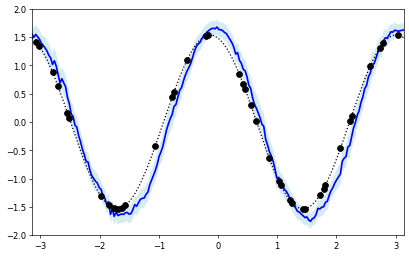

<Figure size 1100x550 with 0 Axes>

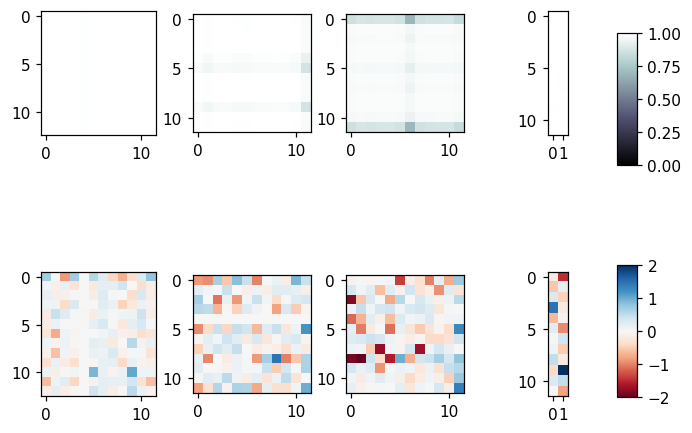

====> Epoch: 920 Average loss: -0.0418
====> Epoch: 921 Average loss: -0.0365
====> Epoch: 922 Average loss: -0.0270
====> Epoch: 923 Average loss: -0.0287
====> Epoch: 924 Average loss: -0.0303
Train Epoch:925, Batch_idx:62, Loss:-0.6001


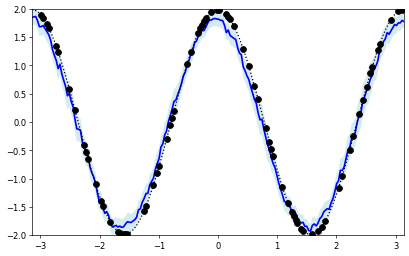

<Figure size 1100x550 with 0 Axes>

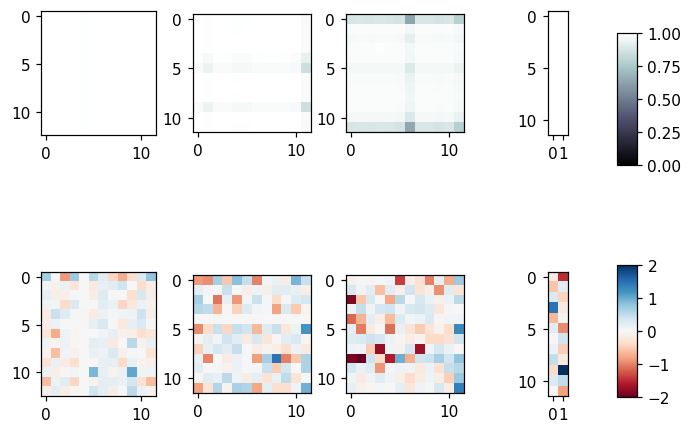

====> Epoch: 925 Average loss: -0.0342
====> Epoch: 926 Average loss: -0.0191
====> Epoch: 927 Average loss: -0.0253
====> Epoch: 928 Average loss: -0.0370
====> Epoch: 929 Average loss: -0.0327
Train Epoch:930, Batch_idx:62, Loss:-0.3283


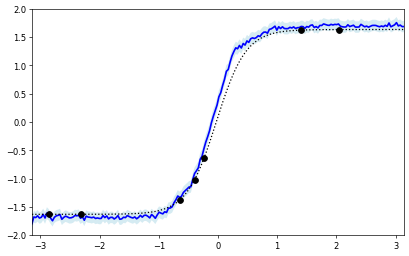

<Figure size 1100x550 with 0 Axes>

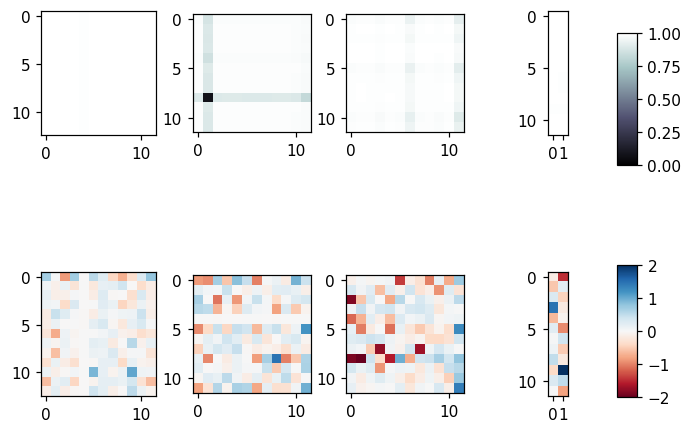

====> Epoch: 930 Average loss: -0.0370
====> Epoch: 931 Average loss: -0.0341
====> Epoch: 932 Average loss: -0.0382
====> Epoch: 933 Average loss: -0.0318
====> Epoch: 934 Average loss: -0.0351
Train Epoch:935, Batch_idx:62, Loss:4.2794


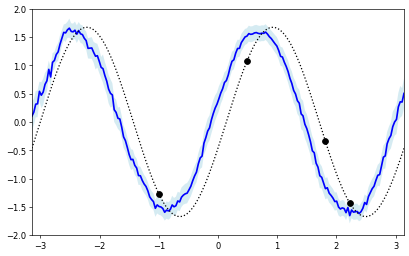

<Figure size 1100x550 with 0 Axes>

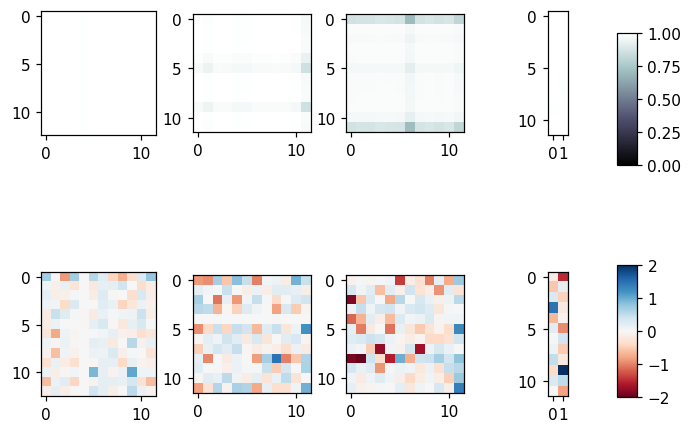

====> Epoch: 935 Average loss: -0.0381
====> Epoch: 936 Average loss: -0.0423
====> Epoch: 937 Average loss: -0.0286
====> Epoch: 938 Average loss: -0.0354
====> Epoch: 939 Average loss: -0.0389
Train Epoch:940, Batch_idx:62, Loss:-0.5664


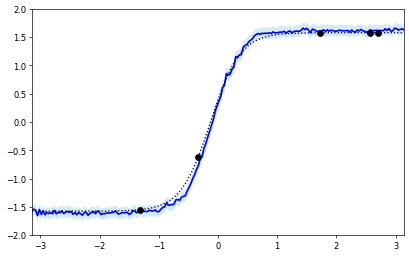

<Figure size 1100x550 with 0 Axes>

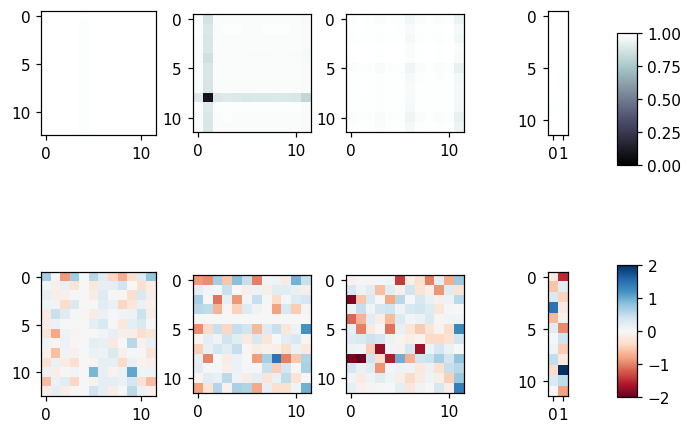

====> Epoch: 940 Average loss: -0.0378
====> Epoch: 941 Average loss: -0.0405
====> Epoch: 942 Average loss: -0.0257
====> Epoch: 943 Average loss: -0.0347
====> Epoch: 944 Average loss: -0.0338
Train Epoch:945, Batch_idx:62, Loss:-0.8291


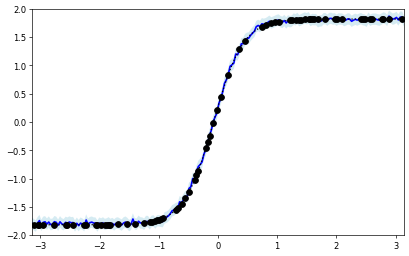

<Figure size 1100x550 with 0 Axes>

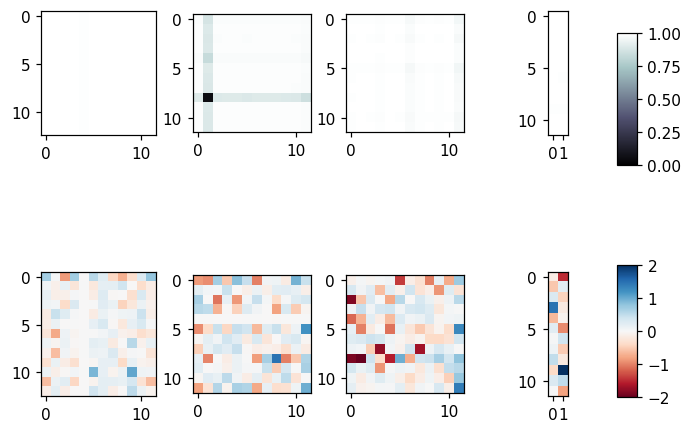

====> Epoch: 945 Average loss: -0.0385
====> Epoch: 946 Average loss: -0.0304
====> Epoch: 947 Average loss: -0.0367
====> Epoch: 948 Average loss: -0.0385
====> Epoch: 949 Average loss: -0.0325
Train Epoch:950, Batch_idx:62, Loss:-0.4818


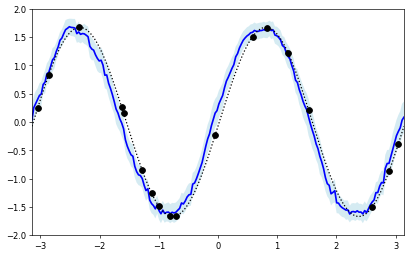

<Figure size 1100x550 with 0 Axes>

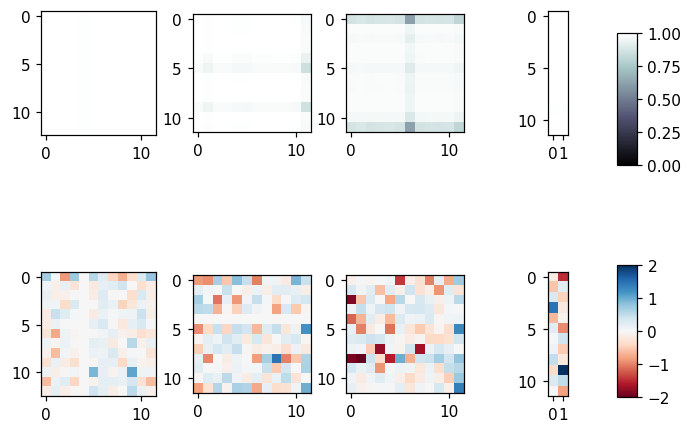

====> Epoch: 950 Average loss: -0.0301
====> Epoch: 951 Average loss: -0.0343
====> Epoch: 952 Average loss: -0.0427
====> Epoch: 953 Average loss: -0.0397
====> Epoch: 954 Average loss: -0.0356
Train Epoch:955, Batch_idx:62, Loss:-0.9477


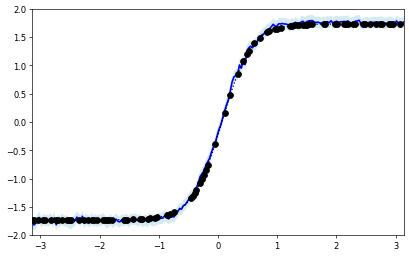

<Figure size 1100x550 with 0 Axes>

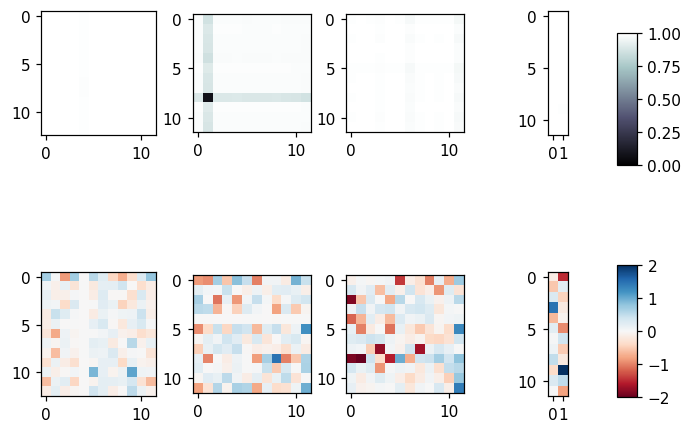

====> Epoch: 955 Average loss: -0.0351
====> Epoch: 956 Average loss: -0.0376
====> Epoch: 957 Average loss: -0.0382
====> Epoch: 958 Average loss: -0.0413
====> Epoch: 959 Average loss: -0.0369
Train Epoch:960, Batch_idx:62, Loss:-0.7834


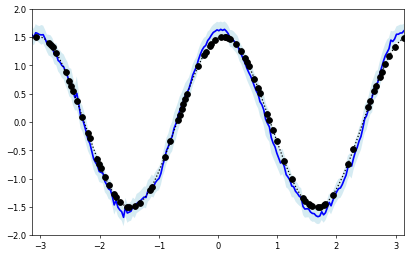

<Figure size 1100x550 with 0 Axes>

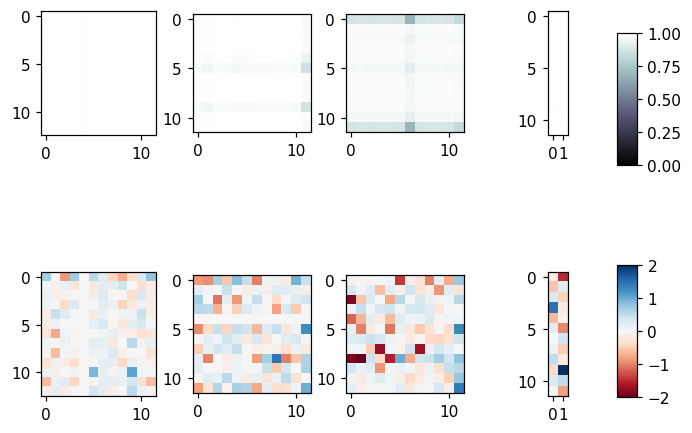

====> Epoch: 960 Average loss: -0.0352
====> Epoch: 961 Average loss: -0.0232
====> Epoch: 962 Average loss: -0.0378
====> Epoch: 963 Average loss: -0.0409
====> Epoch: 964 Average loss: -0.0341
Train Epoch:965, Batch_idx:62, Loss:-0.6335


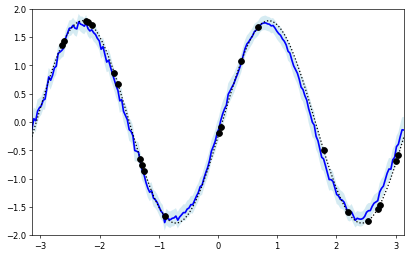

<Figure size 1100x550 with 0 Axes>

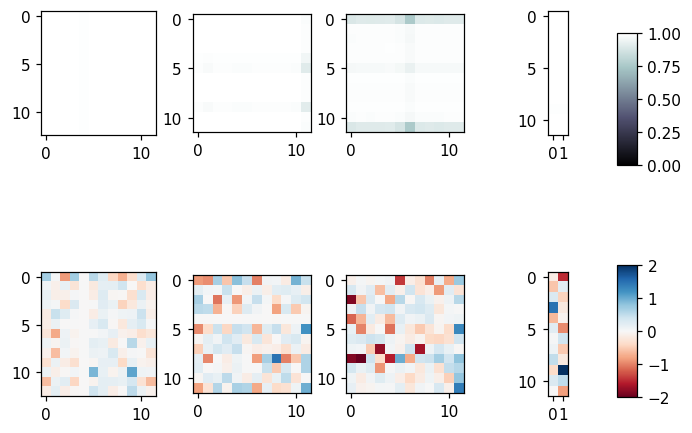

====> Epoch: 965 Average loss: -0.0433
====> Epoch: 966 Average loss: -0.0410
====> Epoch: 967 Average loss: -0.0398
====> Epoch: 968 Average loss: -0.0348
====> Epoch: 969 Average loss: -0.0405
Train Epoch:970, Batch_idx:62, Loss:-0.4913


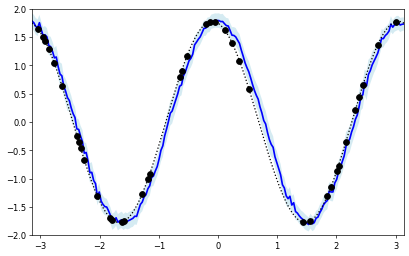

<Figure size 1100x550 with 0 Axes>

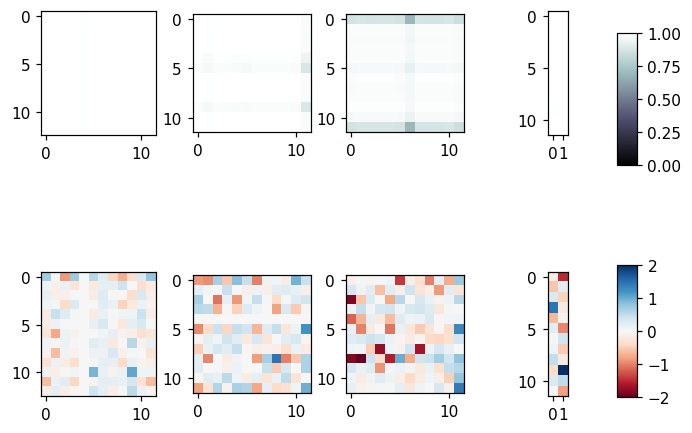

====> Epoch: 970 Average loss: -0.0409
====> Epoch: 971 Average loss: -0.0448
====> Epoch: 972 Average loss: -0.0340
====> Epoch: 973 Average loss: -0.0371
====> Epoch: 974 Average loss: -0.0336
Train Epoch:975, Batch_idx:62, Loss:-0.6980


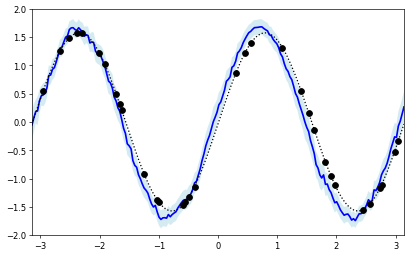

<Figure size 1100x550 with 0 Axes>

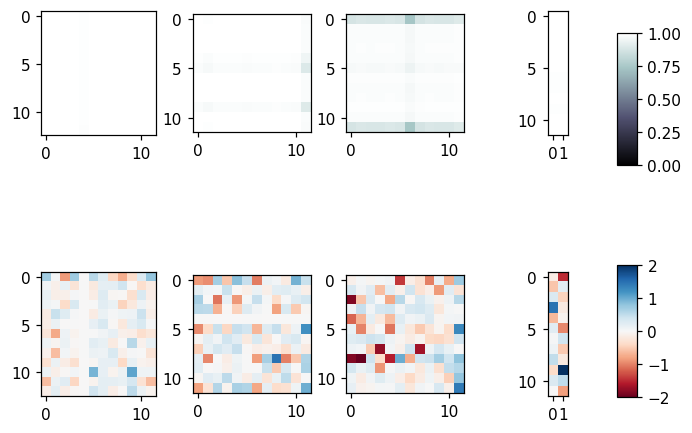

====> Epoch: 975 Average loss: -0.0376
====> Epoch: 976 Average loss: -0.0431
====> Epoch: 977 Average loss: -0.0343
====> Epoch: 978 Average loss: -0.0338
====> Epoch: 979 Average loss: -0.0309
Train Epoch:980, Batch_idx:62, Loss:-0.7218


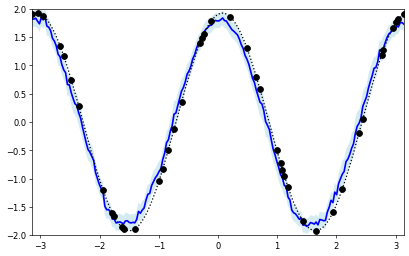

<Figure size 1100x550 with 0 Axes>

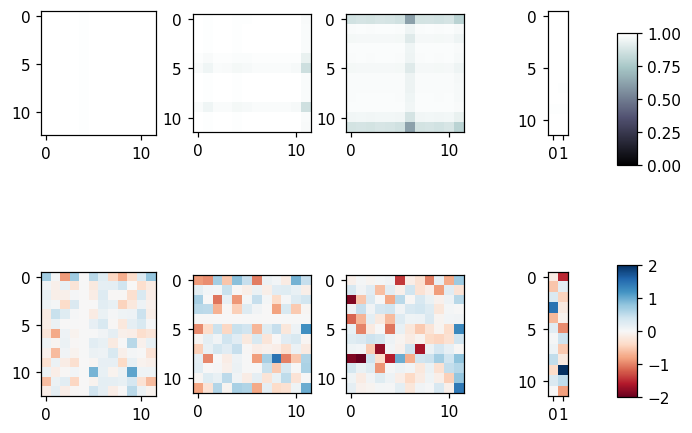

====> Epoch: 980 Average loss: -0.0357
====> Epoch: 981 Average loss: -0.0144
====> Epoch: 982 Average loss: -0.0367
====> Epoch: 983 Average loss: -0.0385
====> Epoch: 984 Average loss: -0.0379
Train Epoch:985, Batch_idx:62, Loss:-0.6562


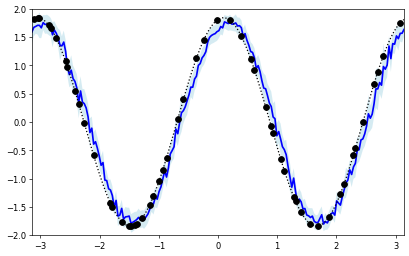

<Figure size 1100x550 with 0 Axes>

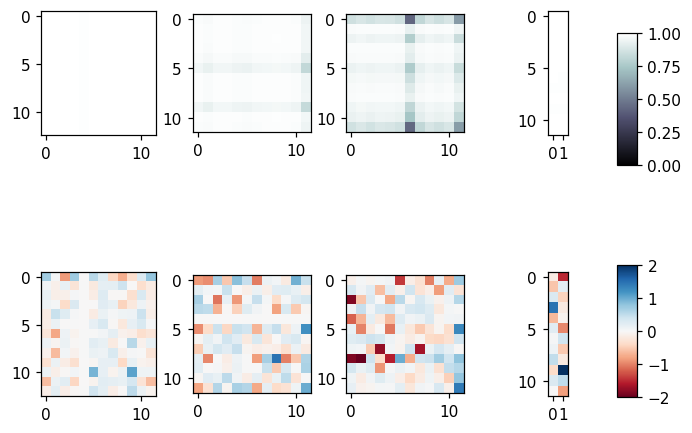

====> Epoch: 985 Average loss: -0.0355
====> Epoch: 986 Average loss: -0.0302
====> Epoch: 987 Average loss: -0.0337
====> Epoch: 988 Average loss: -0.0369
====> Epoch: 989 Average loss: -0.0388
Train Epoch:990, Batch_idx:62, Loss:-0.5207


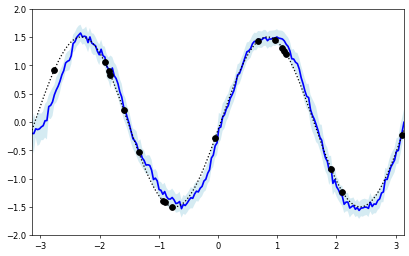

<Figure size 1100x550 with 0 Axes>

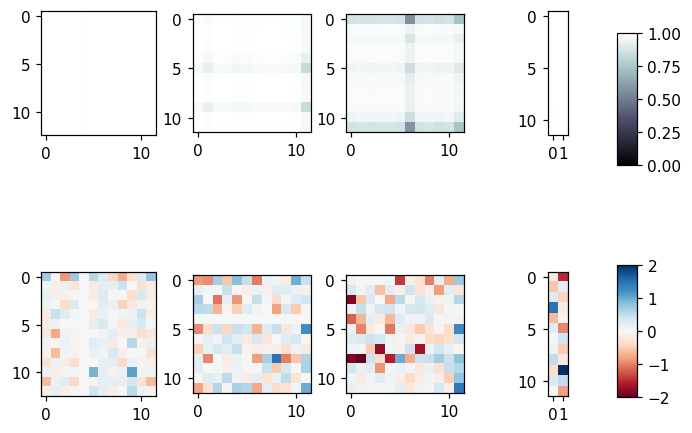

====> Epoch: 990 Average loss: -0.0388
====> Epoch: 991 Average loss: -0.0365
====> Epoch: 992 Average loss: -0.0402
====> Epoch: 993 Average loss: -0.0371
====> Epoch: 994 Average loss: -0.0296
Train Epoch:995, Batch_idx:62, Loss:-0.8283


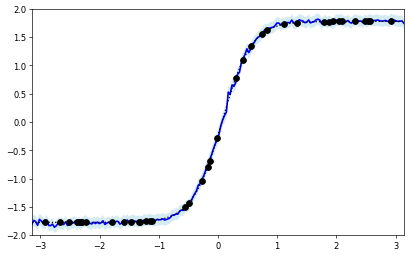

<Figure size 1100x550 with 0 Axes>

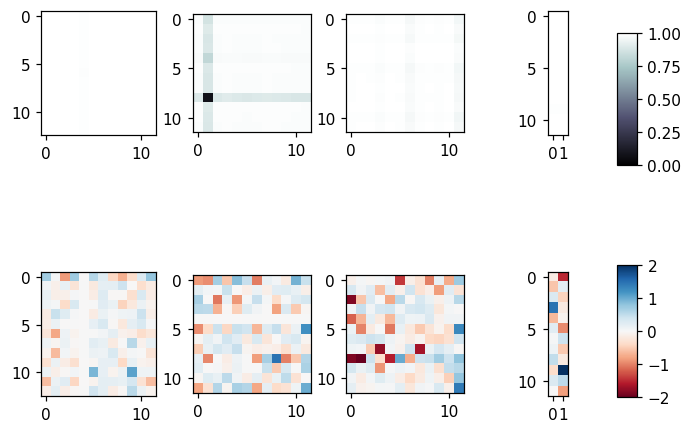

====> Epoch: 995 Average loss: -0.0366
====> Epoch: 996 Average loss: -0.0391
====> Epoch: 997 Average loss: -0.0374
====> Epoch: 998 Average loss: -0.0389
====> Epoch: 999 Average loss: -0.0448
Train Epoch:1000, Batch_idx:62, Loss:-0.8249


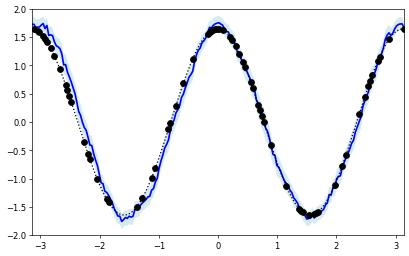

<Figure size 1100x550 with 0 Axes>

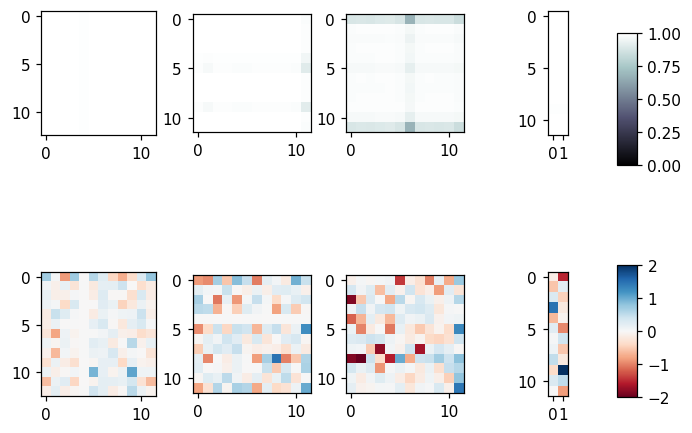

====> Epoch: 1000 Average loss: -0.0463


In [5]:
for epoch in range(1, args.epochs+1): 
    train_loss = 0
    
    for batch_idx, (x, y) in enumerate(data_loader):
        model.train()        
        num_context = randint(4, args.max_num_context) # m ~ (3,97)
        num_total_points = randint(num_context+1, 100) # n ~ [m+1, 100) #99
        num_target = num_total_points - num_context 

        loc = np.random.choice(200, size=num_context+num_target, replace=False)
        x_c = x[:, loc[:num_context], :].cuda()
        y_c = y[:, loc[:num_context], :].cuda()
        x_t = x[:, loc, :].cuda()
        y_t = y[:, loc, :].cuda() 
        
        model.apply(renorm_weights)
        optimizer.zero_grad()
            
        y_pred = model(x_c, y_c, x_t, y_t)        
        y_dist = Normal(y_pred[0], y_pred[1])
        NLL = -y_dist.log_prob(y_t).squeeze().mean()
    
        r_t = model.det_encoder(x_t, y_t, x_t)
        KLD = kl_div2(model, r_t)        
        loss = NLL + KLD / x_t.size(1) #*x_t.size(0)
  
            
        loss.backward()
        optimizer.step()       
        train_loss += loss.item()
        
        
    if epoch % args.log_interval == 0:
        print( f'Train Epoch:{epoch}, Batch_idx:{batch_idx}, Loss:{loss.item():.4f}') #', KLD:{kldrop.item():.4f}')

    if epoch % args.print_interval == 0:
        j = 0
        x_t = x[j, :, :].unsqueeze(0).cuda()
        y_t = y[j, :, :].unsqueeze(0).cuda()

        x_c = x[j, loc[:num_context], :].unsqueeze(0).cuda()
        y_c = y[j, loc[:num_context], :].unsqueeze(0).cuda()

        y_pred = model(x_c, y_c, x_t, y_t)

        context_inds = torch.argsort(x_c[j, :, 0])
        y_c_sorted = y_c[j, context_inds, :].unsqueeze(0)
        x_c_sorted = x_c[j, context_inds, :].unsqueeze(0)

        m_y_sorted = y_pred[0][j, :, :].unsqueeze(0) 
        s_y_sorted = y_pred[1][j, :, :].unsqueeze(0)      

        target_x = x_t.detach().cpu().numpy()
        target_y = y_t.detach().cpu().numpy()

        context_x = x_c_sorted.detach().cpu().numpy()
        context_y = y_c_sorted.detach().cpu().numpy()
        mu_p = m_y_sorted.detach().cpu().numpy()
        std_p = s_y_sorted.detach().cpu().numpy()

        rcParams['figure.dpi'] = 60
        fig = plt.figure(figsize=(8, 5))
        plt.plot(target_x[0], mu_p[0], 'blue', linewidth=2, alpha = 1)

        plt.fill_between(
            target_x[0, :, 0],
            mu_p[0, :, 0] - std_p[0, :, 0],
            mu_p[0, :, 0] + std_p[0, :, 0],
            alpha=0.5,
            facecolor='lightblue',
            interpolate=True)

        plt.plot(target_x[0], target_y[0], 'k:', linewidth=1.5)
        plt.plot(context_x[0], context_y[0], 'ko', markersize=7)

#             plt.title(f"test . Graphic {j}")
        plt.ylim([-2,2])
        plt.xlim(-pi, pi)
#             plt.grid('off')
#             ax = plt.gca()
        plt.show()

        rcParams['figure.dpi'] = 110
        plt.figure(figsize=(10,5))
        r_c = model.det_encoder(x_c, y_c, x_t)
        r = r_c.mean(1, keepdim=True)
        pmaps, wmaps = pmap(model,r)

        num_layer = 4
        fig, axes = plt.subplots(nrows=2, ncols=num_layer)
        cid = 0
        switch = 0
        for ax in axes.flat:
            if switch < num_layer:
                im = ax.imshow((pmaps[switch][cid].t()), cmap='bone', vmin=0, vmax=1) #, interpolation='nearest')
                switch += 1

                if switch == num_layer:
                    cbar_ax = fig.add_axes([1, 0.65, 0.03, 0.3])
                    fig.colorbar(im, cax=cbar_ax) 

            else:
                im = ax.imshow(wmaps[switch-num_layer].t(), cmap='RdBu', vmin=-2, vmax=2)
                switch += 1
                if switch == num_layer*2:
                    cbar_ax = fig.add_axes([1, 0.124, 0.03, 0.3])
                    fig.colorbar(im, cax=cbar_ax)

        fig.subplots_adjust(right = 1, top=1, wspace=0.3, hspace=1.1)
        plt.show()
    
    avg_loss = train_loss /len(data_loader.dataset)
    losses.append(avg_loss)
    iters.append(epoch)
    
    print(f'====> Epoch: {epoch} Average loss: {avg_loss:.4f}')
    g_iter += 1
    
torch.save({'model_state': model.state_dict(), 
            'args': args,
            'losses': losses,
            'iters' : iters}, 
            f'./ckpt/bnp_variational_{args.alpha}.pt')

## Loading Trained Model

In [6]:
exp_dict = torch.load(f'./ckpt/bnp_variational_{args.alpha}.pt')
args = exp_dict['args']

model = LatentModel(args).cuda()
model.load_state_dict(exp_dict['model_state'])

#writer = SummaryWriter(args.event_dir)
#with tc.no_grad():


<All keys matched successfully>

## Testing Trained Model

In [7]:
torch.manual_seed(7) # 0
torch.cuda.manual_seed(7) 
random.seed(7)
np.random.seed(7)
dataset = TrigonometryData( amplitude_range=(1.5, 2), shift_range=(-.1, .1), num_samples=1000, num_points=200)
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

x, y = next(iter(data_loader))

model.eval()
num_context = randint(3,5) # m ~ [3,97)
num_total_points = randint(num_context+1, 99) # n ~ [m+1, 100)
num_target = num_total_points - num_context 

loc = np.random.choice(200, size=num_context+num_target, replace=False)

x_c = x[:, loc[:num_context], :].cuda()
y_c = y[:, loc[:num_context], :].cuda()
x_t = x[:, loc, :].cuda()
y_t = y[:, loc, :].cuda() 

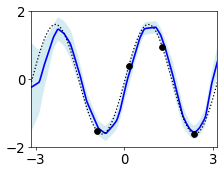

<Figure size 440x550 with 0 Axes>

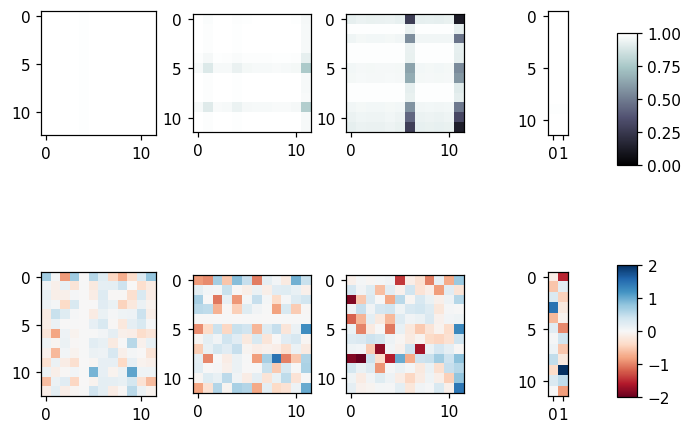

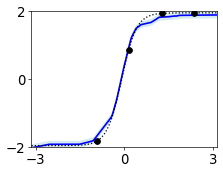

<Figure size 440x550 with 0 Axes>

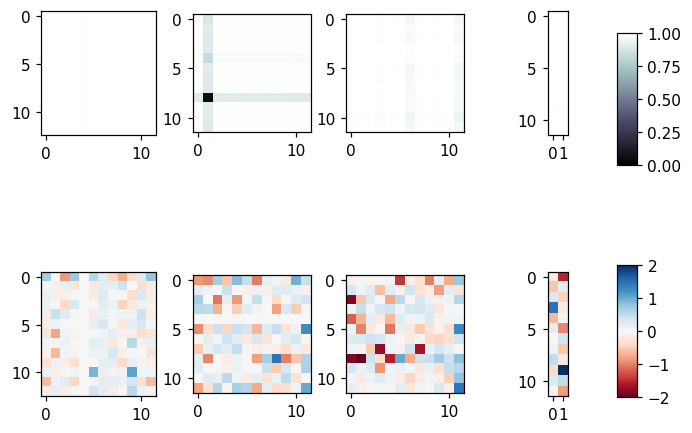

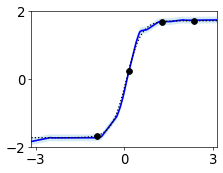

<Figure size 440x550 with 0 Axes>

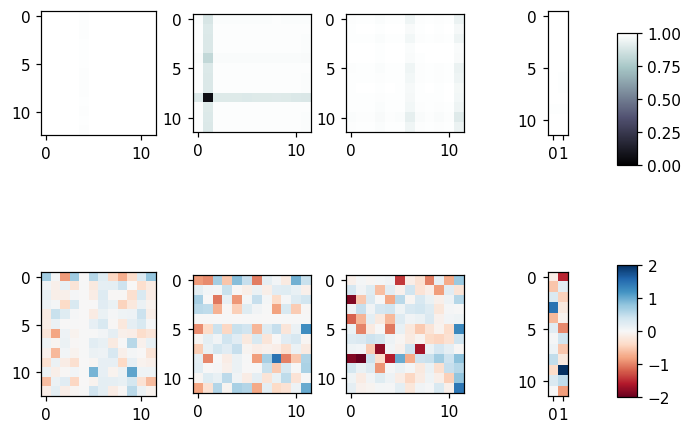

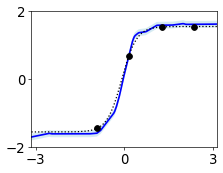

<Figure size 440x550 with 0 Axes>

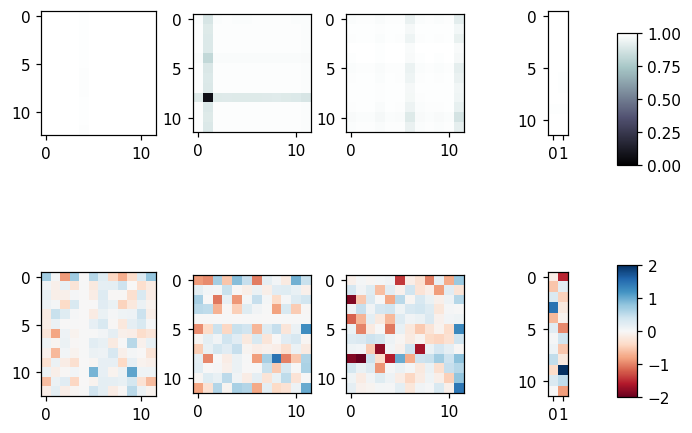

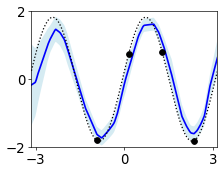

<Figure size 440x550 with 0 Axes>

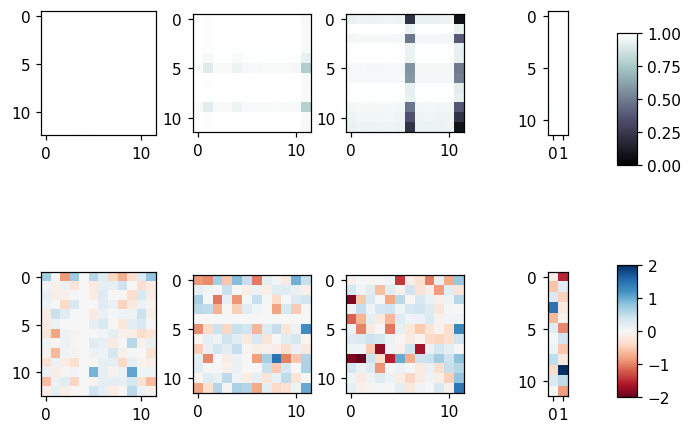

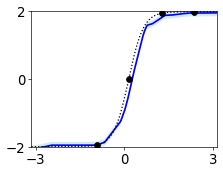

<Figure size 440x550 with 0 Axes>

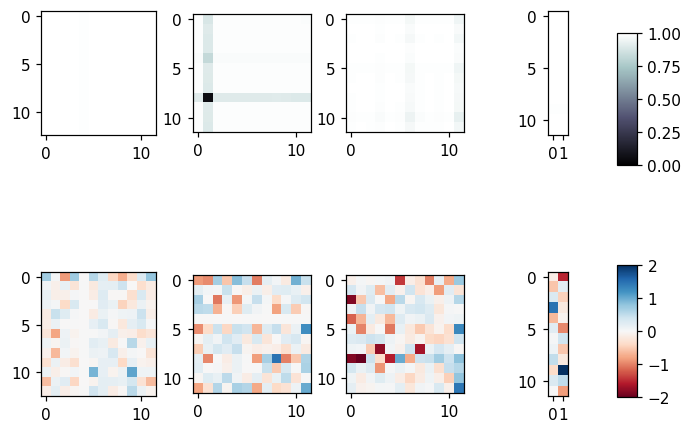

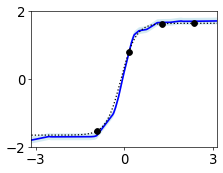

<Figure size 440x550 with 0 Axes>

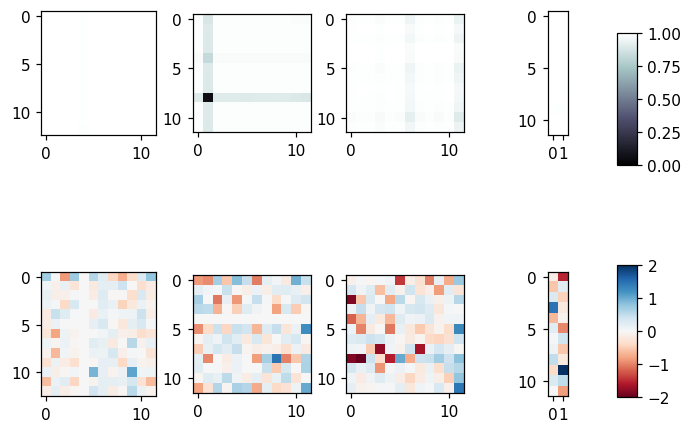

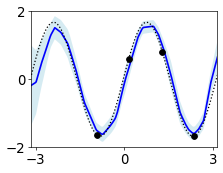

<Figure size 440x550 with 0 Axes>

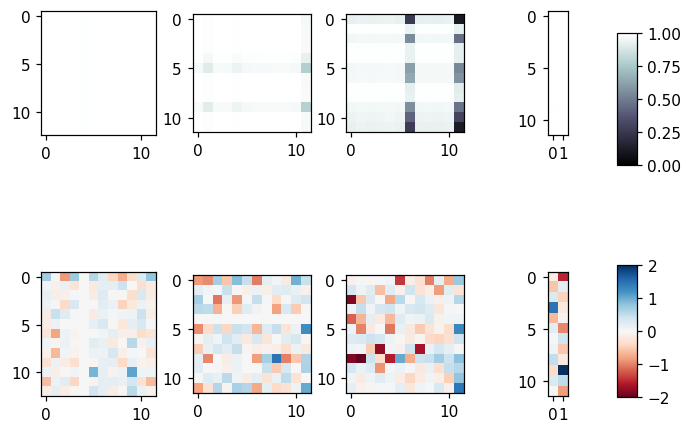

In [12]:
for j in range(8):
    x_t = x[j, :, :].unsqueeze(0).cuda()
    y_t = y[j, :, :].unsqueeze(0).cuda()
    x_c = x[j, loc[:num_context], :].unsqueeze(0).cuda()
    y_c = y[j, loc[:num_context], :].unsqueeze(0).cuda()


    pred = model(x_c, y_c, x_t, y_t)

    context_inds = torch.argsort(x_c[0, :, 0])
    y_c_sorted = y_c[0, context_inds, :].unsqueeze(0)
    x_c_sorted = x_c[0, context_inds, :].unsqueeze(0)

    m_y_sorted = pred[0][0, :, :].unsqueeze(0) 
    s_y_sorted = pred[1][0, :, :].unsqueeze(0)      



    target_x = x_t.detach().cpu().numpy()
    target_y = y_t.detach().cpu().numpy()

    context_x = x_c_sorted.detach().cpu().numpy()
    context_y = y_c_sorted.detach().cpu().numpy()
    mu_p = m_y_sorted.detach().cpu().numpy()
    std_p = s_y_sorted.detach().cpu().numpy()

    #             # Plot everythong
    rcParams['figure.dpi'] = 60
    fig = plt.figure(figsize=(4, 3))

                #plt.plot(target_x[0], mu_p[0], 'b', linewidth=2        
    plt.plot(target_x[0], mu_p[0], 'blue', linewidth=2, alpha = 1)


              #plt.plot(target_x[0, :, 0], pred_y[0, :, 0] + std[0, :, 0], 'lightblue', linewidth=0.4, alpha = 0.7 )
              #plt.plot(target_x[0, :, 0], pred_y[0, :, 0] - std[0, :, 0], 'lightblue', linewidth=0.4, alpha = 0.7 )   

    plt.fill_between(
        target_x[0, :, 0],
        mu_p[0, :, 0] - std_p[0, :, 0],
        mu_p[0, :, 0] + std_p[0, :, 0],
        alpha=0.5,
        facecolor='lightblue',
        interpolate=True)

    plt.plot(target_x[0], target_y[0], 'k:', linewidth=1.5)
    plt.plot(context_x[0], context_y[0], 'ko', markersize=7)



    #             plt.title(f"test . Graphic {j}")
    plt.yticks([-2, 0, 2], fontsize=16)
    plt.xticks([-3, 0, 3], fontsize=16)
    plt.ylim([-2,2])
    plt.xlim(-pi, pi)
    #             plt.grid('off')
    # #             ax = plt.gca()
    plt.show()
    fig.savefig(f'./imgs/bnp_variational_{args.alpha}_{j}th_line.png', transparent=True,  dpi=200, bbox_inches = 'tight')


    rcParams['figure.dpi'] = 110
    plt.figure(figsize=(4,5))
    r_c = model.det_encoder(x_c, y_c, x_t)
    r = r_c.mean(1, keepdim=True)
    pmaps, wmaps = pmap(model,r)

    num_layer = 4
    fig, axes = plt.subplots(nrows=2, ncols=num_layer)
    cid = 0
    switch = 0
    for ax in axes.flat:
        #ax.axis('off')
        #fig.patch.set_visible(False)
        #ax.patch.set_visible(False)
                    #ax.set_xticks([])
                    #ax.set_yticks([])
                    #plt.xticks(x, " ")

        if switch < num_layer:
            im = ax.imshow((pmaps[switch][cid].t()), cmap='bone', vmin=0, vmax=1) #, interpolation='nearest')
            switch += 1

            if switch == num_layer:
                cbar_ax = fig.add_axes([1, 0.65, 0.03, 0.3])
                fig.colorbar(im, cax=cbar_ax) 

        else:
            im = ax.imshow(wmaps[switch-num_layer].t(), cmap='RdBu', vmin=-2, vmax=2)
            switch += 1
            if switch == num_layer*2:
                cbar_ax = fig.add_axes([1, 0.124, 0.03, 0.3])
                fig.colorbar(im, cax=cbar_ax)

    #             ax.spines['right'].set_color('gray')
    #             ax.spines['right'].set_linewidth(0.5)
    #             ax.spines['right'].set_linestyle('-')

    #             ax.spines['left'].set_color('gray')
    #             ax.spines['left'].set_linewidth(0.5)
    #             ax.spines['left'].set_linestyle('-')

                #ax.spines['top'].set_color('none')
                #ax.spines['bottom'].set_color('none')
                #ax.spines['left'].set_color('none')

    #             ax.spines['top'].set_visible(False)
    #             ax.spines['bottom'].set_visible(False)
                #ax.spines['left'].set_visible(False)

                #     ax.set_xticklabels([])
                #     ax.set_xticklabels([])

    fig.subplots_adjust(right = 1, top=1, wspace=0.3, hspace=1.1)
                #fig.subplots_adjust(left = 0, bottom = 0, right = 1, top = 1, hspace = 0.1, wspace = 0)
                #
    plt.show()
    fig.savefig(f'./imgs/bnp_variational_{args.alpha}_{j}th_weight.png', transparent=True,  dpi=200, bbox_inches = 'tight')
